In [1]:
import pandas as pd
import numpy as np
import os
import fcsparser
import matplotlib.pyplot as plt 
import fcswrite
import random 


In [2]:
def fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
               spectrum_channels,scalex,sum_method = "median"):
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(2)
    plt.hist(data[peak_channel], edgecolor="black", bins=500) 
    plt.yscale('log')
    if scalex:
        plt.xscale('log')
    plt.axvspan(min, max, alpha=0.5, color='red')
    plt.title(filename+'\n'+peak_channel)
    plt.show()

    data_sub = data.loc[(data[peak_channel]>min) & (data[peak_channel]<max)]
    data_sub = data_sub[chn_names]
    if sample_data:
        if len(data_sub)>sample_size:
            random.seed(123)
            data_sub = data_sub.sample(n=sample_size, replace=False, random_state=1)

    fcswrite.write_fcs(filename=Output_dir+"/"+filename,
                        chn_names=chn_names,
                        data=data_sub)
    data_sub.to_pickle(Output_dir+"/"+filename+".pkl")  
    
    spectrum_data = data_sub[spectrum_channels]
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(2)
    spectrum_line = np.mean(spectrum_data, axis=0)
    if sum_method == "median":
        spectrum_line[:] = np.median(spectrum_data, axis=0)
    plt.plot(spectrum_line)
    plt.title(filename)
    plt.xticks(rotation = 90)
    plt.show()

def gating(data,x_chan,y_chan,x_min,x_max,y_min,y_max,x_scale,y_scale):

    if len(data)>1000:
        random.seed(123)
        data_sample = data.sample(n=1000, replace=False, random_state=1)
    else:
        data_sample = data

    f = plt.figure()
    f.set_figwidth(6)
    f.set_figheight(4)
    plt.scatter(x = data_sample[x_chan],y =data_sample[y_chan],s = 1) 
    if y_scale:
        plt.yscale('log')
    if x_scale:
        plt.xscale('log')
    rectangle = plt.Rectangle(xy = (x_min,y_min), width = (x_max-x_min), height = (y_max-y_min), fc='None',ec="grey")
    plt.gca().add_patch(rectangle)
    #plt.axvspan(xmin = x_min,xmax = x_max,ymin = y_min,ymax = y_max,alpha=0.5, color='red')
    plt.show()

    data_sub = data.loc[(data[x_chan]>x_min) & (data[x_chan]<x_max)]
    data_sub = data_sub.loc[(data_sub[y_chan]>y_min) & (data_sub[y_chan]<y_max)]
    return(data_sub) 

In [ ]:
#Set Data dir and Output dir
Data_dir = 'E:/ResidualModel/python/Data'
Output_dir = 'E:/ResidualModel/python/Output_01_fcs_subset_xenith'
#Data_list = os.listdir(Data_dir)

In [ ]:
#prepare channel ids
path = Data_dir+"/scc_beads/SCC_Bead_CD2 Run 1 20241112143218.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
spectrum_channels = data.columns[19:70]
full_channels = data.columns

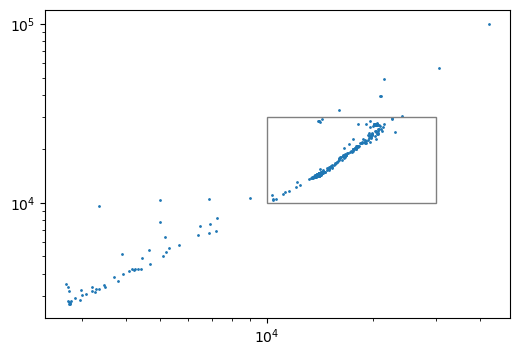

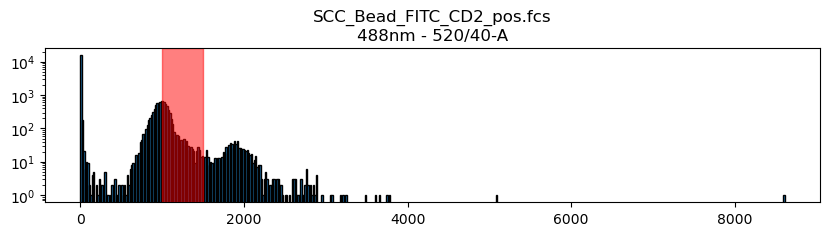

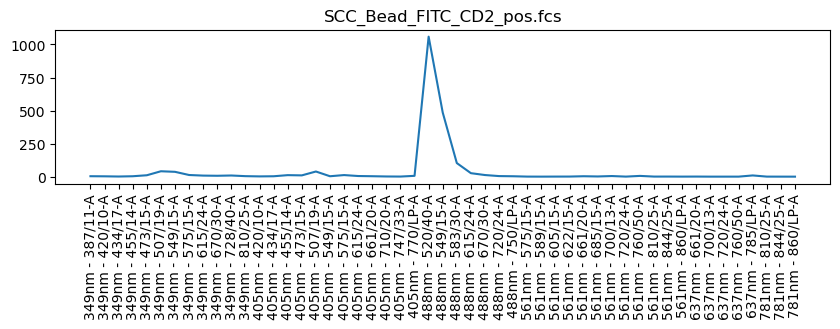

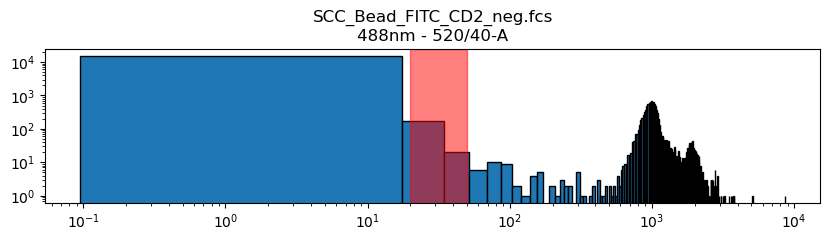

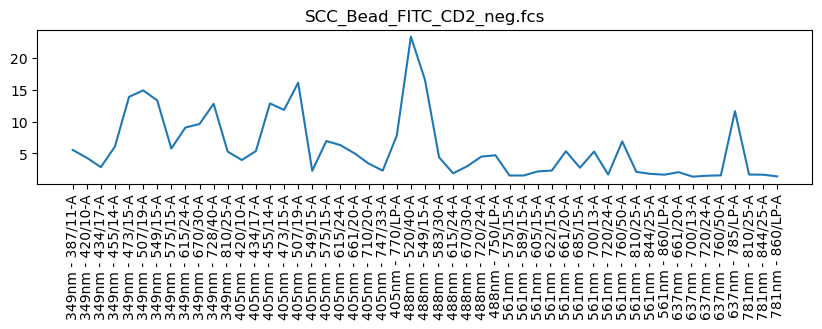

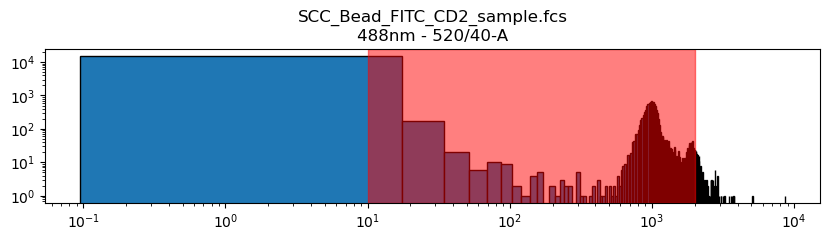

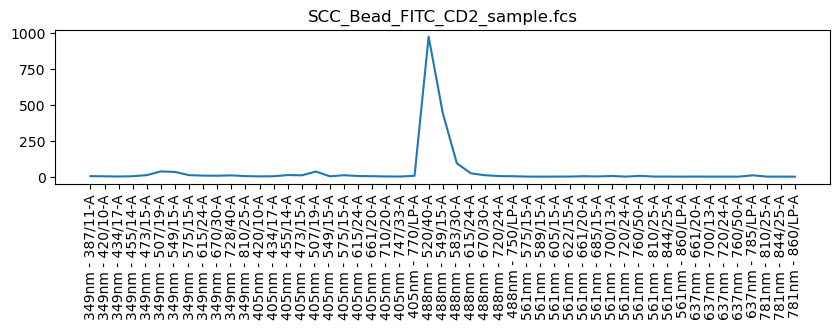

In [19]:
path = Data_dir+"/scc_beads/SCC_Bead_CD2 Run 1 20241112143218.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 520/40-A'

min = 1000
max = 1500
filename = 'SCC_Bead_FITC_CD2_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 20
max = 50
filename = 'SCC_Bead_FITC_CD2_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 2000
filename = 'SCC_Bead_FITC_CD2_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

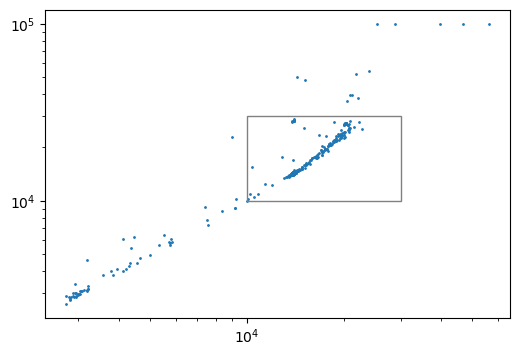

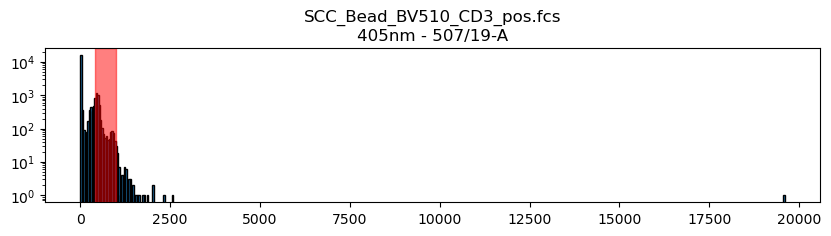

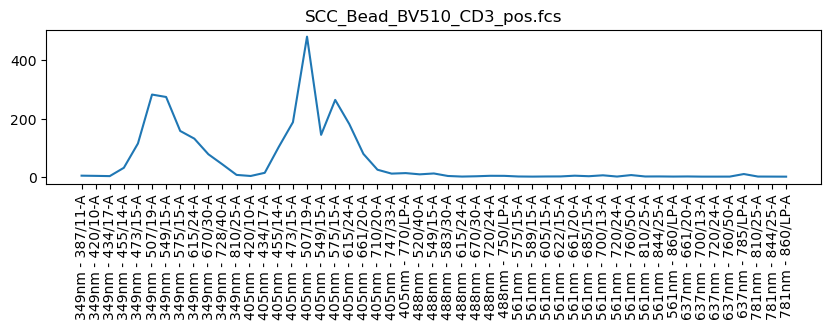

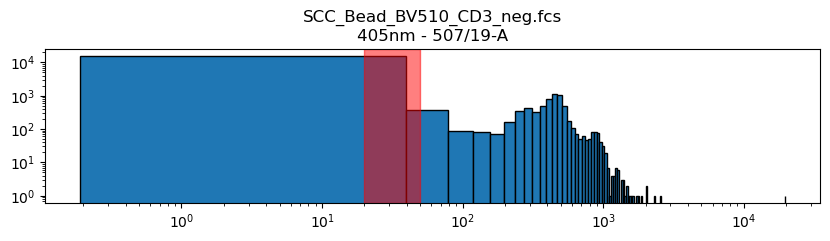

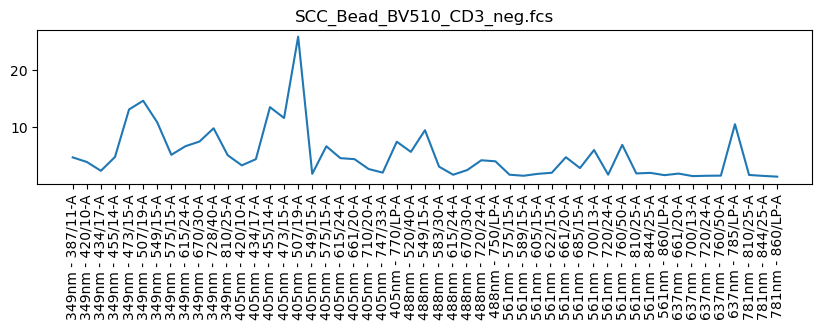

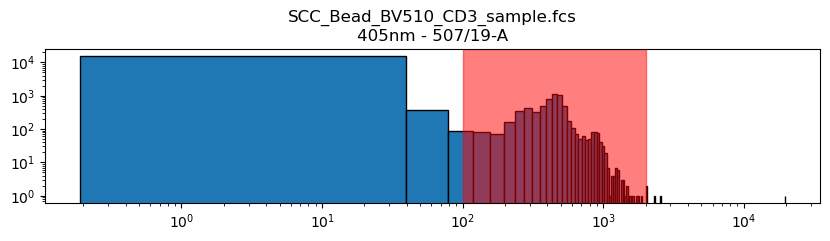

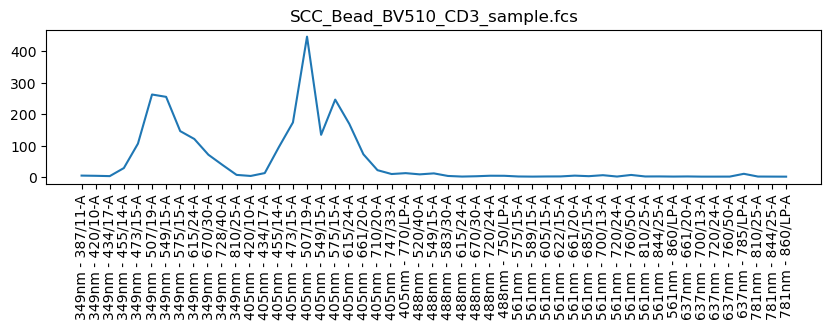

In [20]:
path = Data_dir+"/scc_beads/SCC_Bead_CD3 Run 1 20241112144058.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 507/19-A'

min = 400
max = 1000
filename = 'SCC_Bead_BV510_CD3_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 20
max = 50
filename = 'SCC_Bead_BV510_CD3_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 2000
filename = 'SCC_Bead_BV510_CD3_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

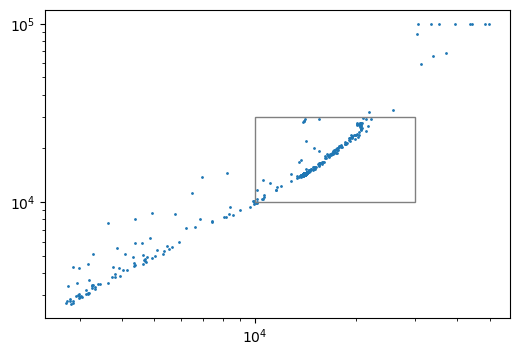

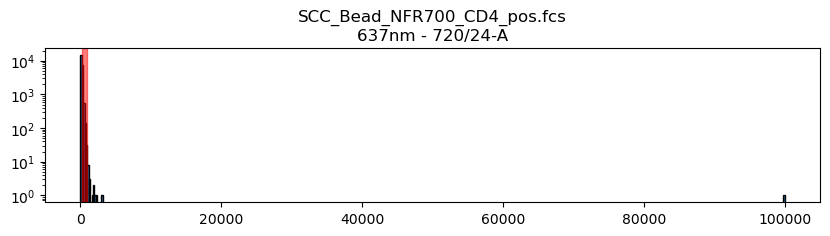

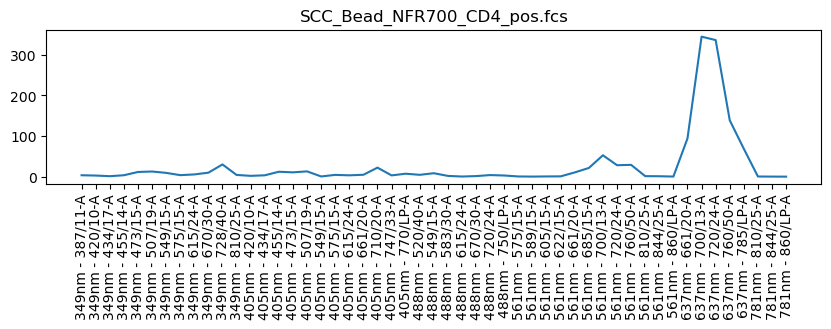

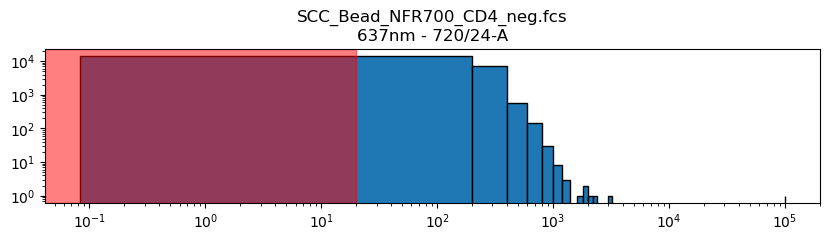

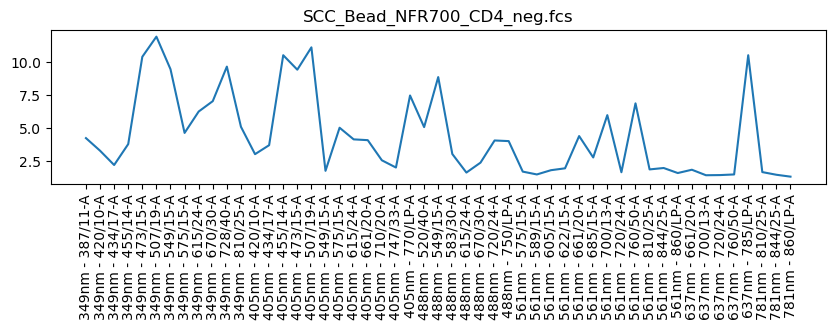

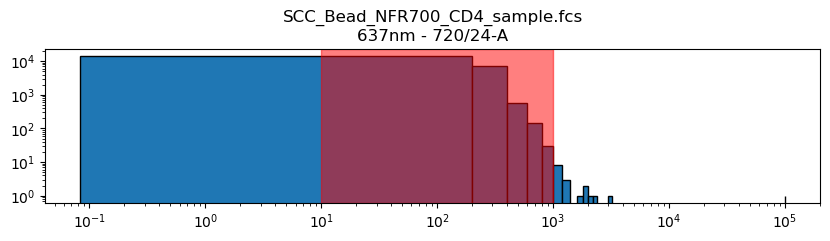

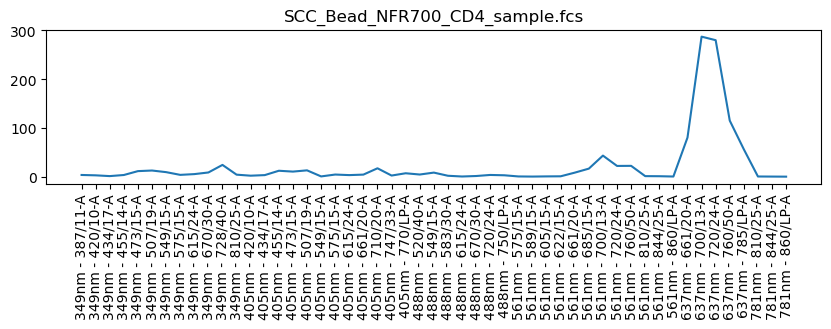

In [21]:
path = Data_dir+"/scc_beads/SCC_Bead_CD4 Run 1 20241112150459.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 720/24-A'

min = 300
max = 1000
filename = 'SCC_Bead_NFR700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 0
max = 20
filename = 'SCC_Bead_NFR700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 1000
filename = 'SCC_Bead_NFR700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

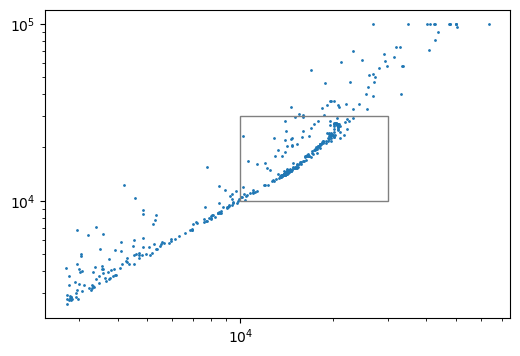

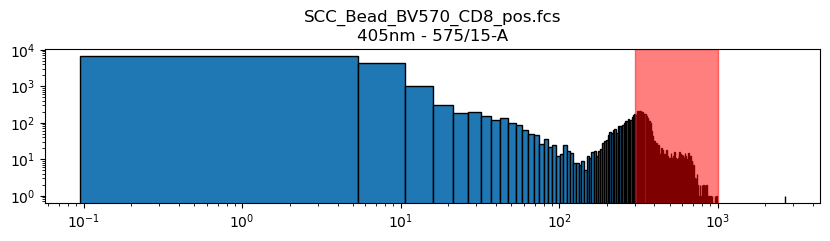

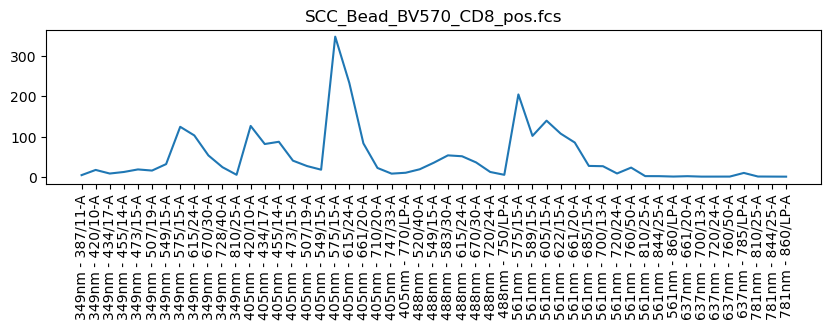

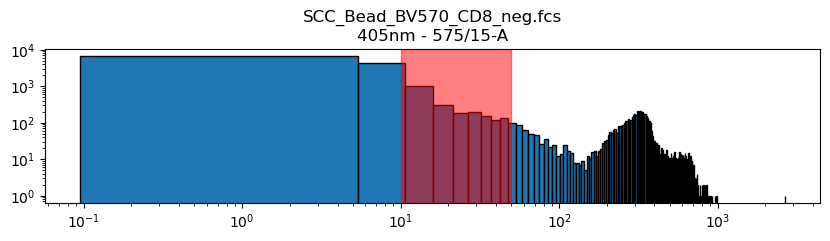

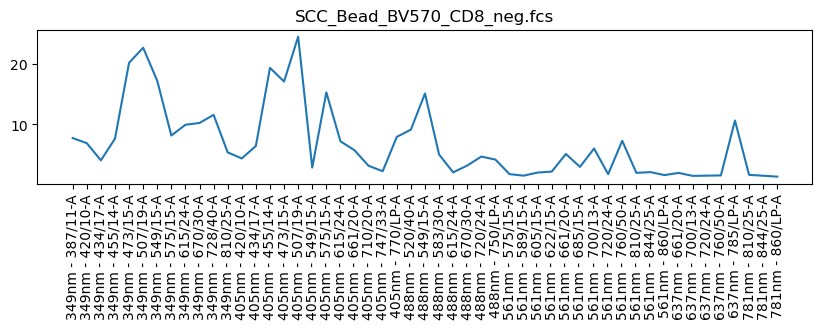

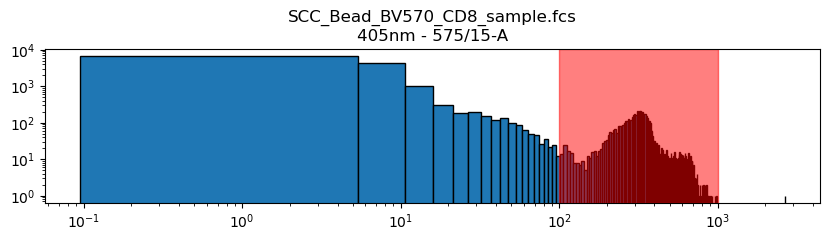

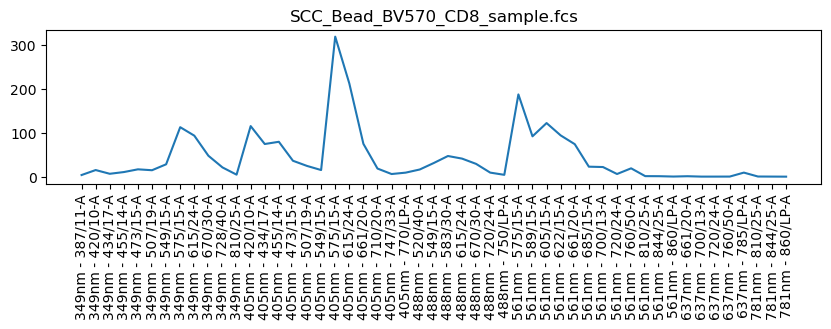

In [22]:
path = Data_dir+"/scc_beads/SCC_Bead_CD8 Run 1 20241112144937.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 575/15-A'

min = 300
max = 1000
filename = 'SCC_Bead_BV570_CD8_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BV570_CD8_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Bead_BV570_CD8_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

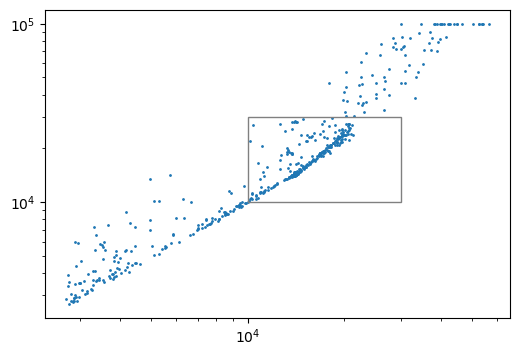

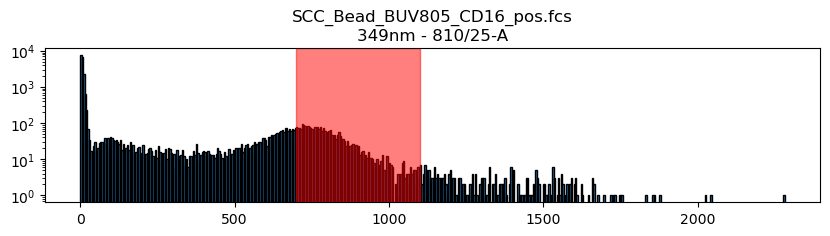

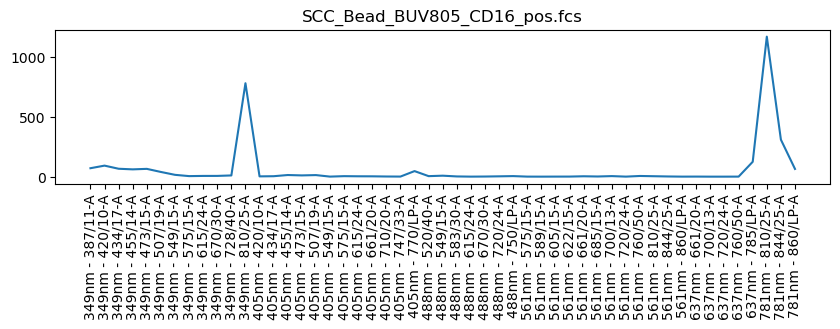

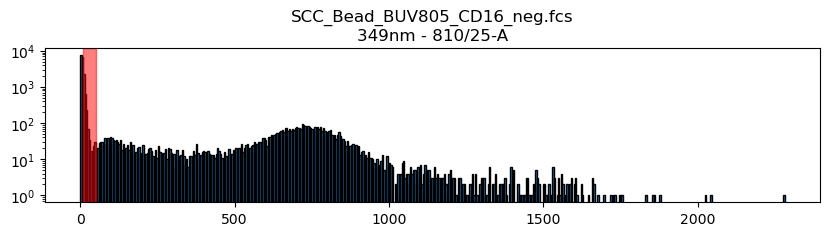

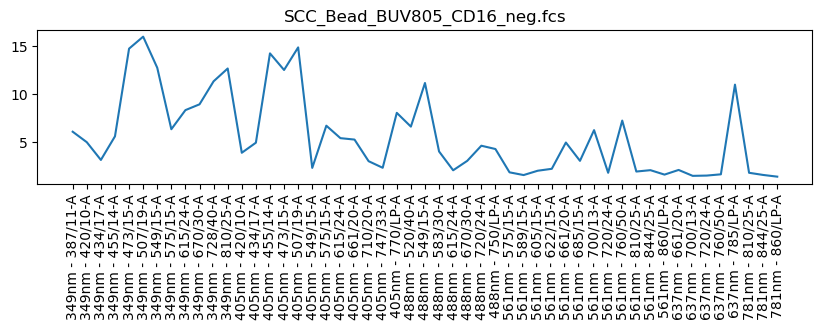

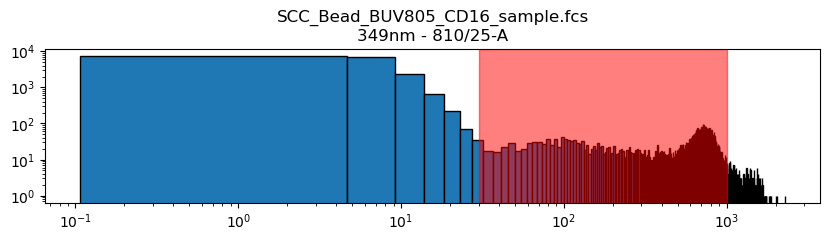

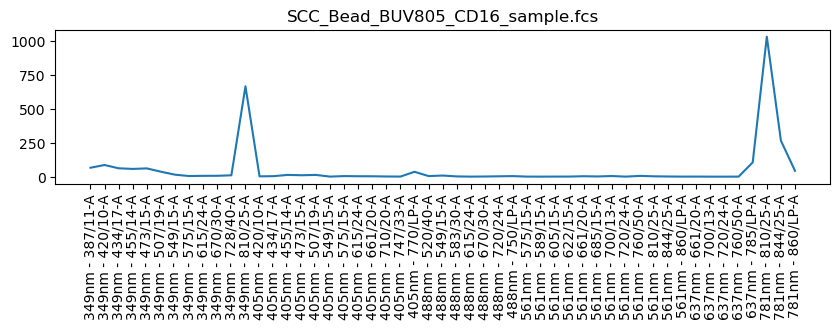

In [23]:
path = Data_dir+"/scc_beads/SCC_Bead_CD16 Run 1 20241112151638.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 810/25-A'

min = 700
max = 1100
filename = 'SCC_Bead_BUV805_CD16_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV805_CD16_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 30
max = 1000
filename = 'SCC_Bead_BUV805_CD16_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

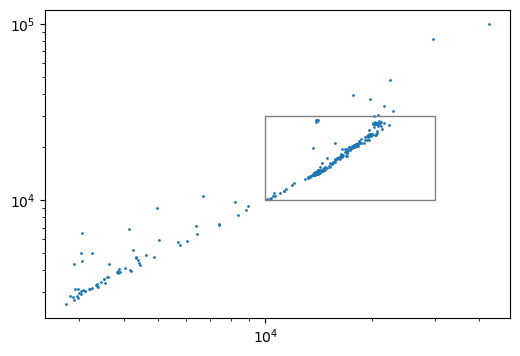

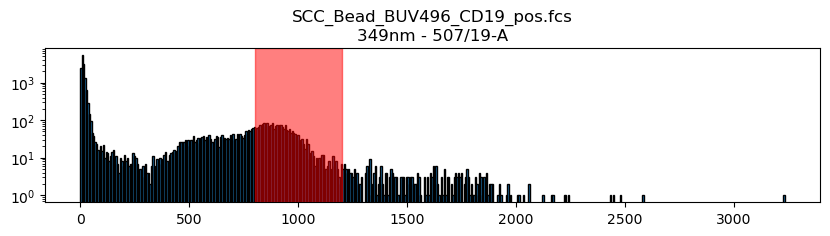

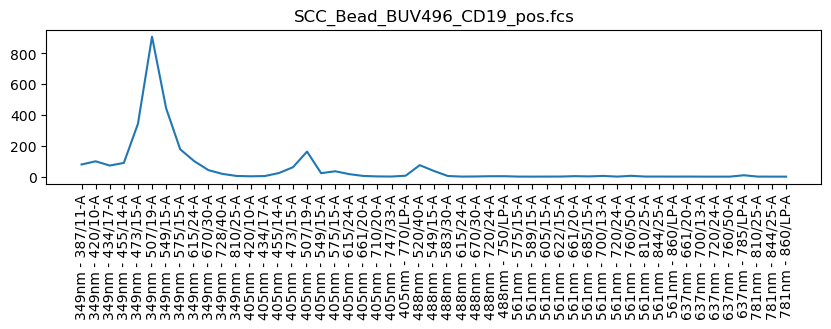

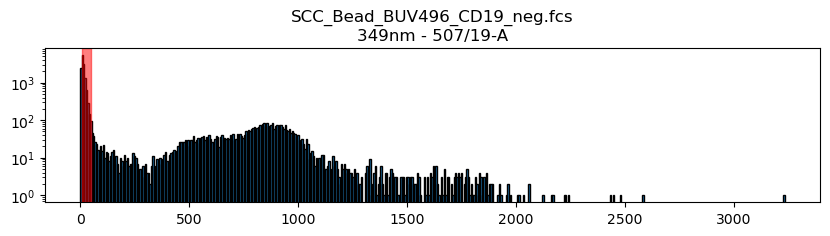

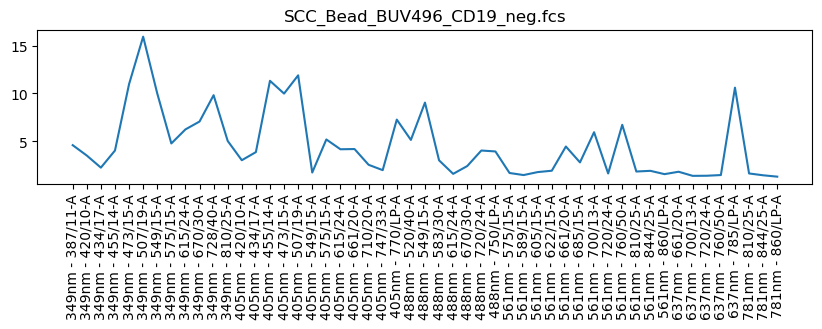

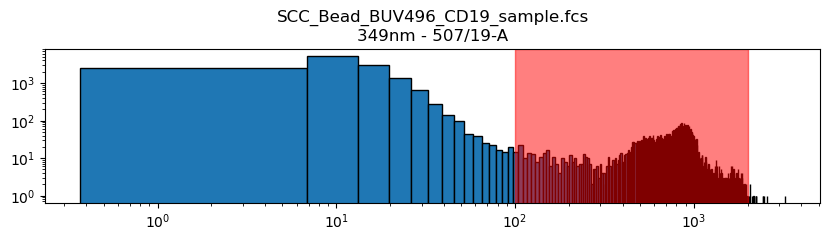

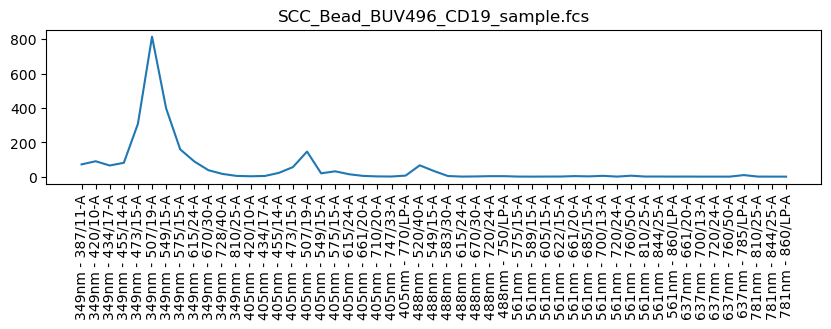

In [24]:
path = Data_dir+"/scc_beads/SCC_Bead_CD19 Run 1 20241112142629.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 507/19-A'

min = 800
max = 1200
filename = 'SCC_Bead_BUV496_CD19_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV496_CD19_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_Bead_BUV496_CD19_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

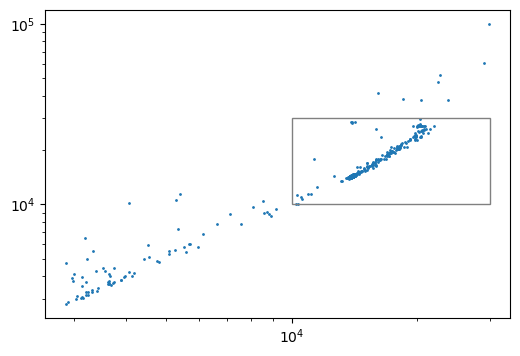

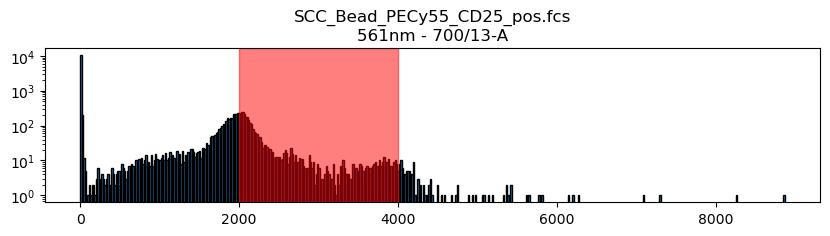

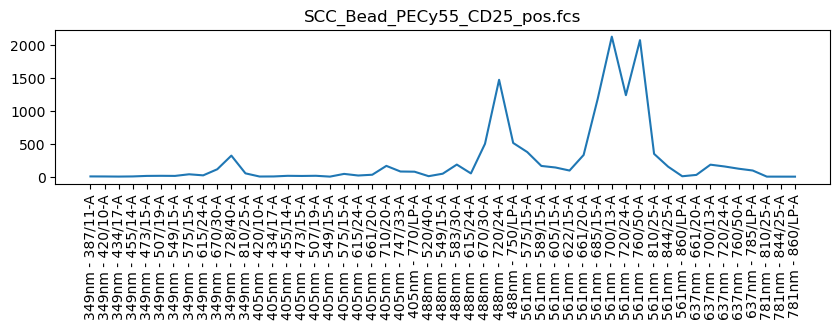

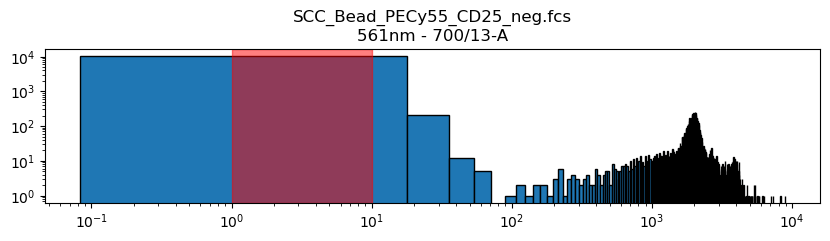

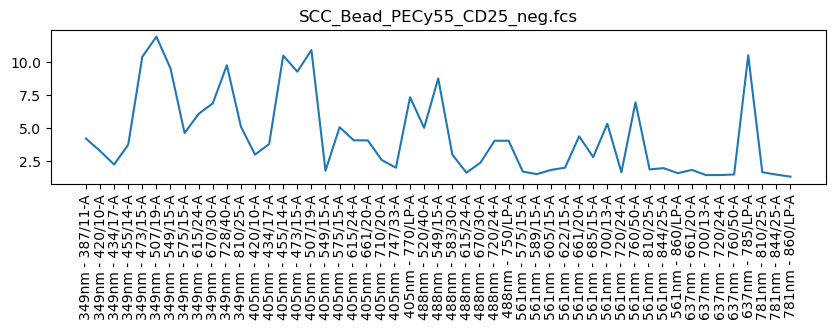

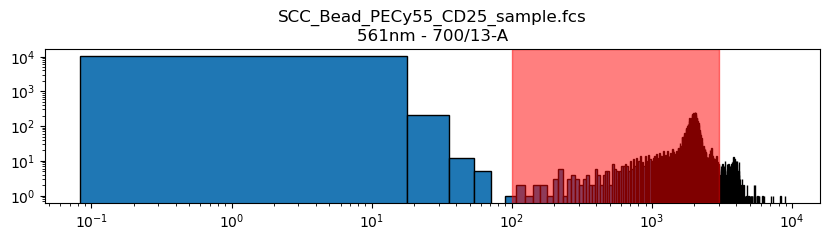

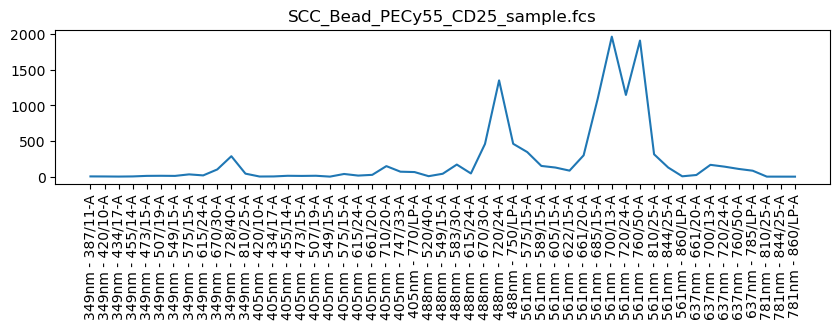

In [25]:
path = Data_dir+"/scc_beads/SCC_Bead_CD25 Run 1 20241112143510.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 700/13-A'

min = 2000
max = 4000
filename = 'SCC_Bead_PECy55_CD25_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Bead_PECy55_CD25_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 3000
filename = 'SCC_Bead_PECy55_CD25_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

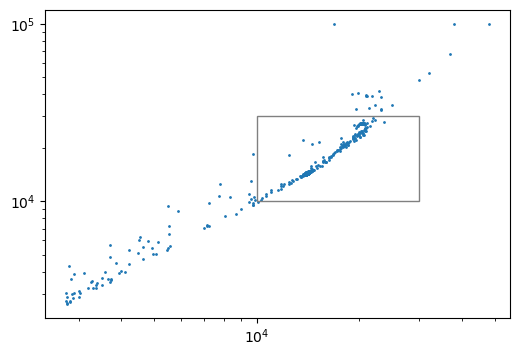

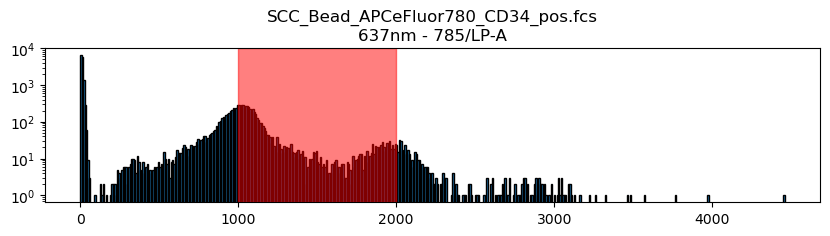

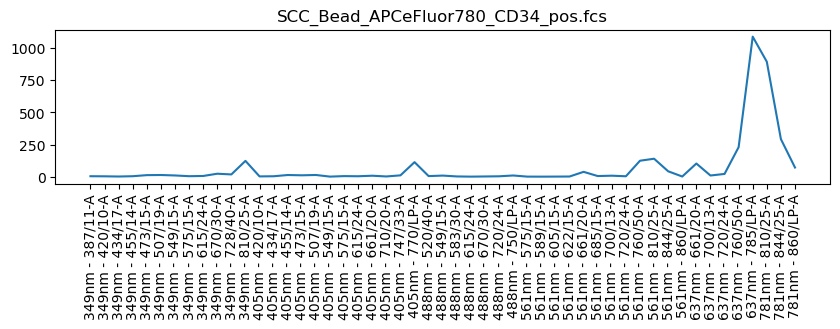

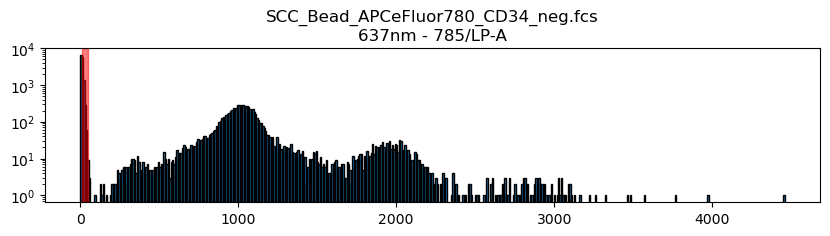

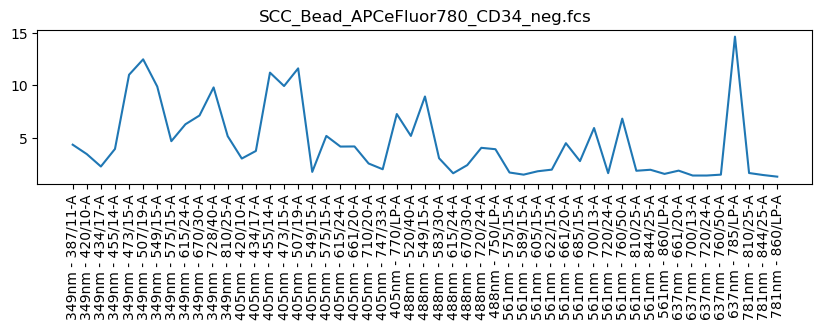

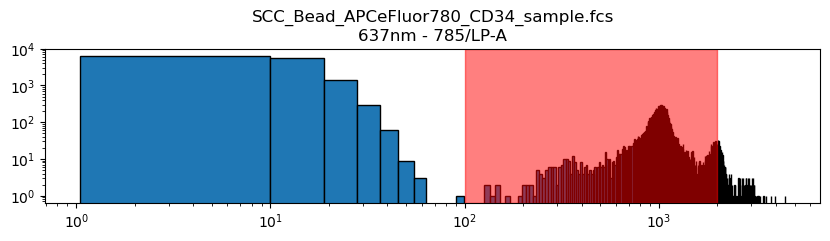

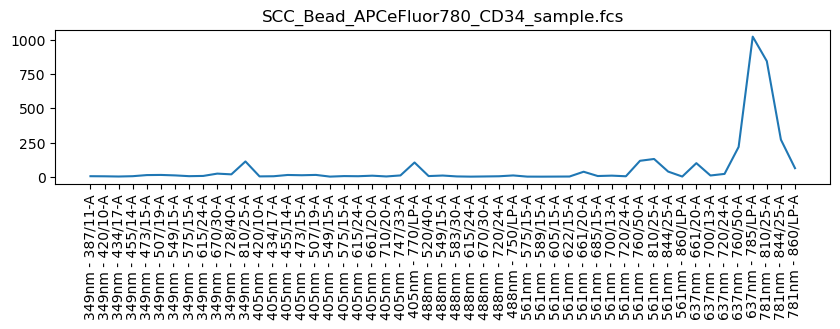

In [26]:
path = Data_dir+"/scc_beads/SCC_Bead_CD34 Run 1 20241112154837.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 785/LP-A'

min = 1000
max = 2000
filename = 'SCC_Bead_APCeFluor780_CD34_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_APCeFluor780_CD34_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_Bead_APCeFluor780_CD34_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

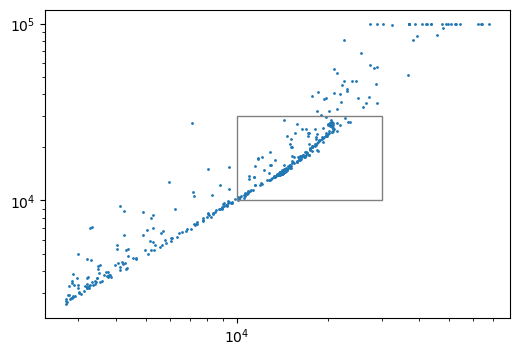

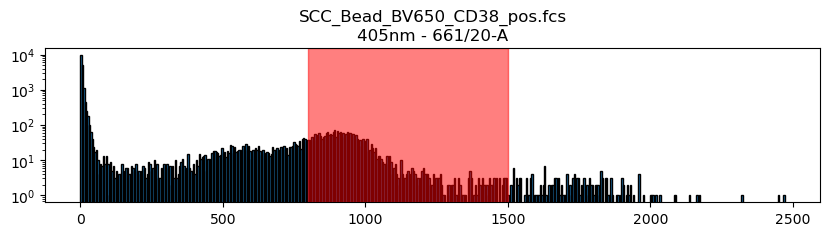

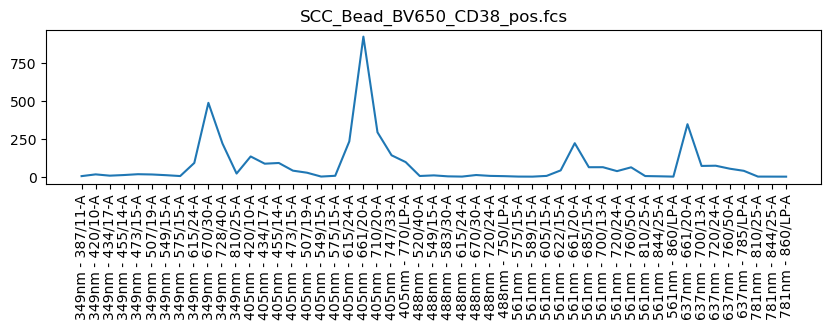

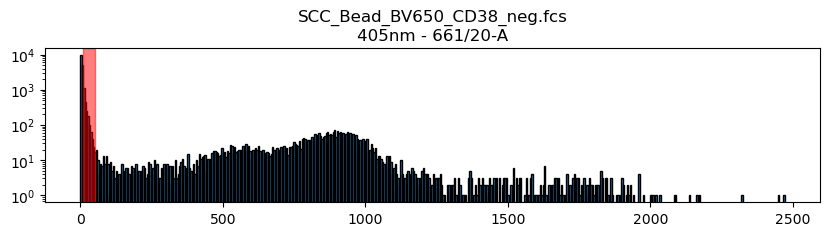

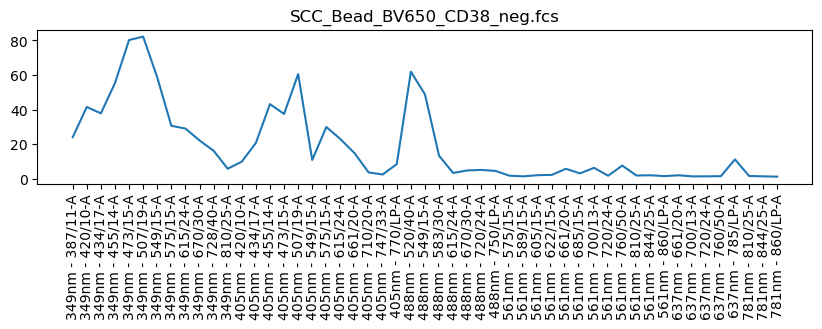

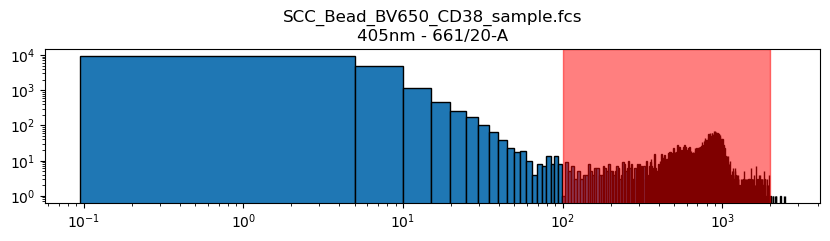

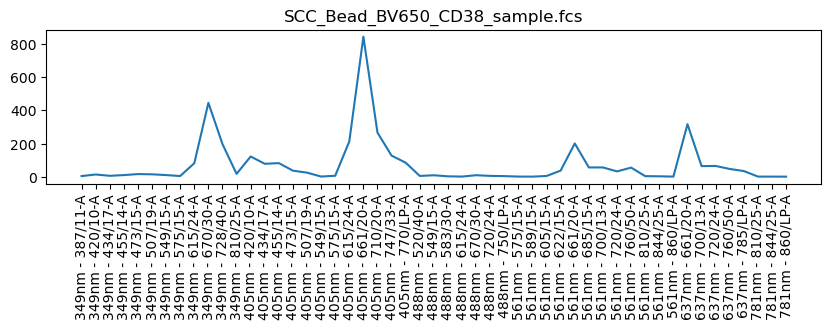

In [27]:
path = Data_dir+"/scc_beads/SCC_Bead_CD38 Run 1 20241112151049.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 661/20-A'

min = 800
max = 1500
filename = 'SCC_Bead_BV650_CD38_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BV650_CD38_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_Bead_BV650_CD38_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

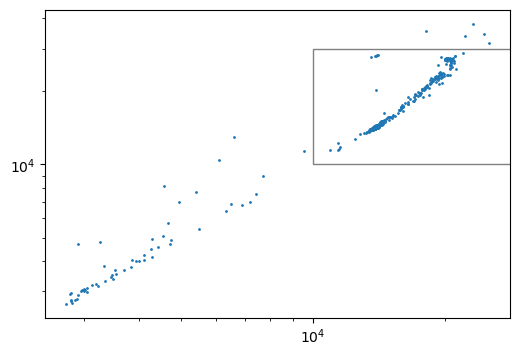

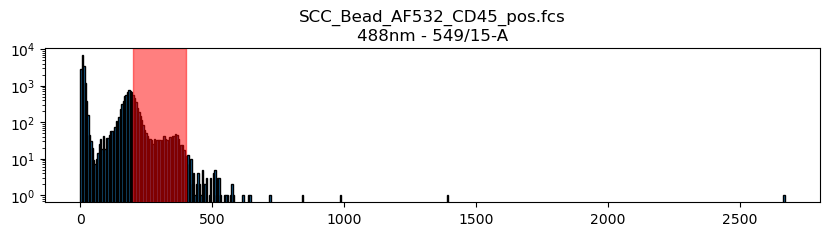

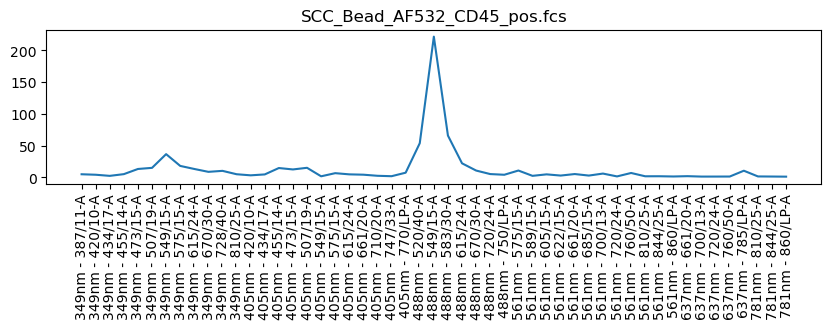

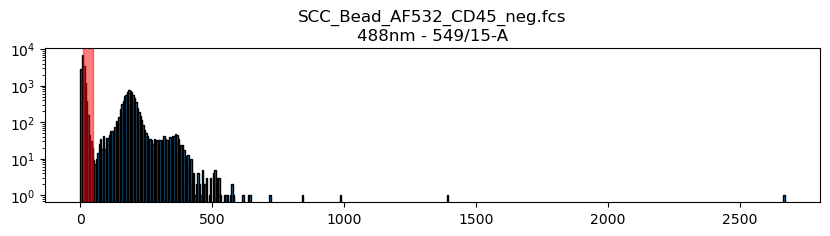

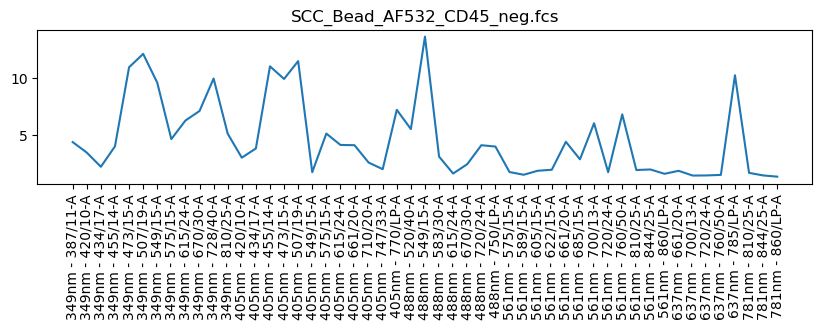

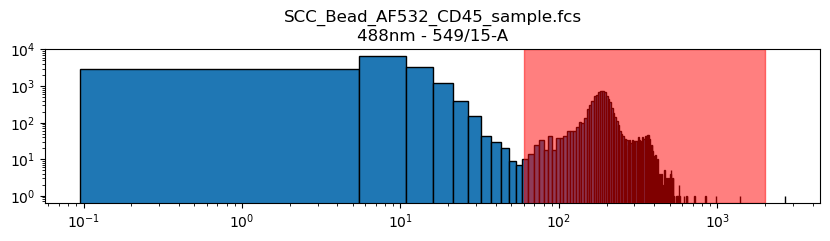

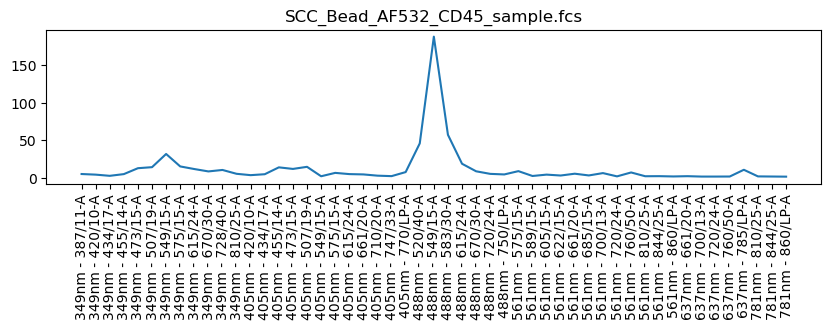

In [28]:
path = Data_dir+"/scc_beads/SCC_Bead_CD45 Run 1 20241112144351.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 549/15-A'

min = 200
max = 400
filename = 'SCC_Bead_AF532_CD45_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_AF532_CD45_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")



min = 60
max = 2000
filename = 'SCC_Bead_AF532_CD45_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

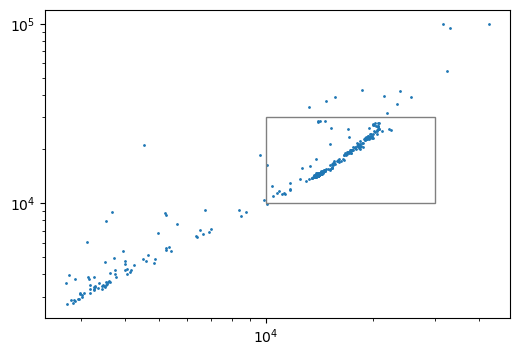

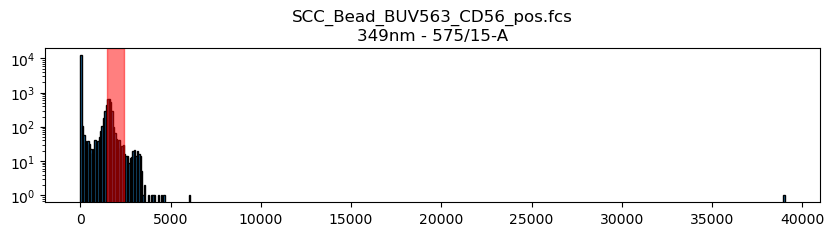

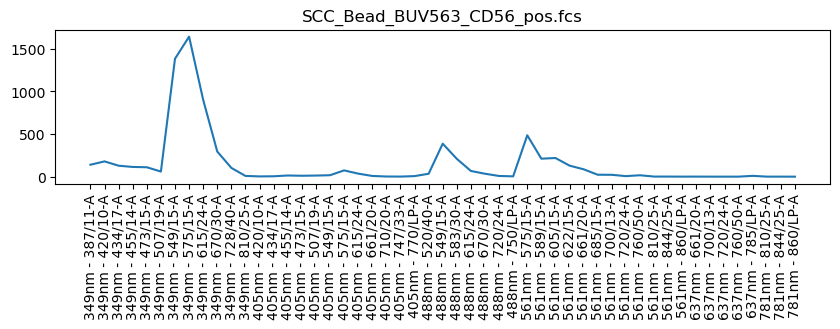

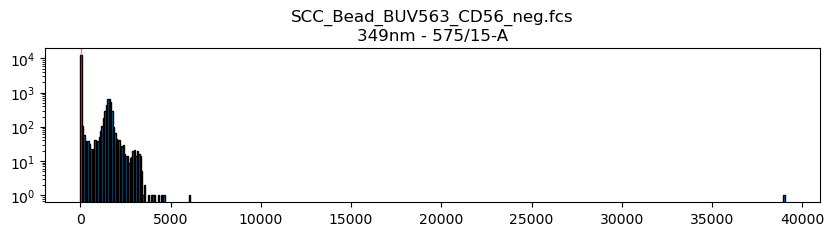

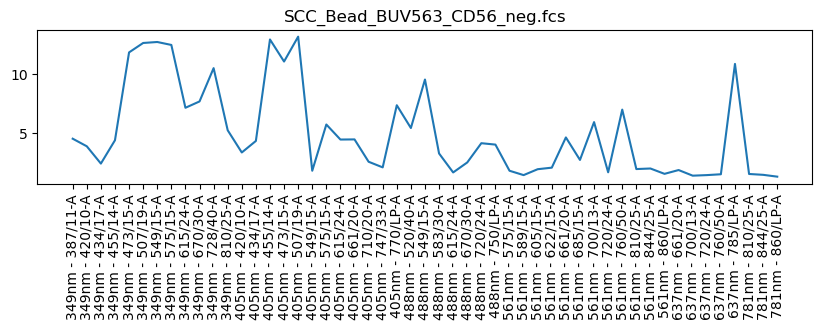

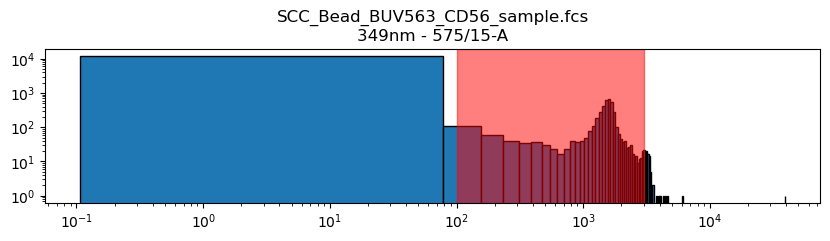

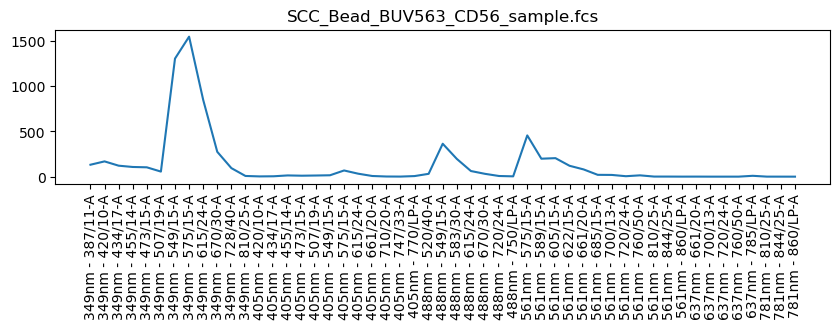

In [29]:
path = Data_dir+"/scc_beads/SCC_Bead_CD56 Run 1 20241112143805.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 575/15-A'

min = 1500
max = 2400
filename = 'SCC_Bead_BUV563_CD56_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV563_CD56_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 100
max = 3000
filename = 'SCC_Bead_BUV563_CD56_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

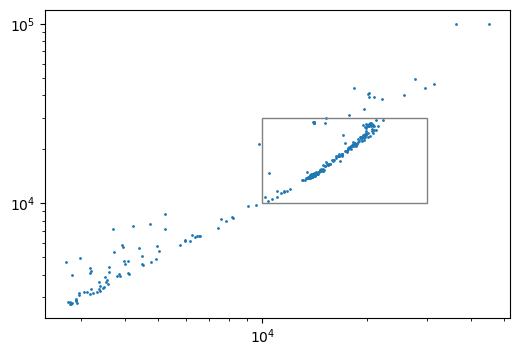

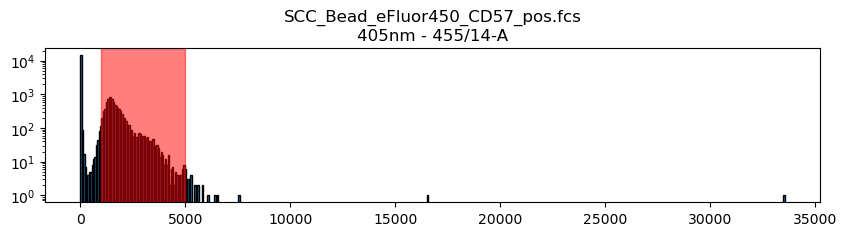

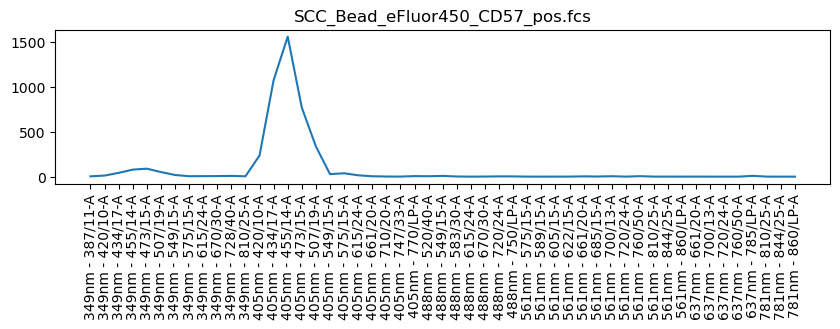

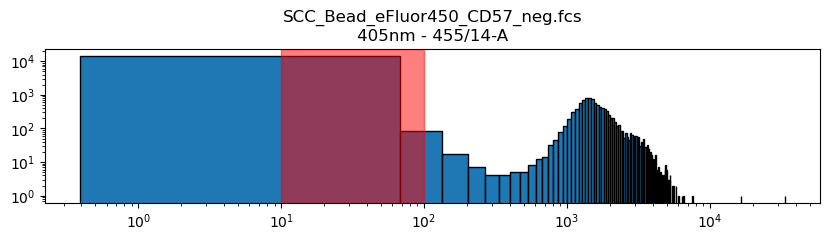

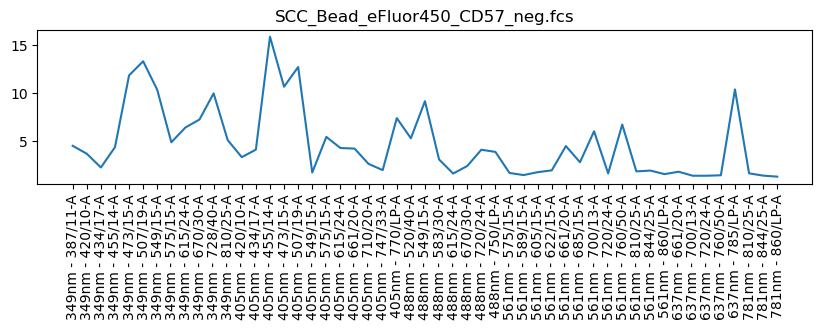

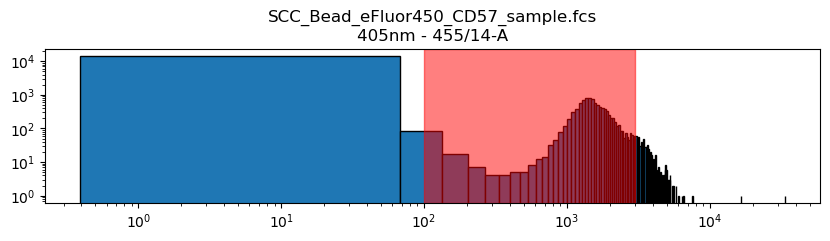

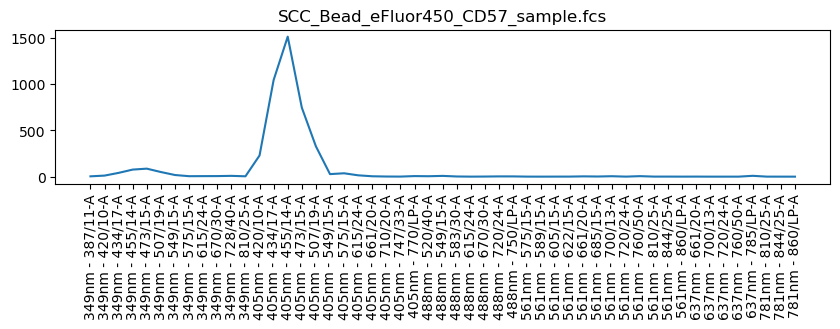

In [30]:
path = Data_dir+"/scc_beads/SCC_Bead_CD57 Run 1 20241112142337.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 455/14-A'

min = 1000
max = 5000
filename = 'SCC_Bead_eFluor450_CD57_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 100
filename = 'SCC_Bead_eFluor450_CD57_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 3000
filename = 'SCC_Bead_eFluor450_CD57_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

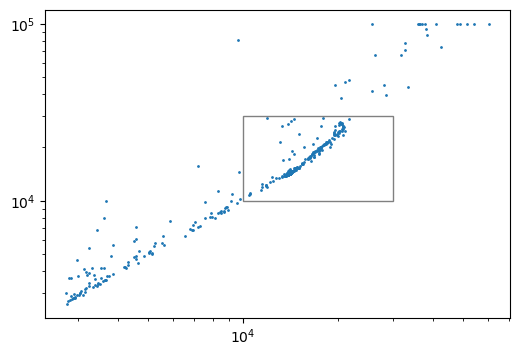

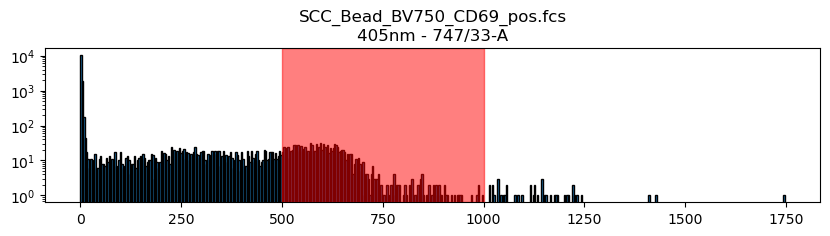

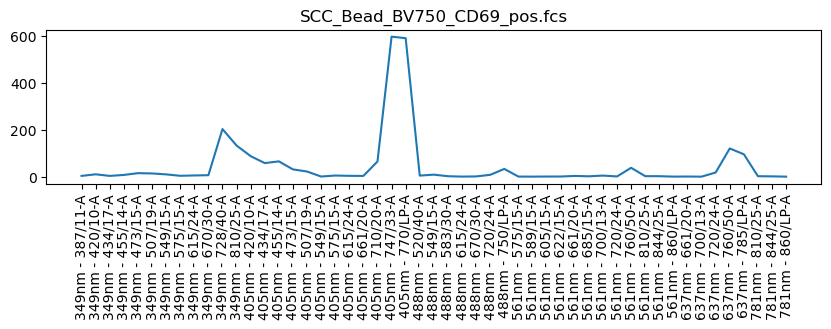

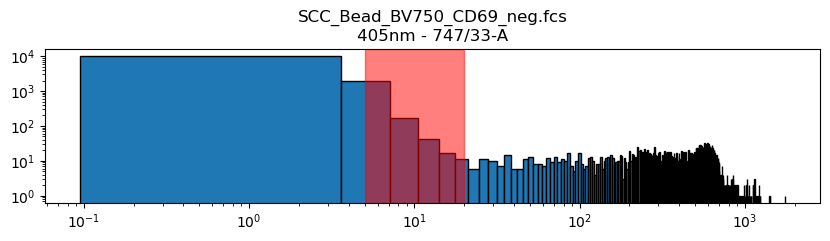

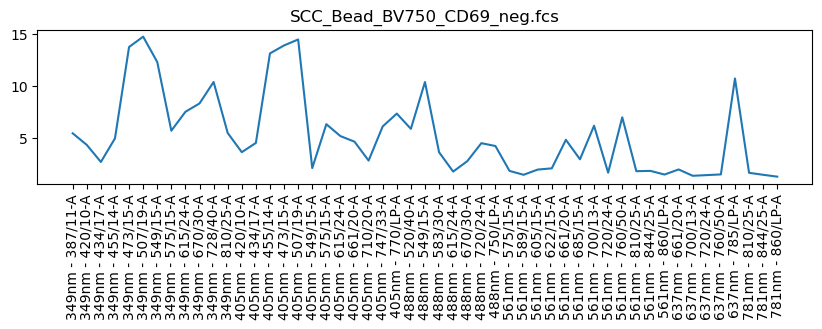

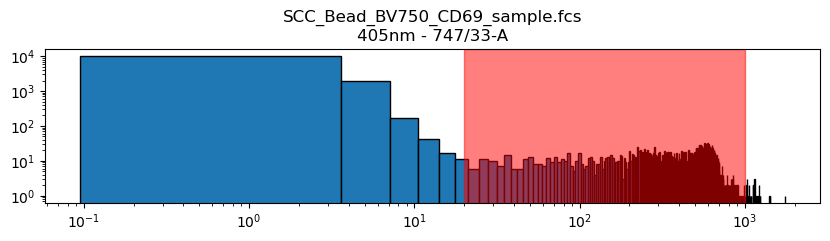

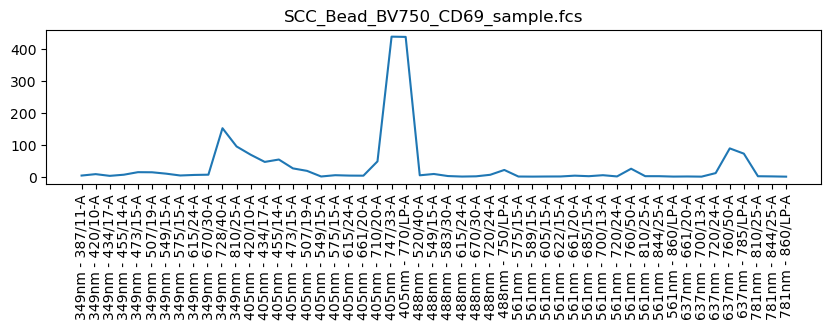

In [31]:
path = Data_dir+"/scc_beads/SCC_Bead_CD69 Run 1 20241112152511.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 747/33-A'

min = 500
max = 1000
filename = 'SCC_Bead_BV750_CD69_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 5
max = 20
filename = 'SCC_Bead_BV750_CD69_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 20
max = 1000
filename = 'SCC_Bead_BV750_CD69_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

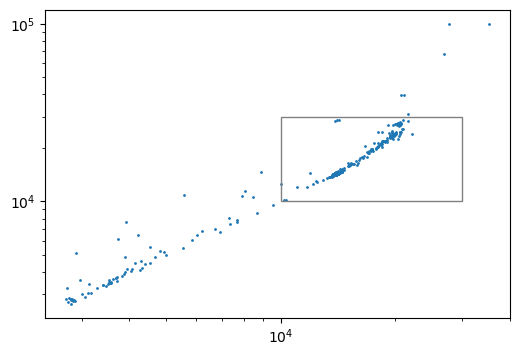

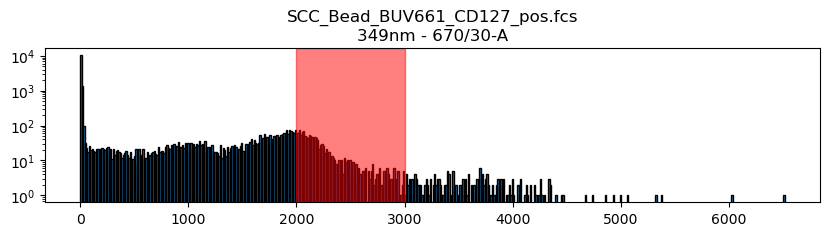

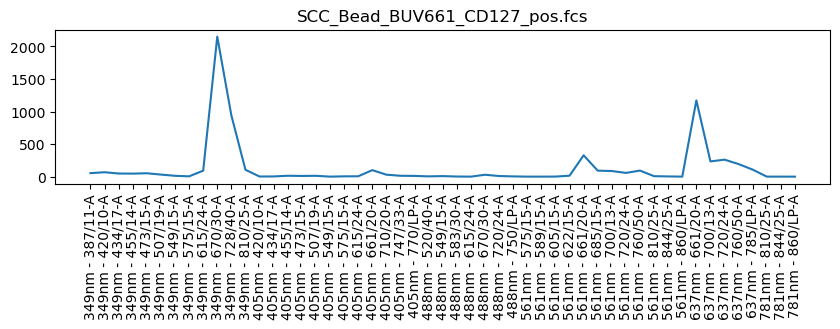

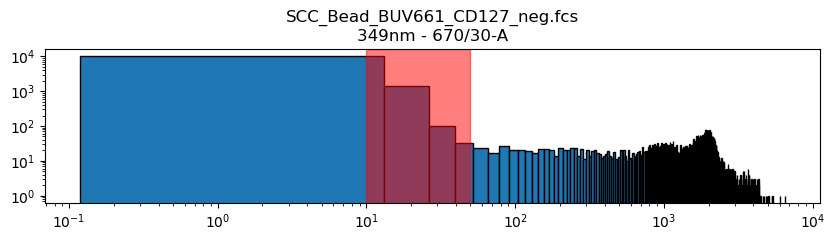

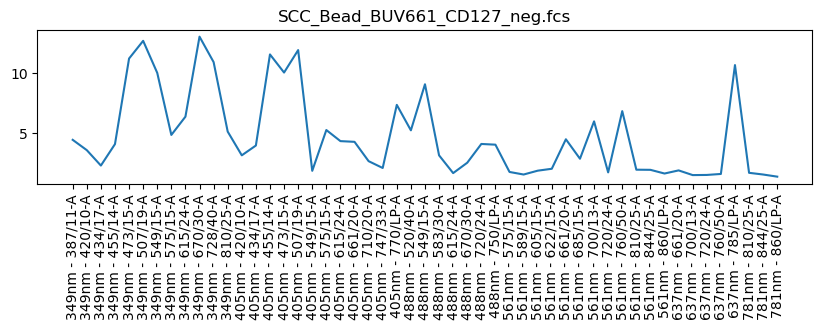

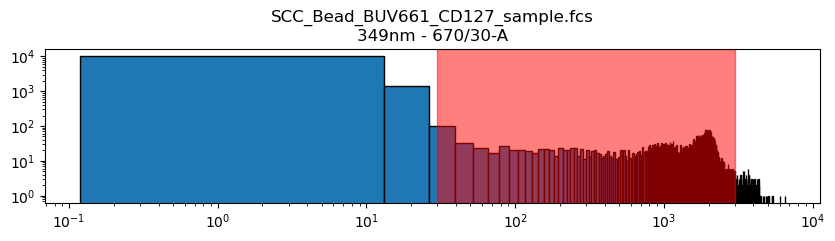

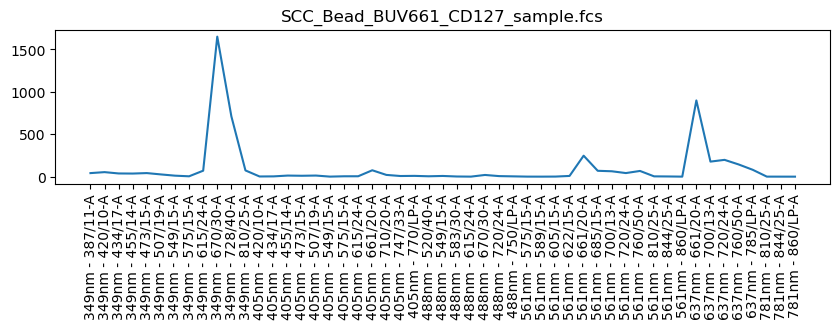

In [32]:
path = Data_dir+"/scc_beads/SCC_Bead_CD127 Run 1 20241112145901.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 670/30-A'

min = 2000
max = 3000
filename = 'SCC_Bead_BUV661_CD127_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV661_CD127_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 30
max = 3000
filename = 'SCC_Bead_BUV661_CD127_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

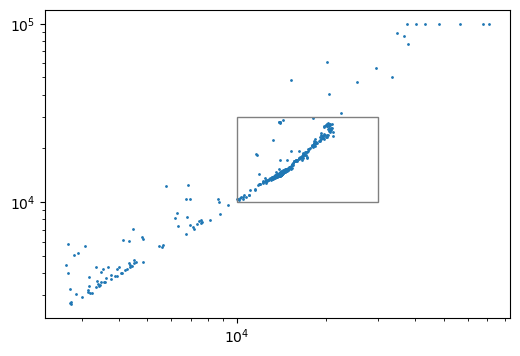

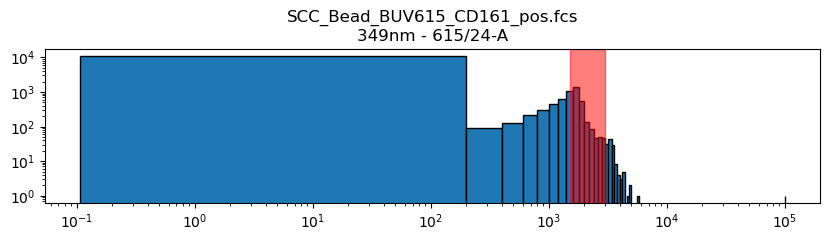

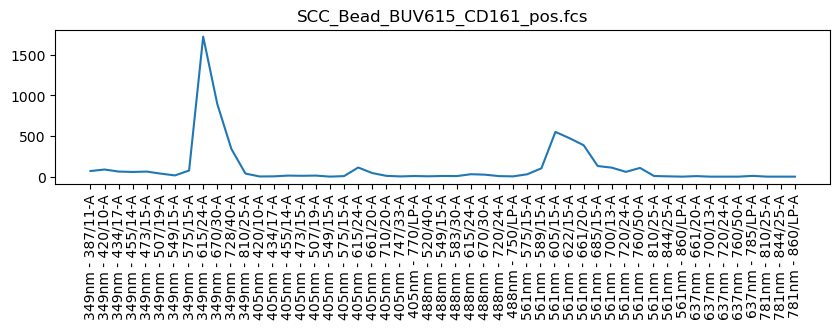

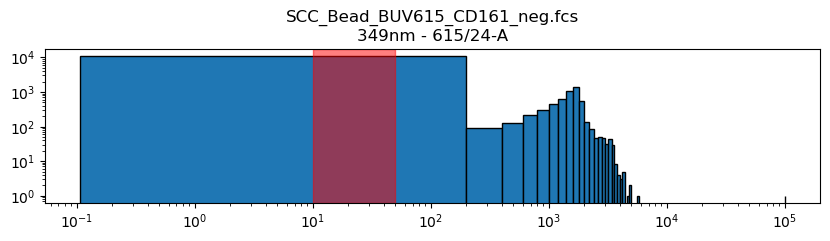

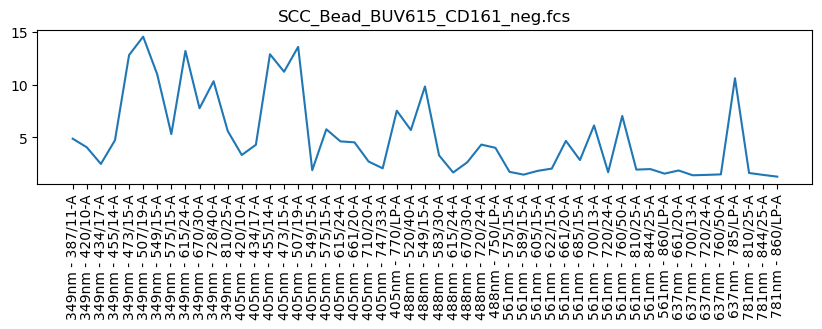

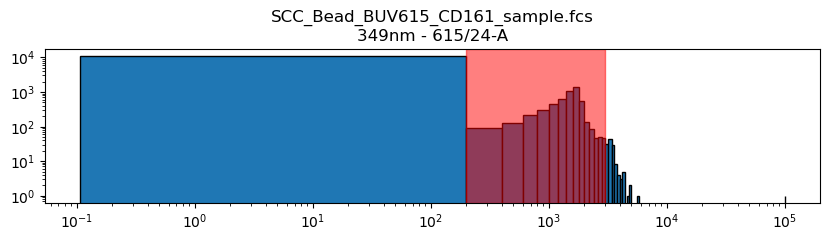

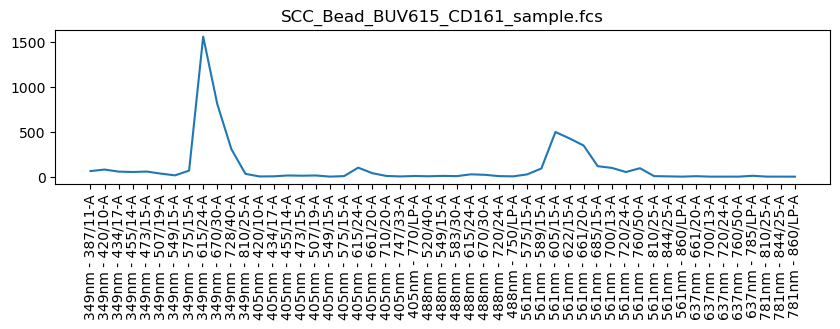

In [33]:
path = Data_dir+"/scc_beads/SCC_Bead_CD161 Run 1 20241112144644.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 615/24-A'

min = 1500
max = 3000
filename = 'SCC_Bead_BUV615_CD161_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV615_CD161_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 200
max = 3000
filename = 'SCC_Bead_BUV615_CD161_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

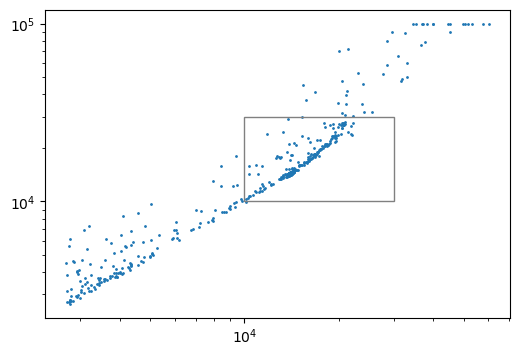

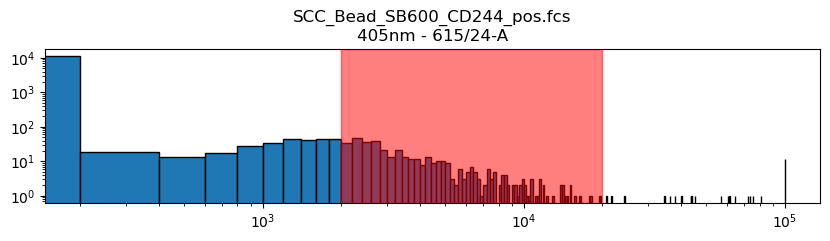

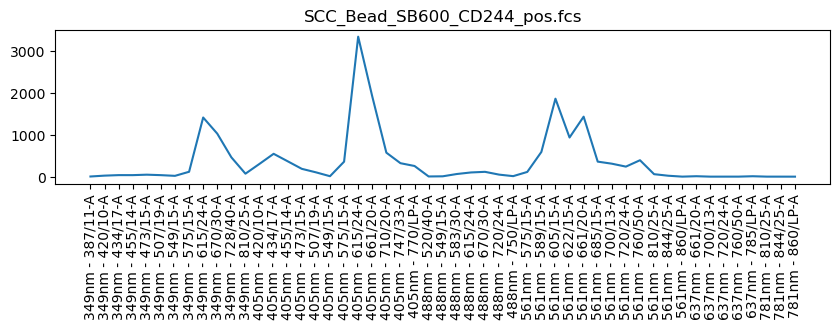

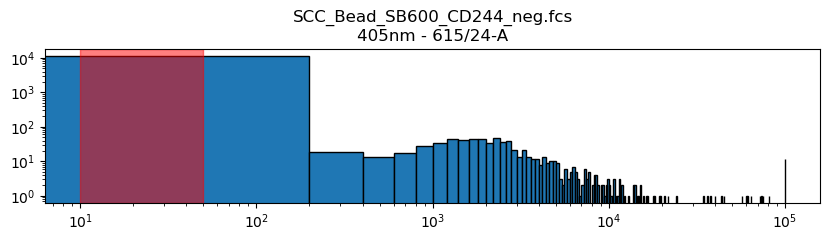

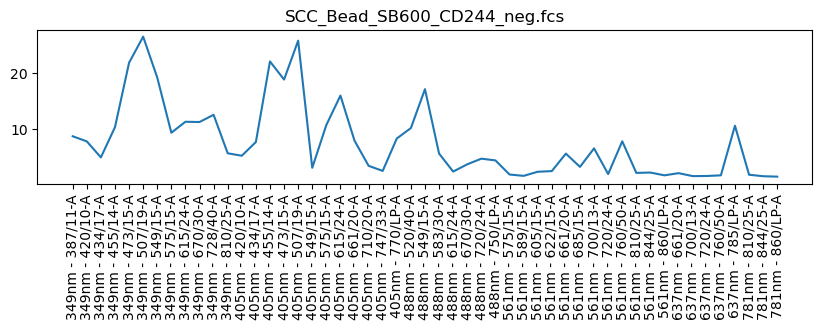

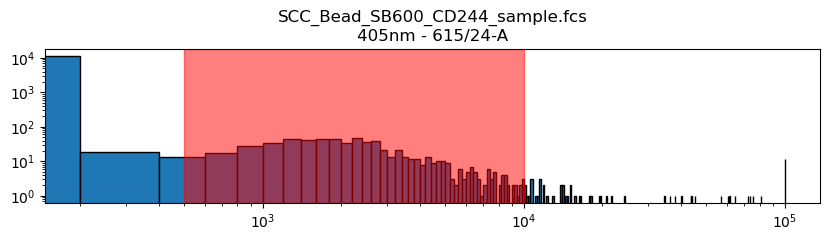

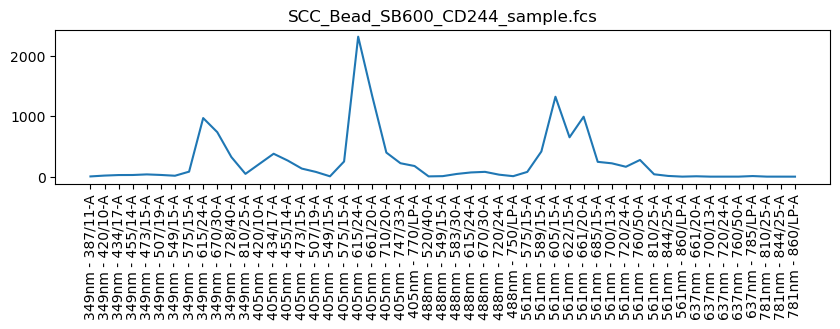

In [34]:
path = Data_dir+"/scc_beads/SCC_Bead_CD244 Run 1 20241112150157.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 615/24-A'

min = 2000
max = 20000
filename = 'SCC_Bead_SB600_CD244_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_SB600_CD244_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 500
max = 10000
filename = 'SCC_Bead_SB600_CD244_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

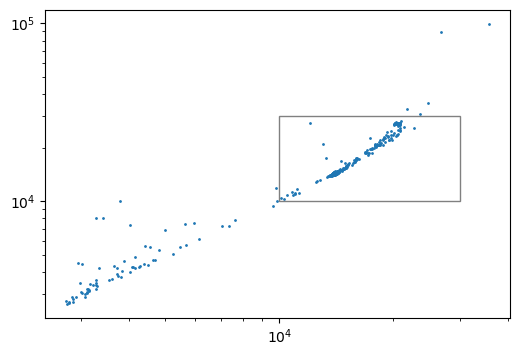

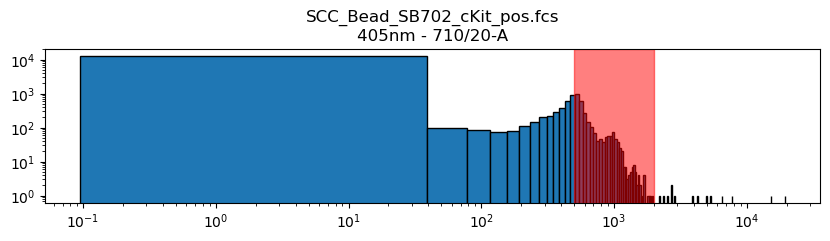

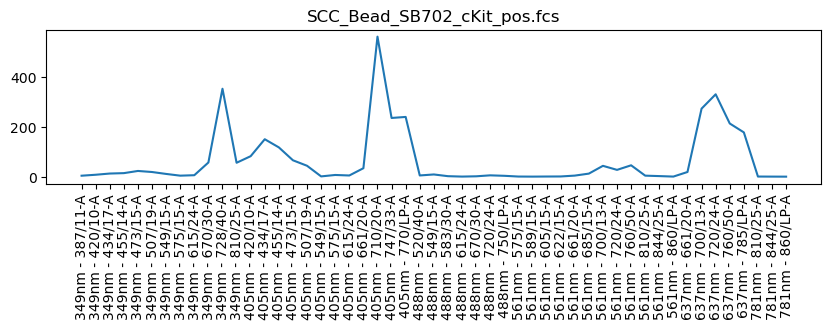

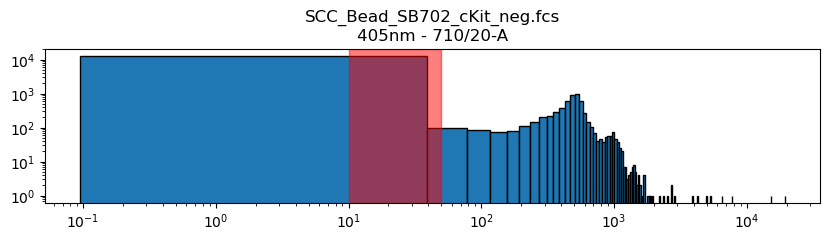

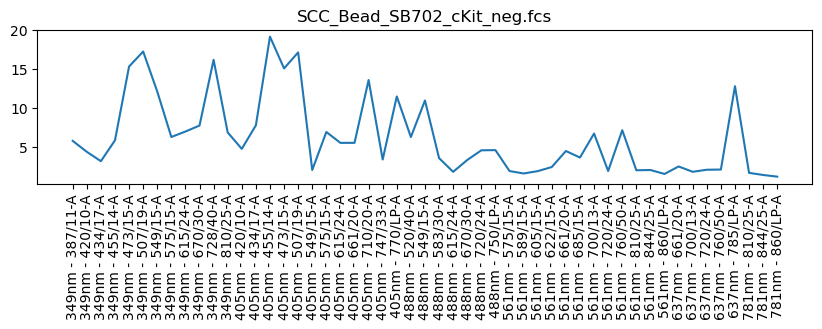

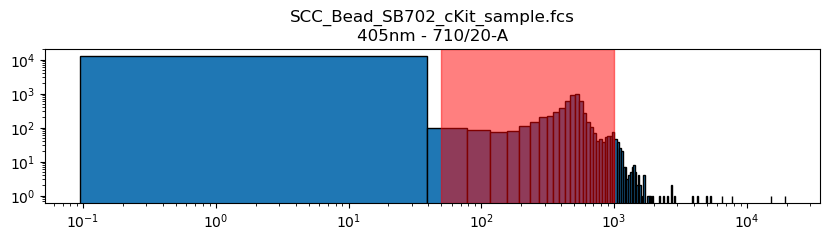

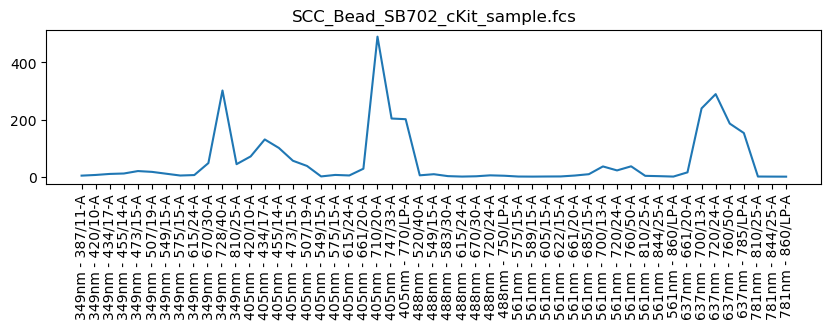

In [ ]:
path = Data_dir+"/scc_beads/SCC_Bead_cKit Run 1 20241112154542.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 710/20-A'

min = 500
max = 2000
filename = 'SCC_Bead_SB702_cKit_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_SB702_cKit_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 50
max = 1000
filename = 'SCC_Bead_SB702_cKit_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

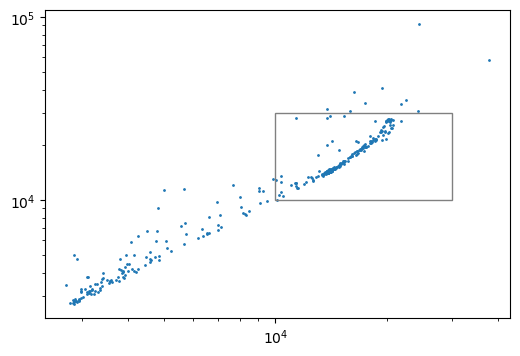

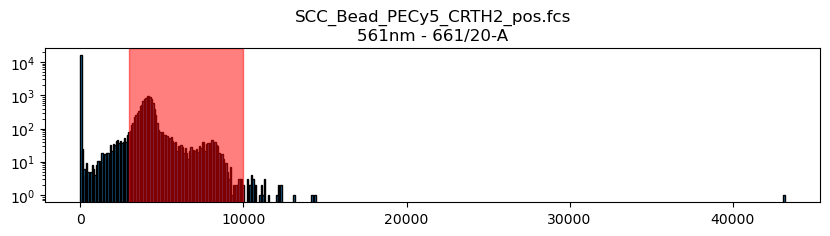

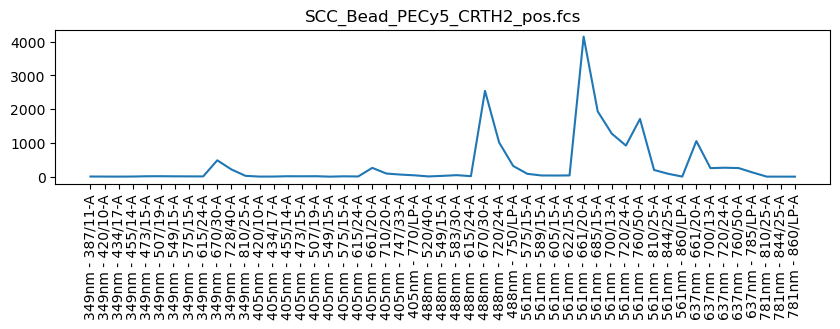

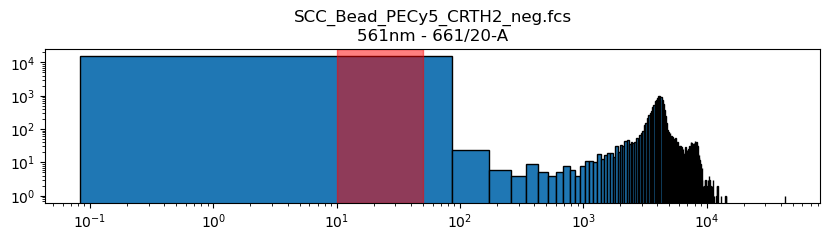

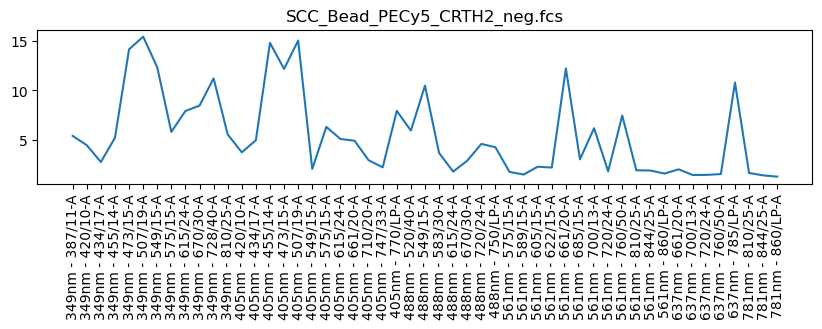

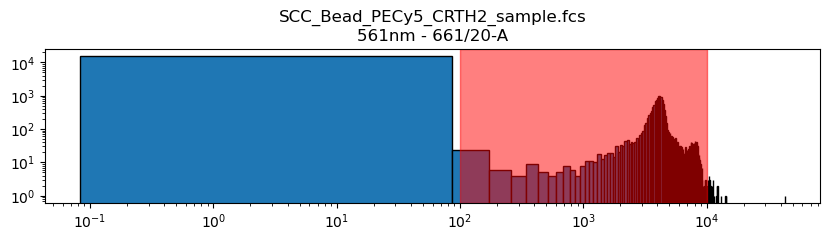

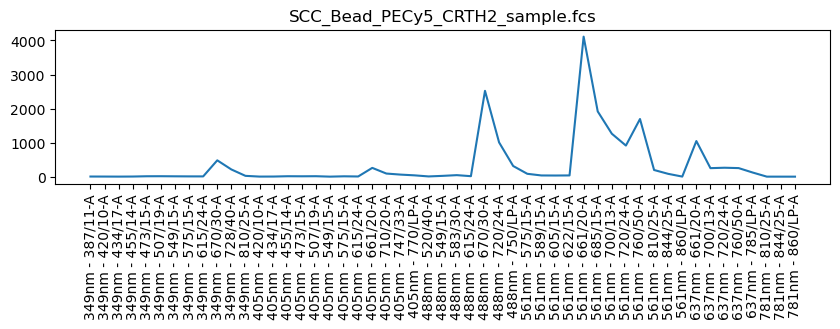

In [36]:
path = Data_dir+"/scc_beads/SCC_Bead_CRTH2 Run 1 20241112153408.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 661/20-A'

min = 3000
max = 10000
filename = 'SCC_Bead_PECy5_CRTH2_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_PECy5_CRTH2_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 10000
filename = 'SCC_Bead_PECy5_CRTH2_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

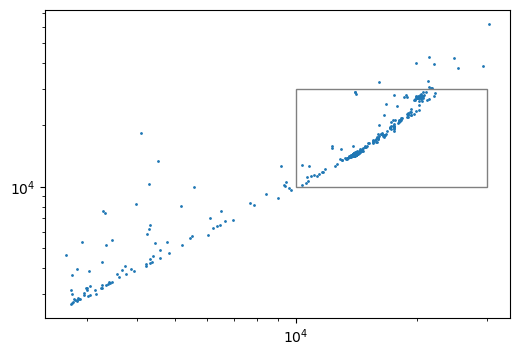

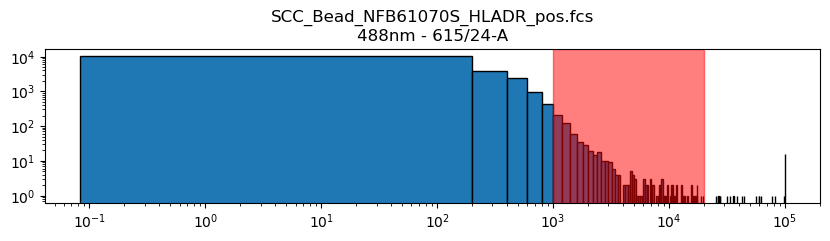

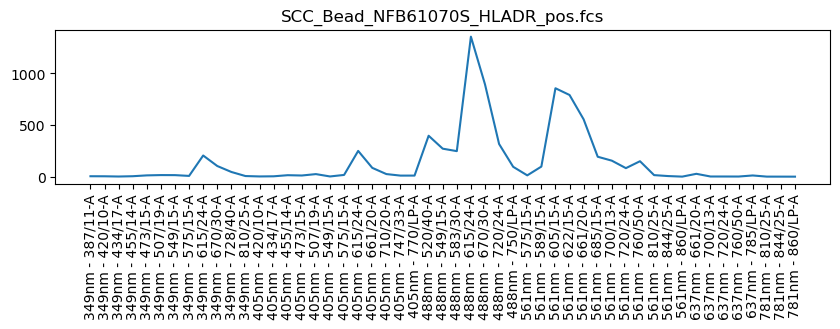

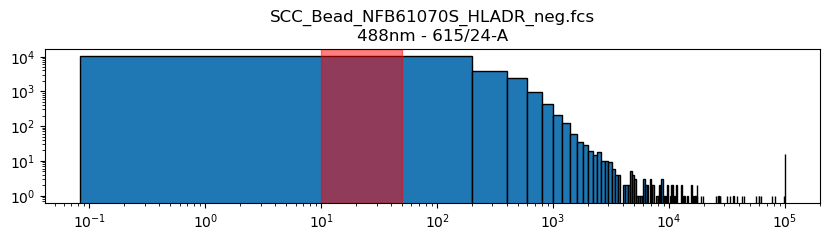

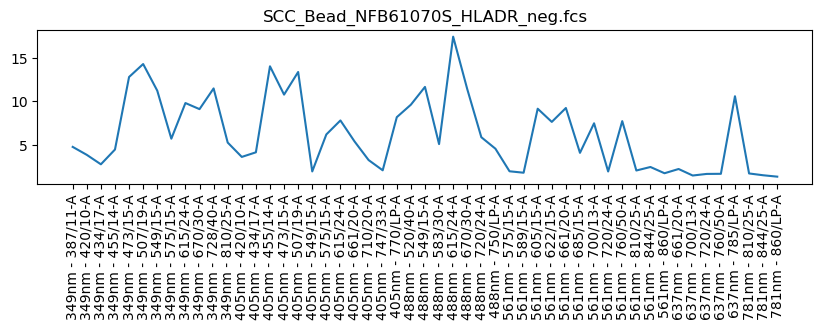

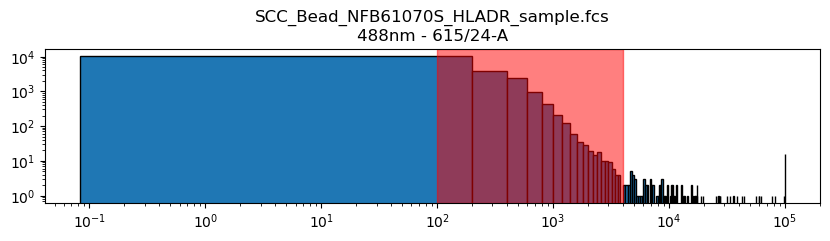

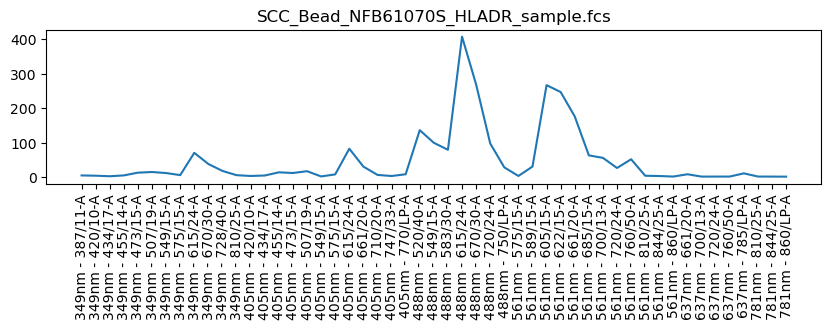

In [37]:
path = Data_dir+"/scc_beads/SCC_Bead_HLADR Run 1 20241112145606.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 615/24-A'

min = 1000
max = 20000
filename = 'SCC_Bead_NFB61070S_HLADR_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_NFB61070S_HLADR_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 4000
filename = 'SCC_Bead_NFB61070S_HLADR_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

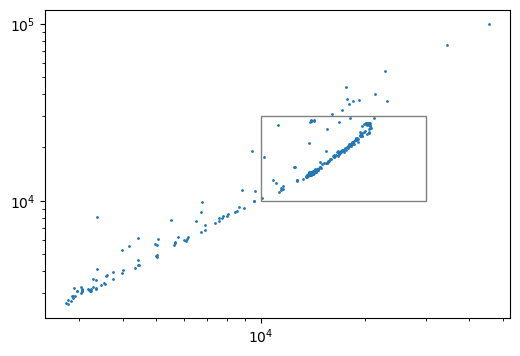

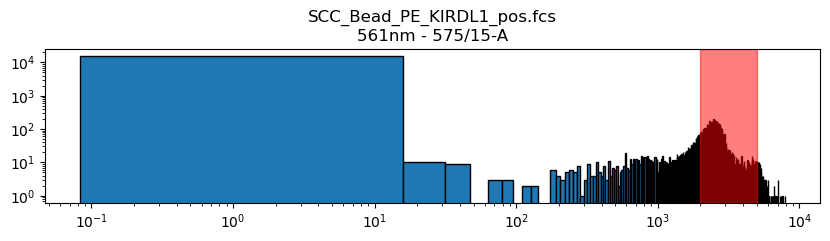

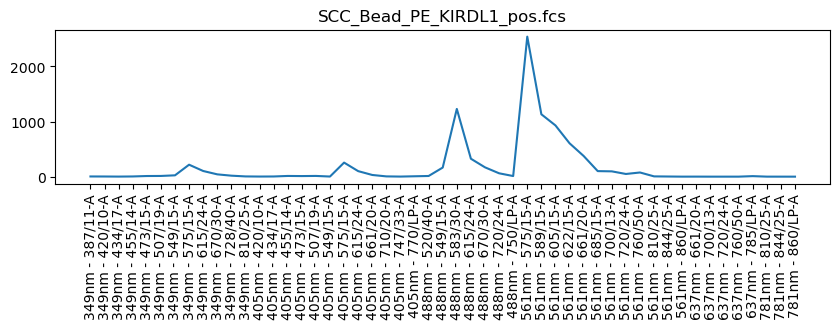

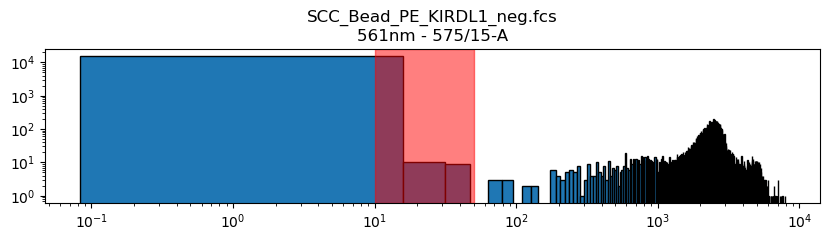

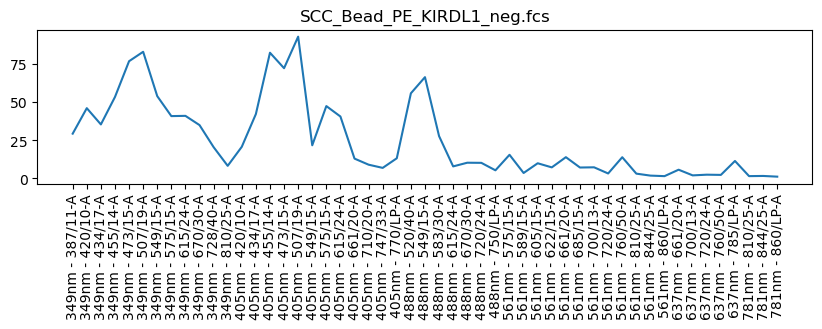

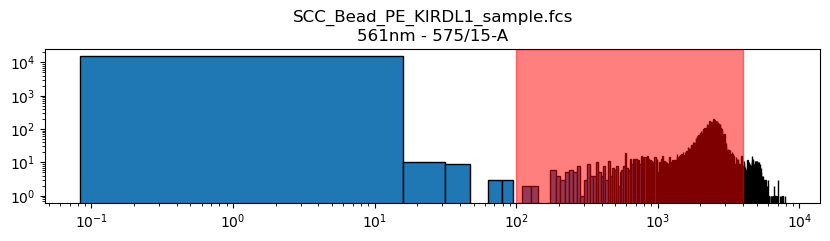

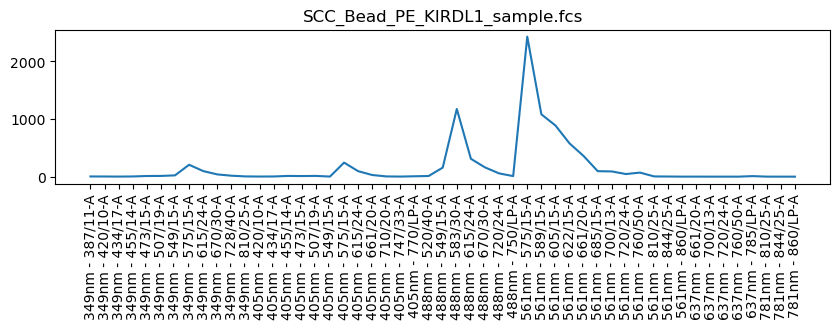

In [38]:
path = Data_dir+"/scc_beads/SCC_Bead_KIRDL1 Run 1 20241112151929.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 575/15-A'

min = 2000
max = 5000
filename = 'SCC_Bead_PE_KIRDL1_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_PE_KIRDL1_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 4000
filename = 'SCC_Bead_PE_KIRDL1_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

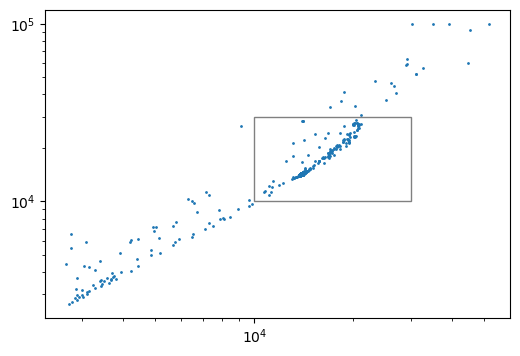

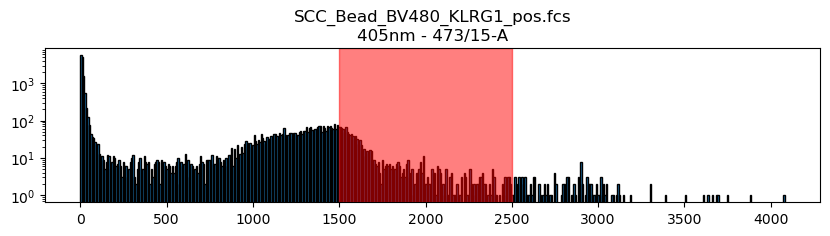

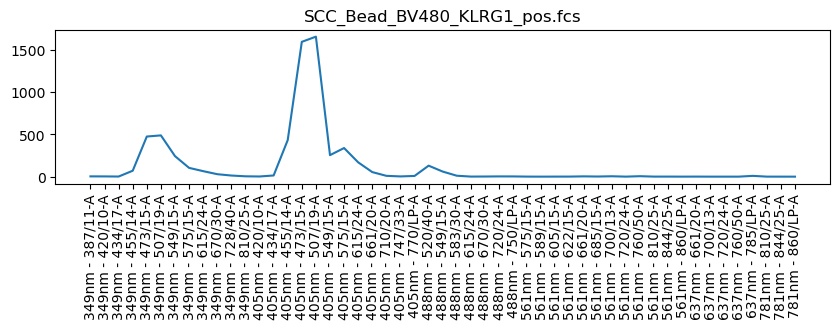

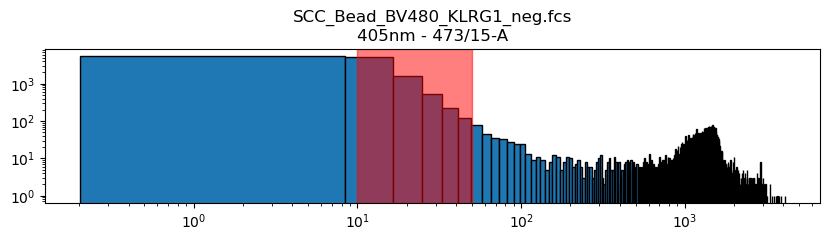

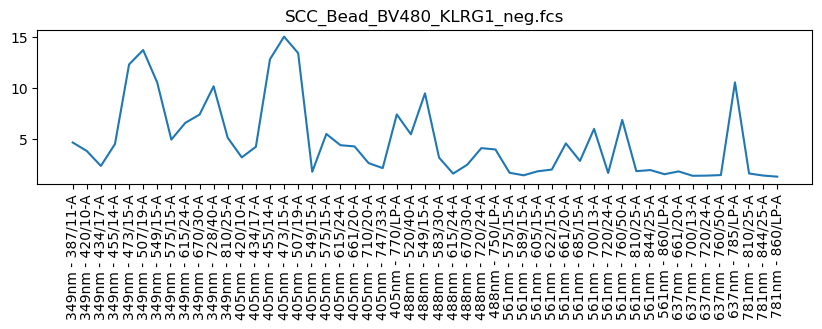

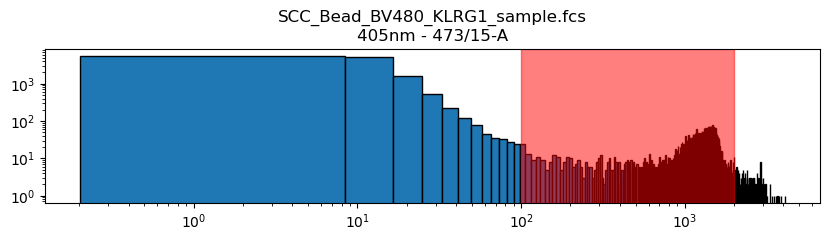

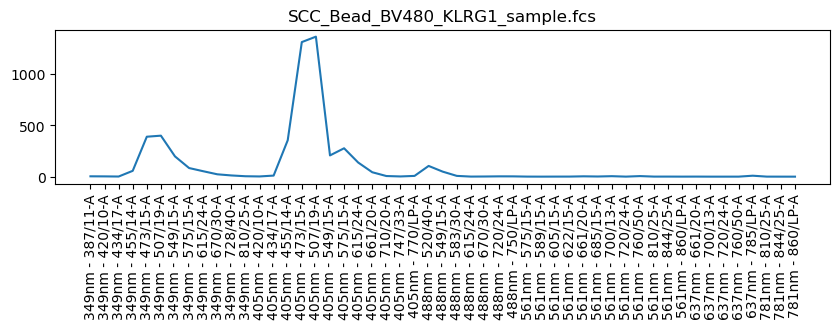

In [39]:
path = Data_dir+"/scc_beads/SCC_Bead_KLRG1 Run 1 20241112142923.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 473/15-A'

min = 1500
max = 2500
filename = 'SCC_Bead_BV480_KLRG1_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BV480_KLRG1_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 2000
filename = 'SCC_Bead_BV480_KLRG1_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

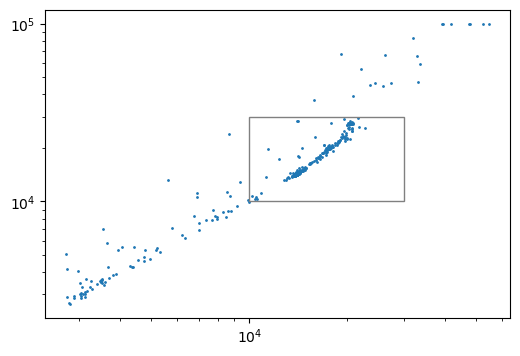

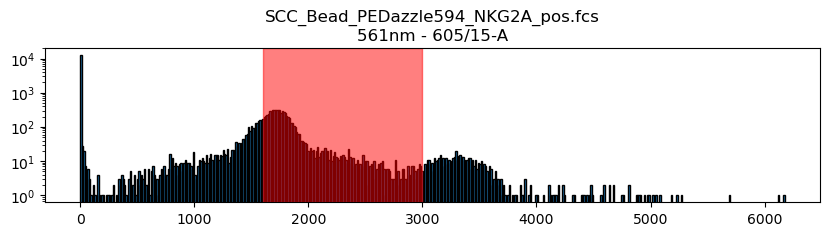

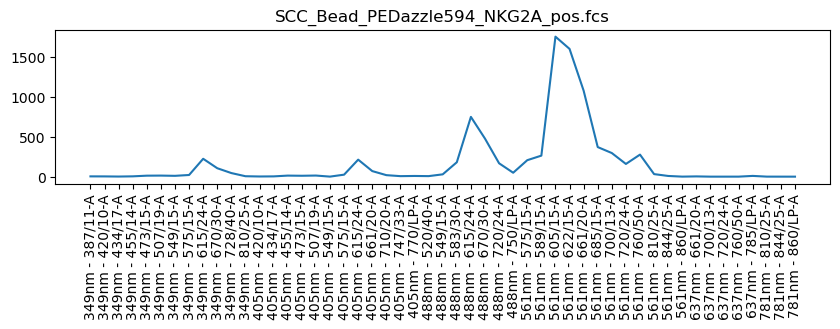

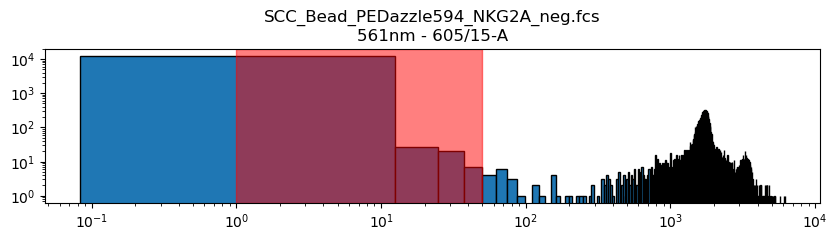

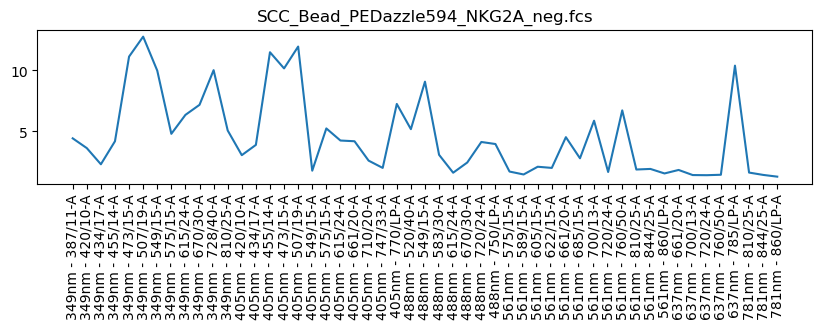

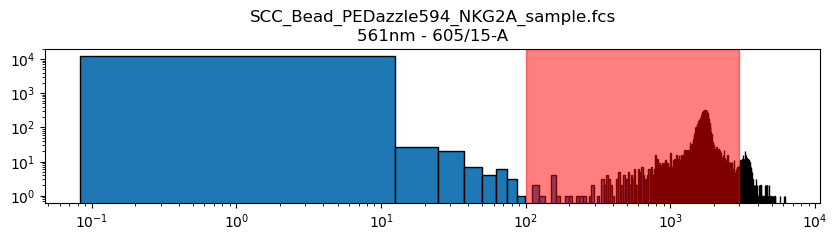

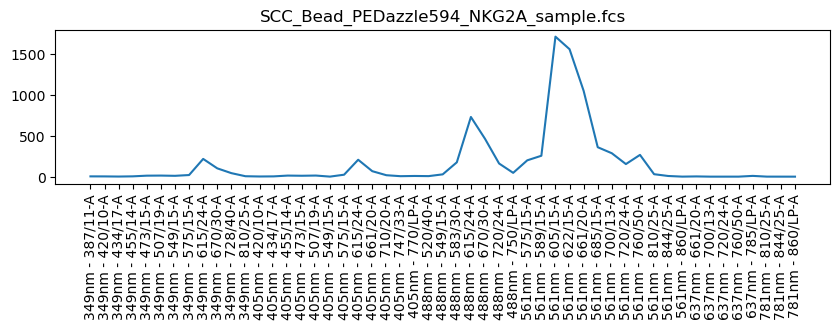

In [40]:
path = Data_dir+"/scc_beads/SCC_Bead_NKG2A Run 1 20241112152800.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 605/15-A'

min = 1600
max = 3000
filename = 'SCC_Bead_PEDazzle594_NKG2A_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 1
max = 50
filename = 'SCC_Bead_PEDazzle594_NKG2A_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 3000
filename = 'SCC_Bead_PEDazzle594_NKG2A_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

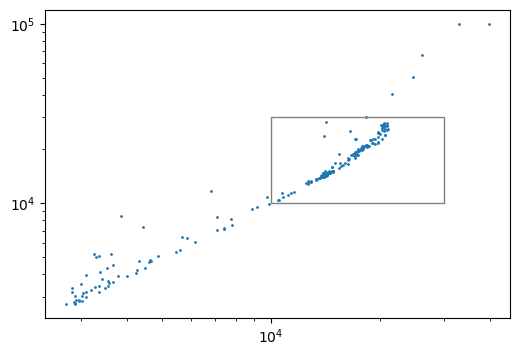

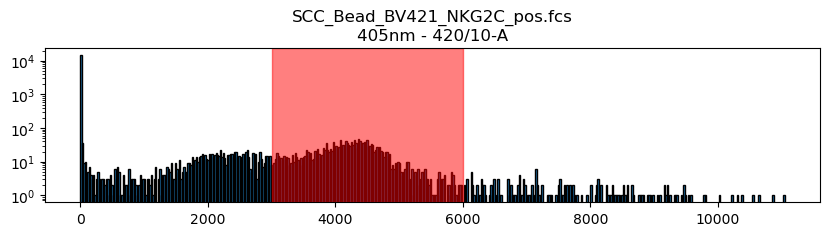

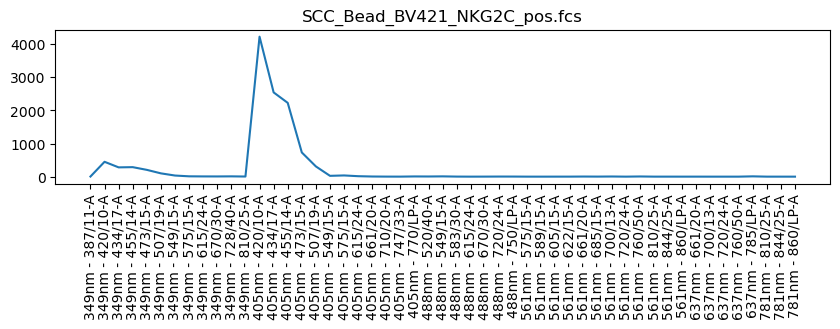

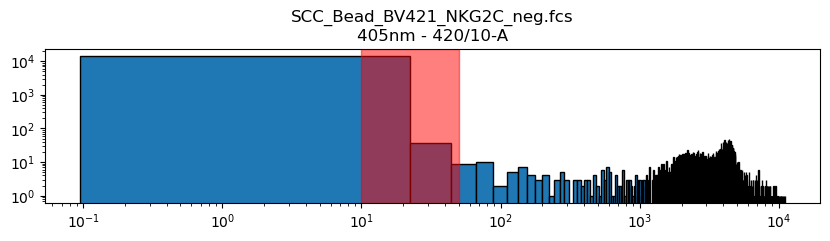

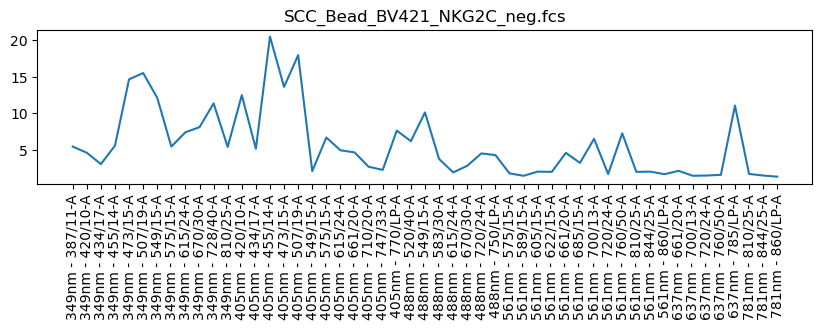

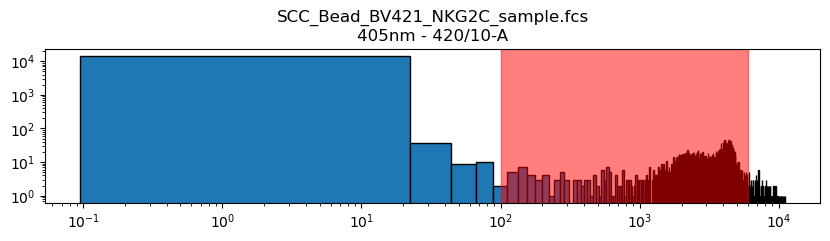

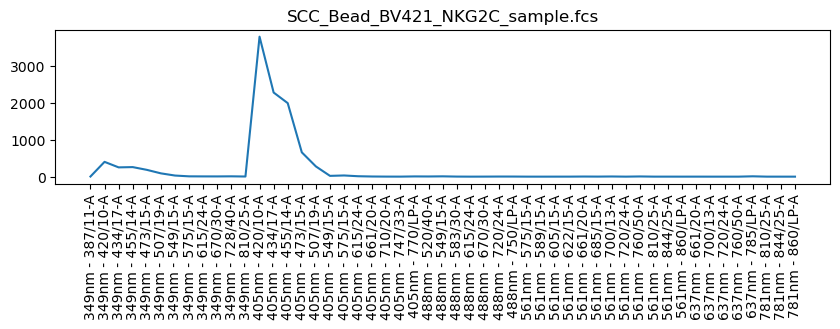

In [41]:
path = Data_dir+"/scc_beads/SCC_Bead_NKG2C Run 1 20241112152221.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 420/10-A'

min = 3000
max = 6000
filename = 'SCC_Bead_BV421_NKG2C_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BV421_NKG2C_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 6000
filename = 'SCC_Bead_BV421_NKG2C_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

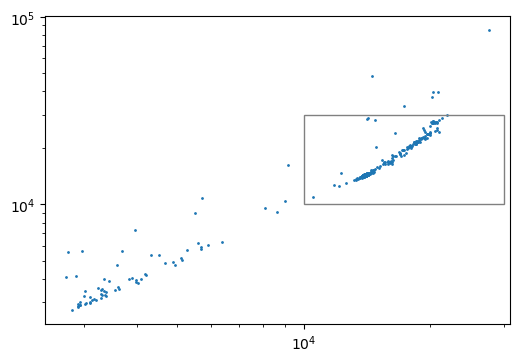

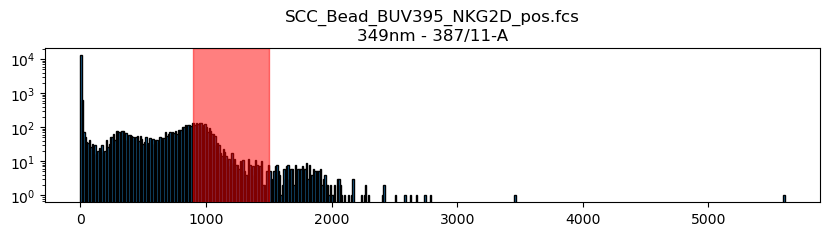

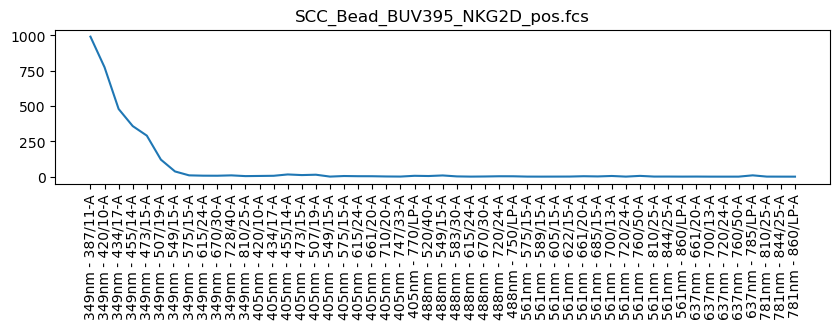

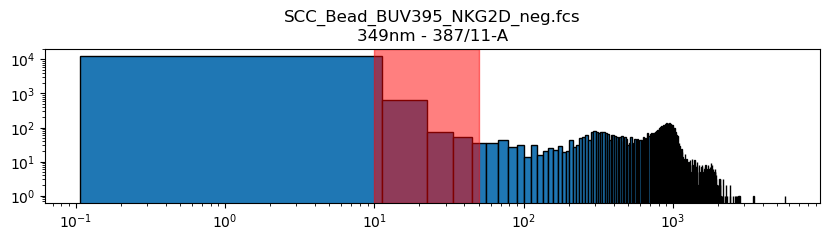

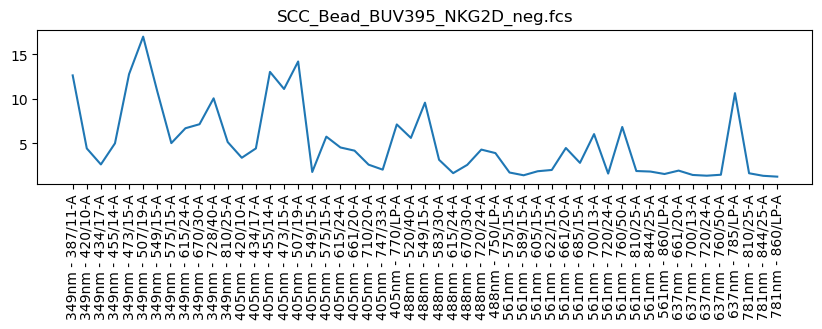

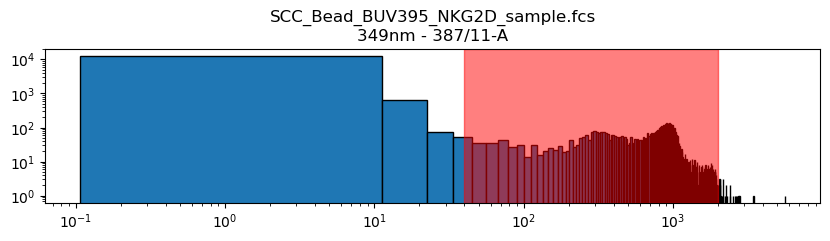

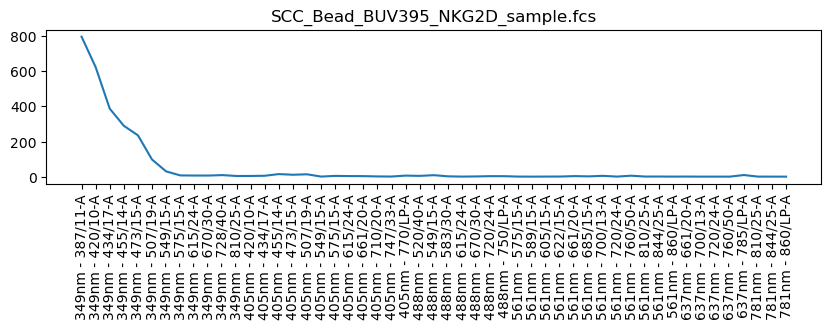

In [42]:
path = Data_dir+"/scc_beads/SCC_Bead_NKG2D Run 1 20241112141951.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 387/11-A'

min = 900
max = 1500
filename = 'SCC_Bead_BUV395_NKG2D_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV395_NKG2D_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 40
max = 2000
filename = 'SCC_Bead_BUV395_NKG2D_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

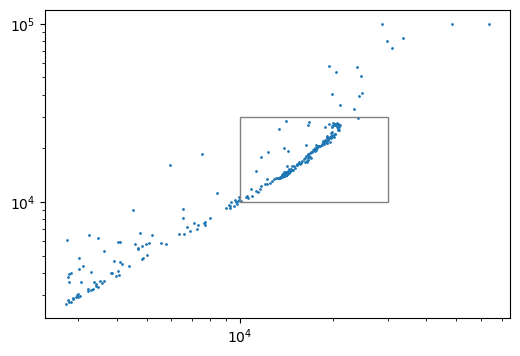

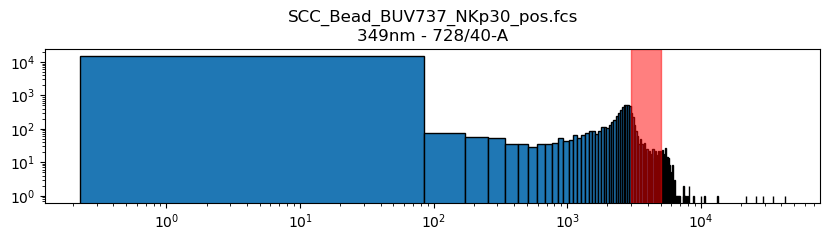

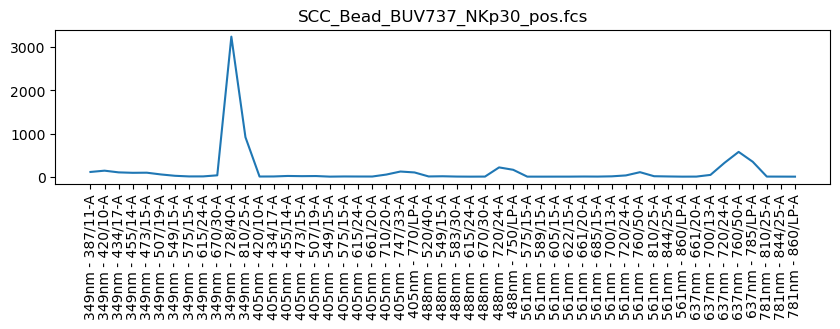

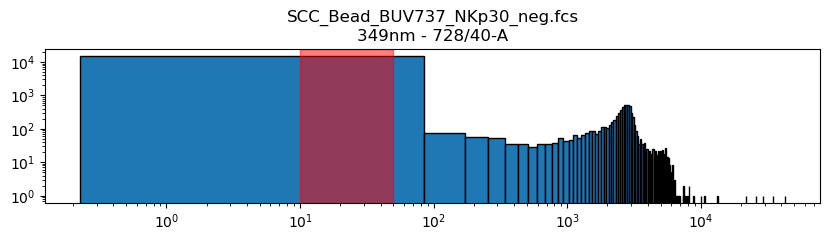

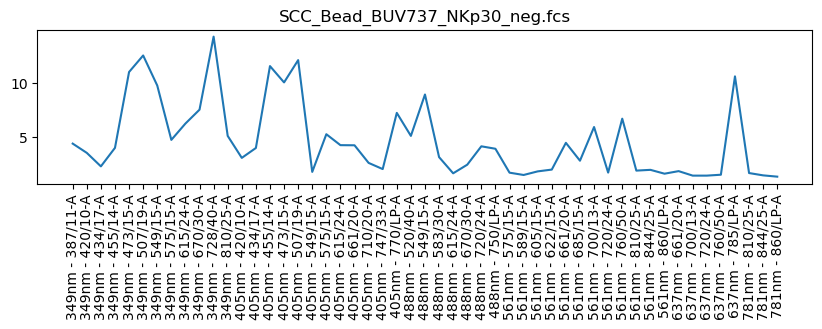

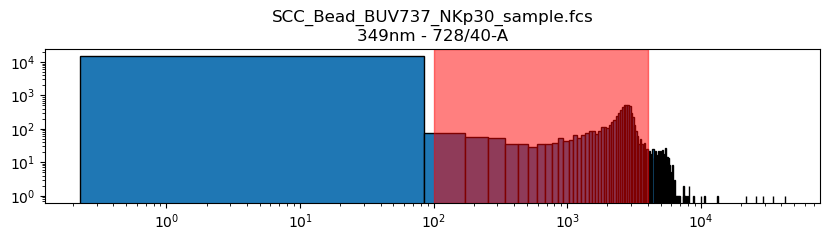

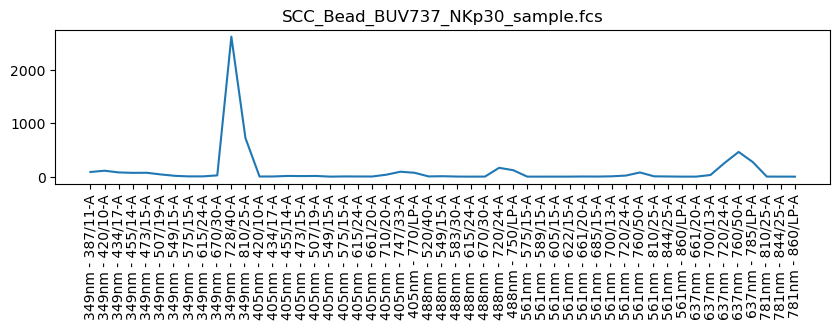

In [43]:
path = Data_dir+"/scc_beads/SCC_Bead_NKp30 Run 1 20241112150754.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 728/40-A'

min = 3000
max = 5000
filename = 'SCC_Bead_BUV737_NKp30_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BUV737_NKp30_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 4000
filename = 'SCC_Bead_BUV737_NKp30_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

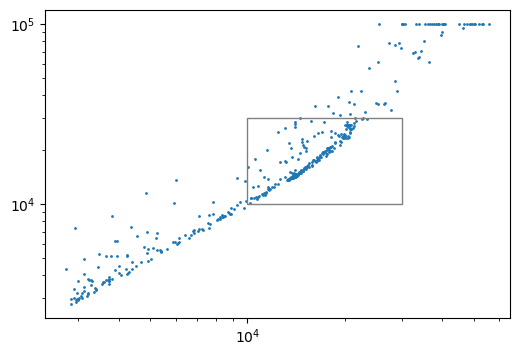

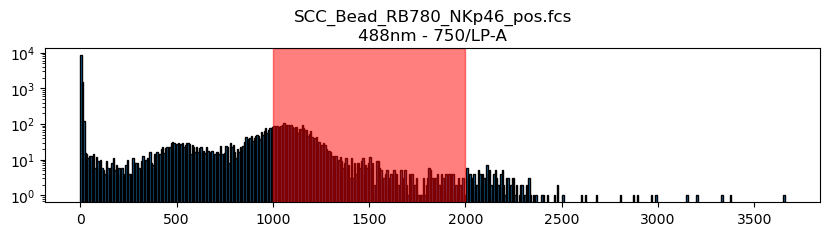

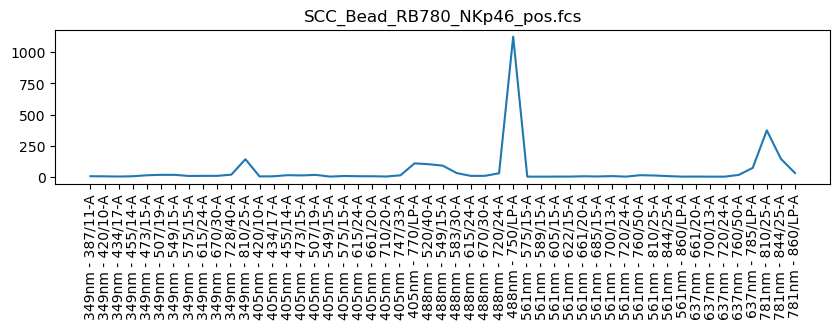

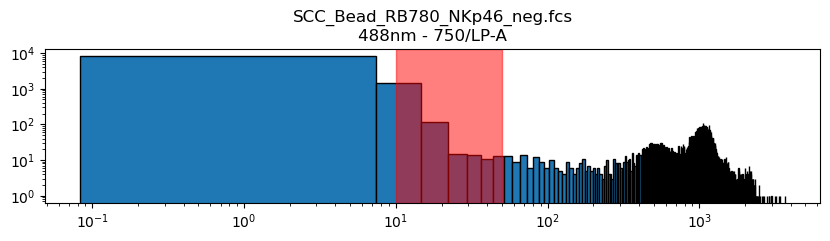

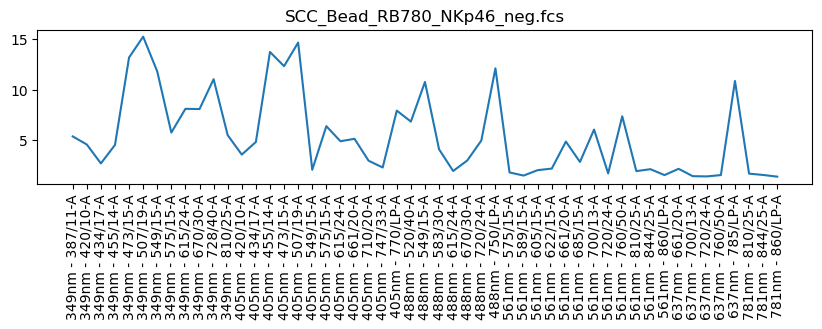

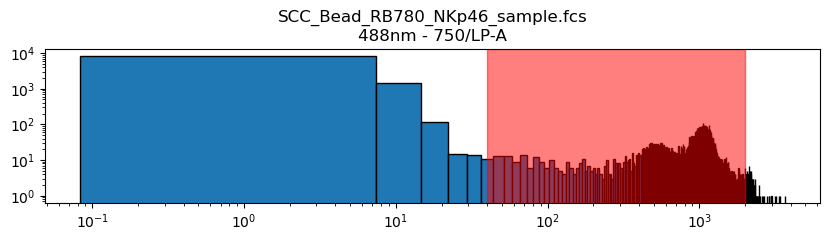

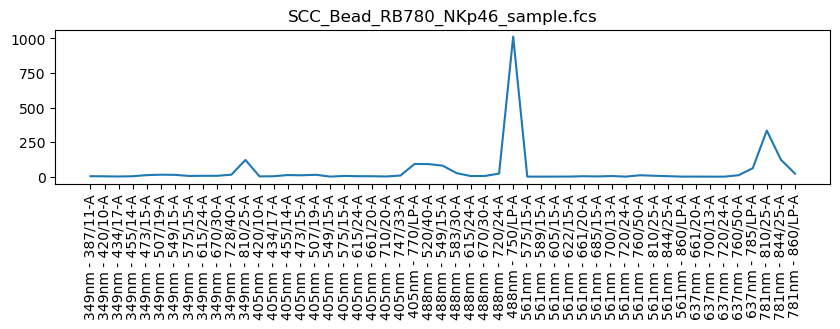

In [44]:
path = Data_dir+"/scc_beads/SCC_Bead_NKp46 Run 1 20241112151343.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 750/LP-A'

min = 1000
max = 2000
filename = 'SCC_Bead_RB780_NKp46_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_RB780_NKp46_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 40
max = 2000
filename = 'SCC_Bead_RB780_NKp46_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

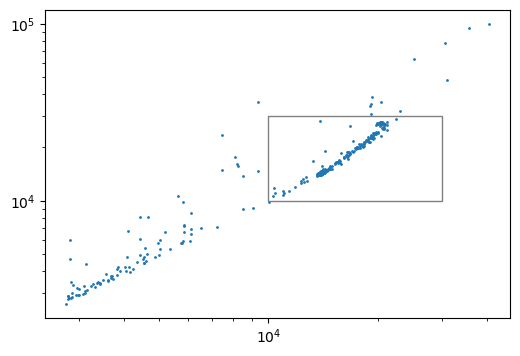

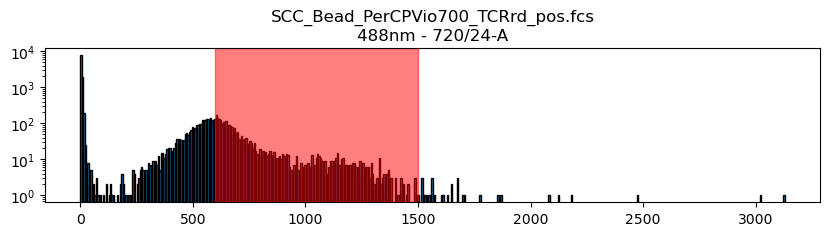

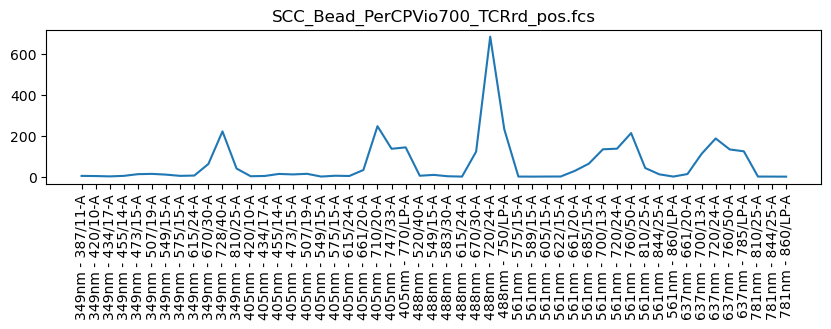

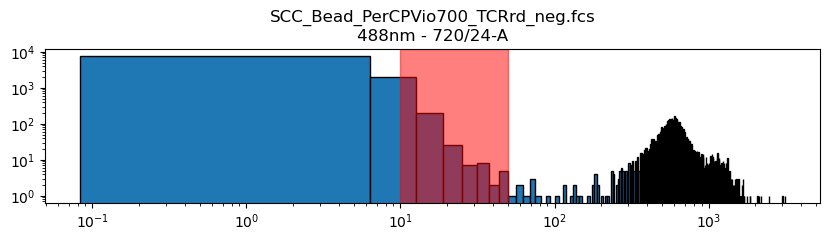

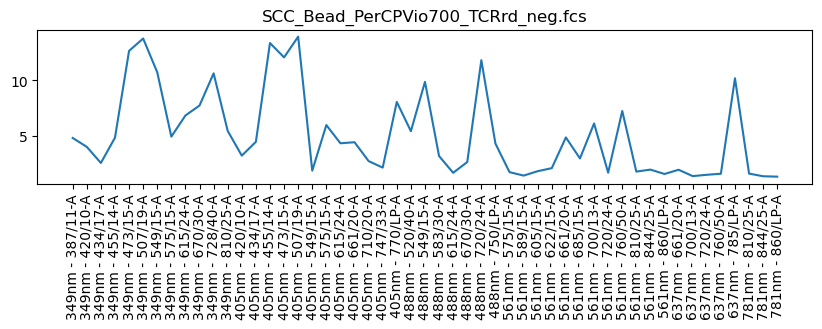

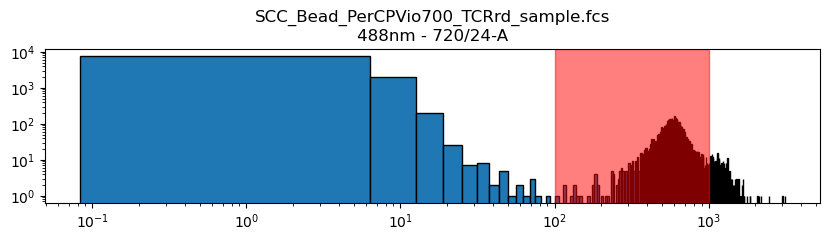

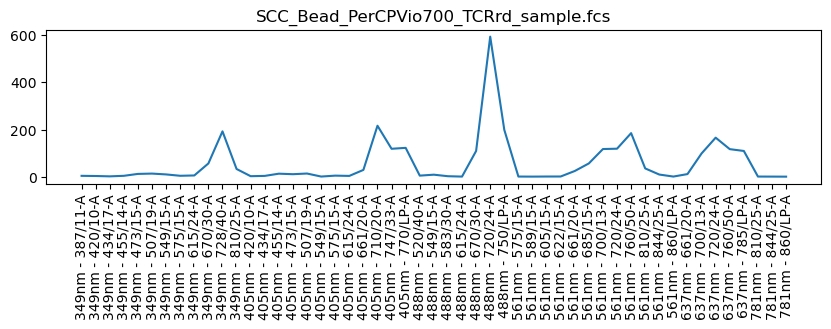

In [45]:
path = Data_dir+"/scc_beads/SCC_Bead_TCRrd Run 1 20241112154244.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 720/24-A'

min = 600
max = 1500
filename = 'SCC_Bead_PerCPVio700_TCRrd_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_PerCPVio700_TCRrd_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_Bead_PerCPVio700_TCRrd_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

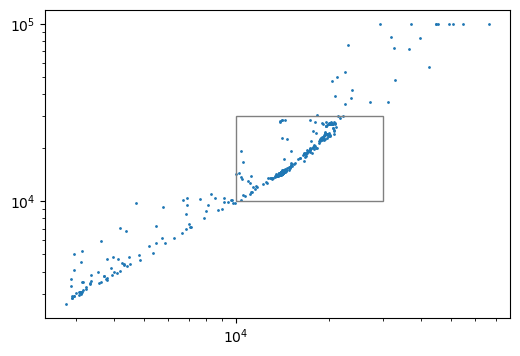

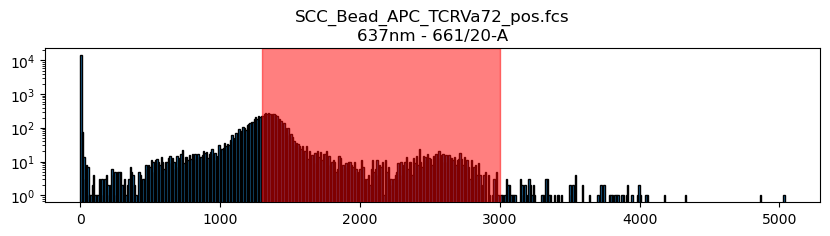

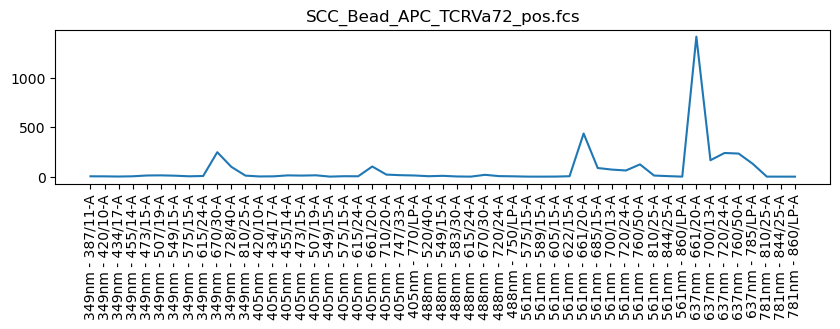

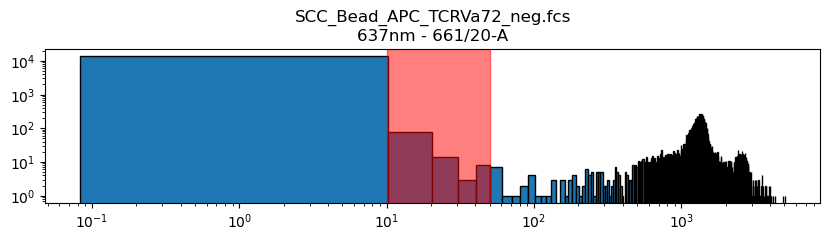

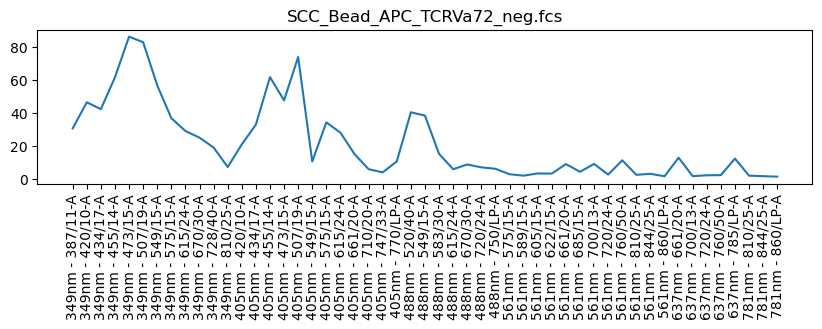

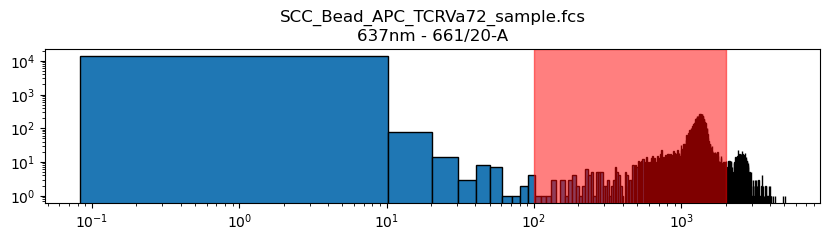

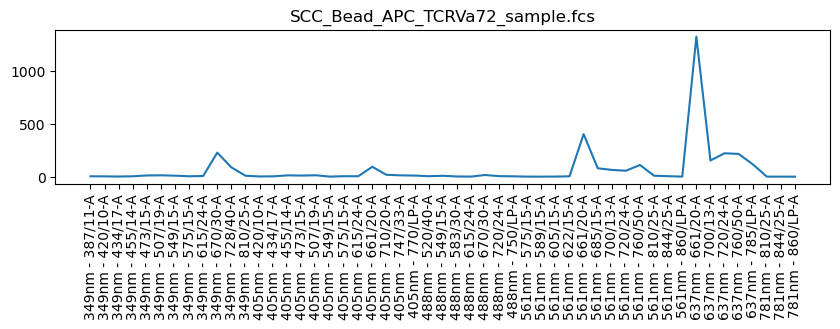

In [46]:
path = Data_dir+"/scc_beads/SCC_Bead_TCRVa7.2 Run 1 20241112153952.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 661/20-A'

min = 1300
max = 3000
filename = 'SCC_Bead_APC_TCRVa72_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_APC_TCRVa72_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 2000
filename = 'SCC_Bead_APC_TCRVa72_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

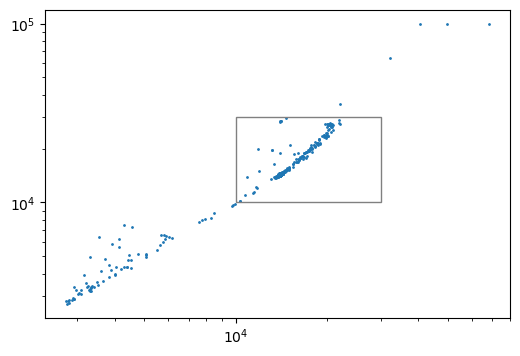

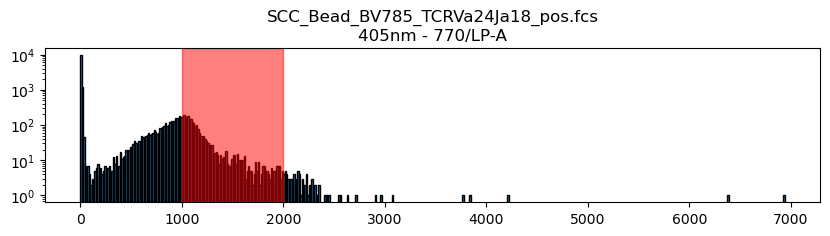

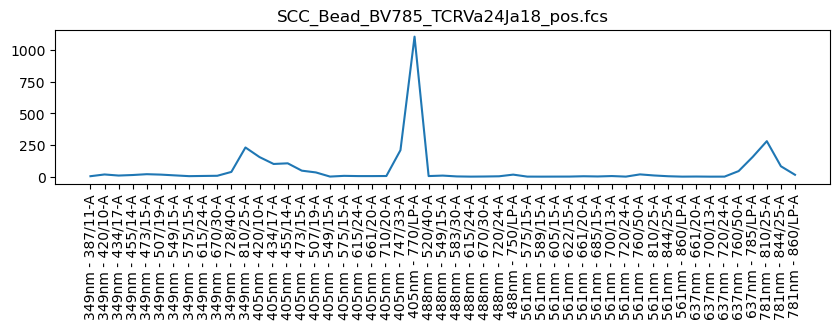

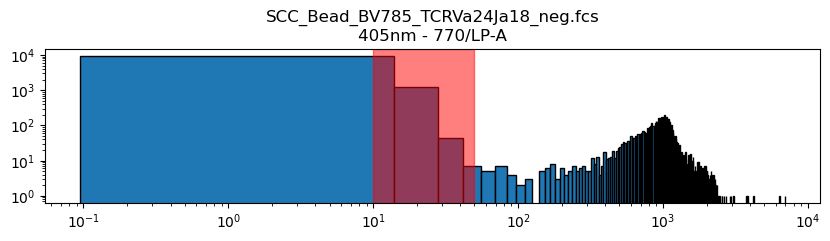

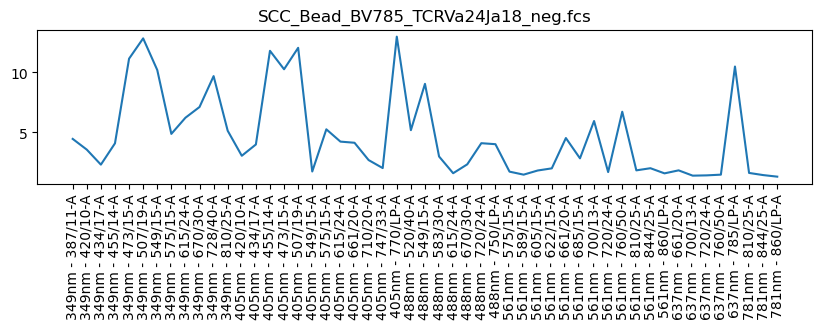

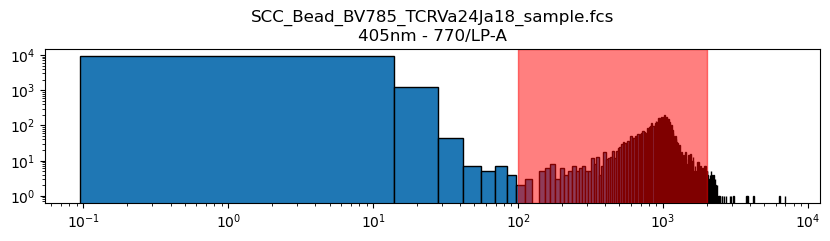

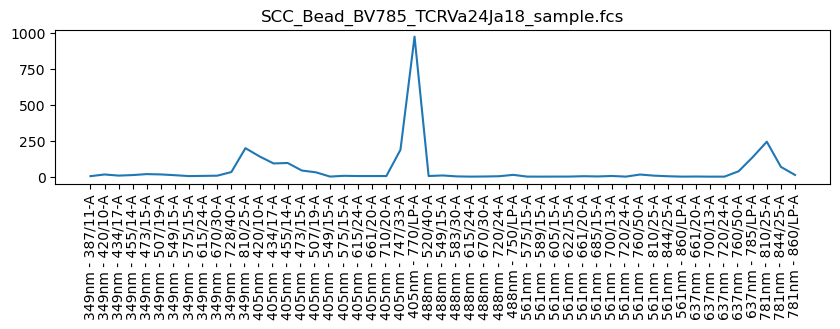

In [47]:
path = Data_dir+"/scc_beads/SCC_Bead_TCRVa24Ja18 Run 1 20241112153115.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 770/LP-A'

min = 1000
max = 2000
filename = 'SCC_Bead_BV785_TCRVa24Ja18_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_BV785_TCRVa24Ja18_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 100
max = 2000
filename = 'SCC_Bead_BV785_TCRVa24Ja18_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

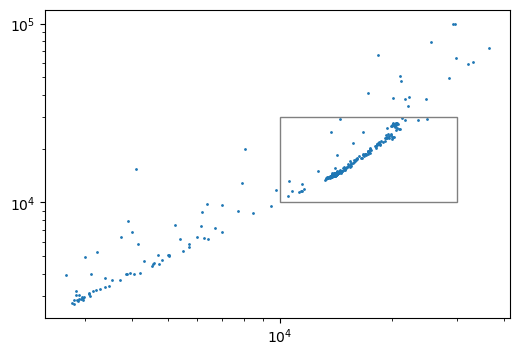

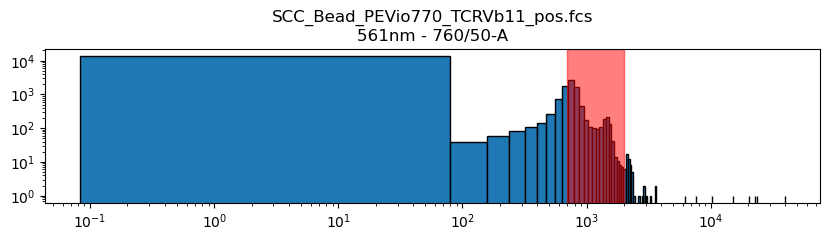

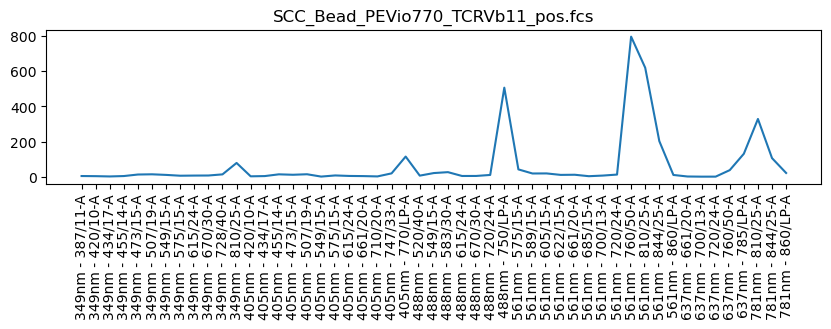

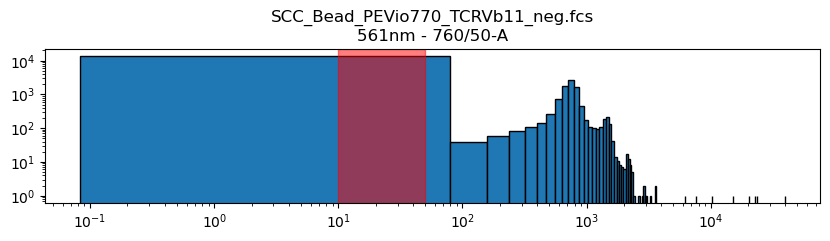

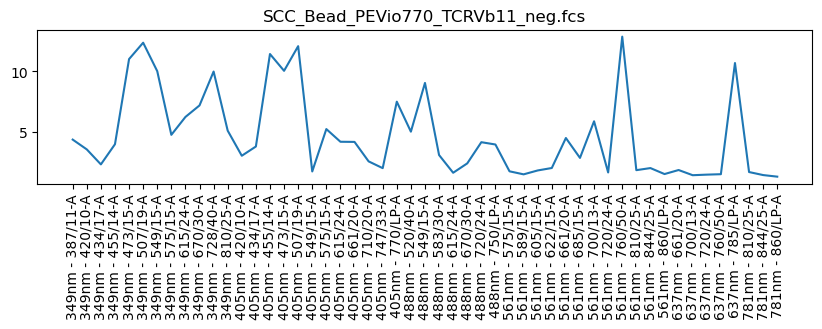

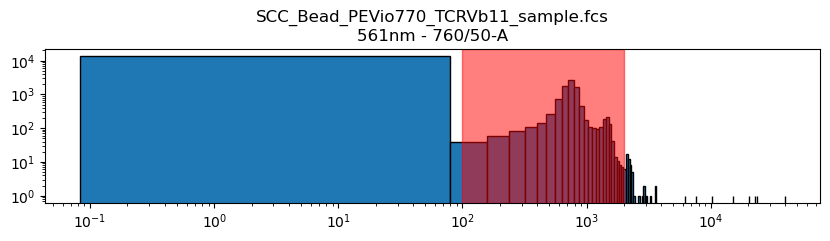

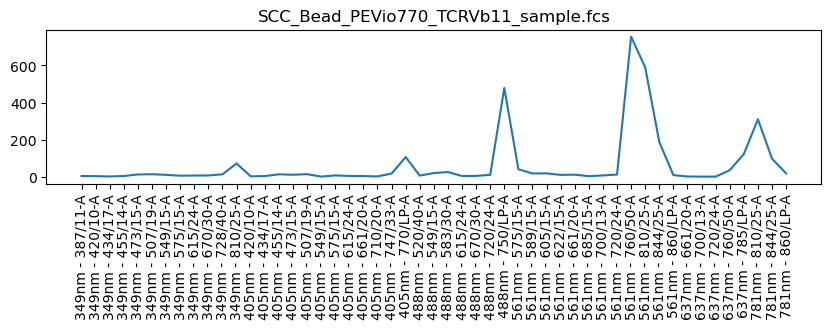

In [48]:
path = Data_dir+"/scc_beads/SCC_Bead_TCRVb11 Run 1 20241112153700.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-H",y_chan="488 FSC-A",
              x_min=10000,x_max=30000,
              y_min=10000,y_max=30000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 760/50-A'

min = 700
max = 2000
filename = 'SCC_Bead_PEVio770_TCRVb11_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Bead_PEVio770_TCRVb11_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_Bead_PEVio770_TCRVb11_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

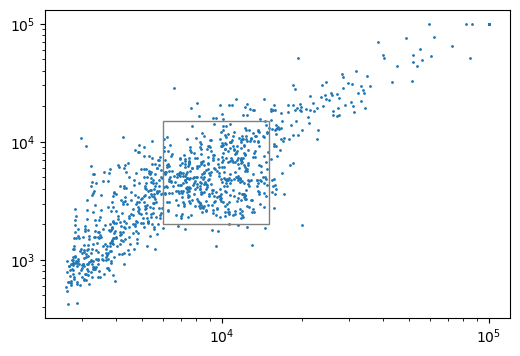

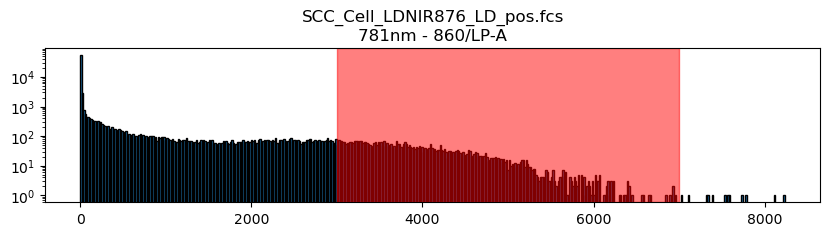

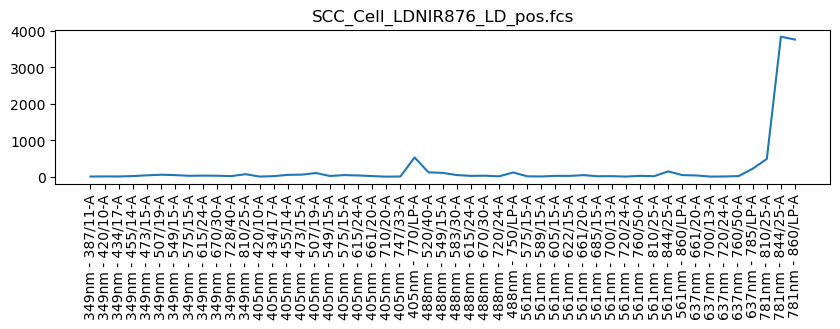

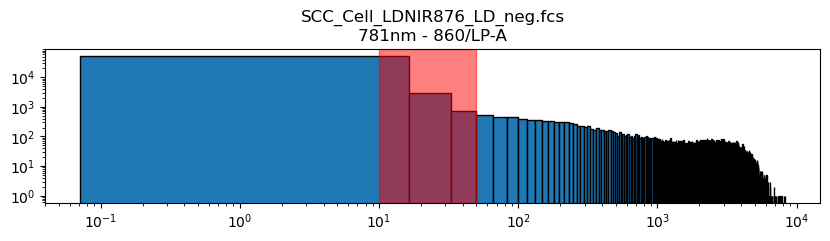

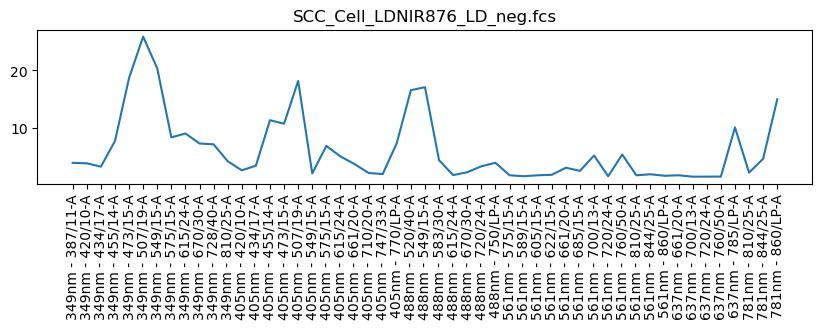

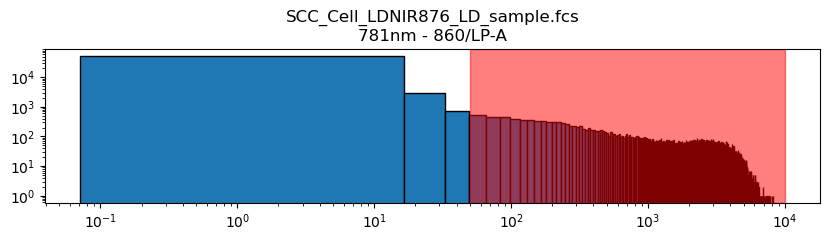

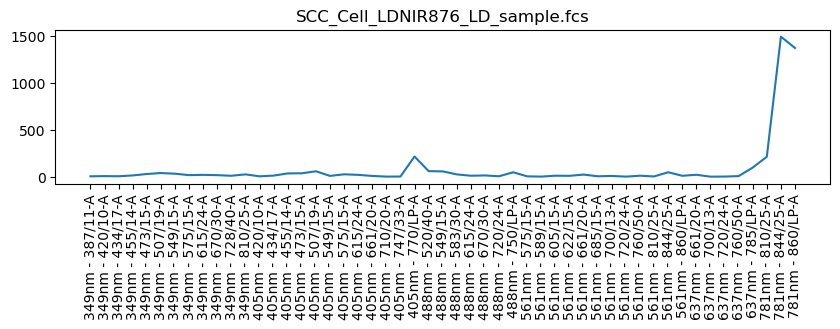

In [50]:
path = Data_dir+"/scc_cells/SCC_Cell_LD Run 1 20241112122139.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '781nm - 860/LP-A'

min = 3000
max = 7000
filename = 'SCC_Cell_LDNIR876_LD_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Cell_LDNIR876_LD_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")



min = 50
max = 10000
filename = 'SCC_Cell_LDNIR876_LD_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

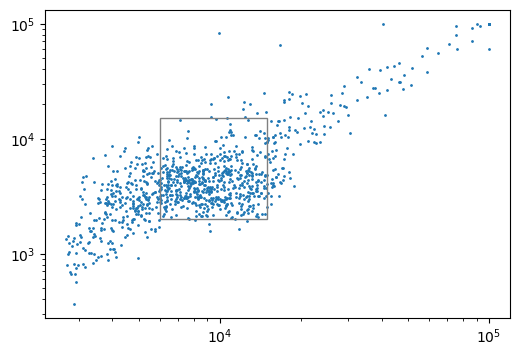

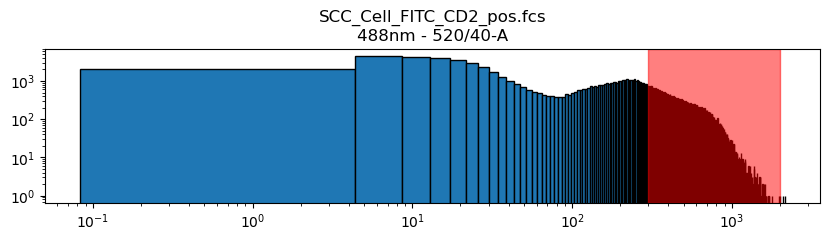

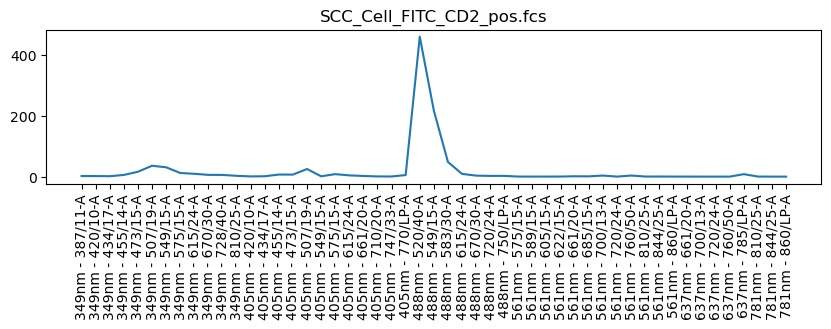

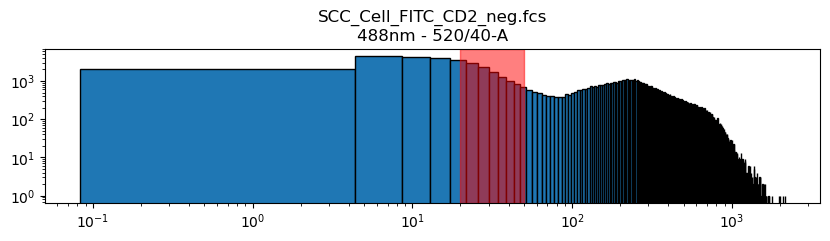

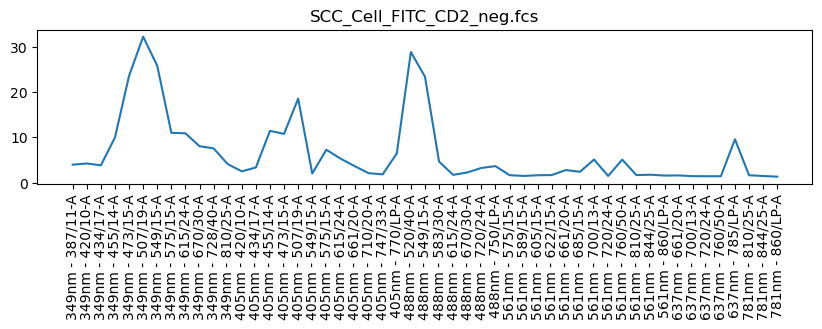

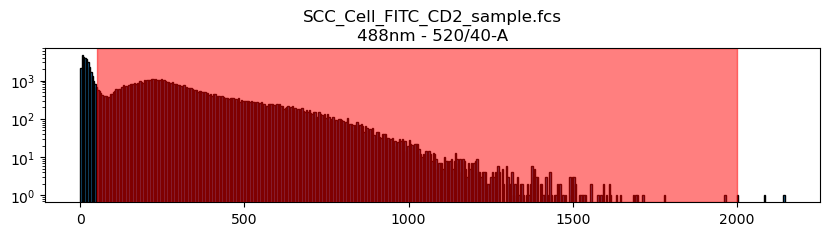

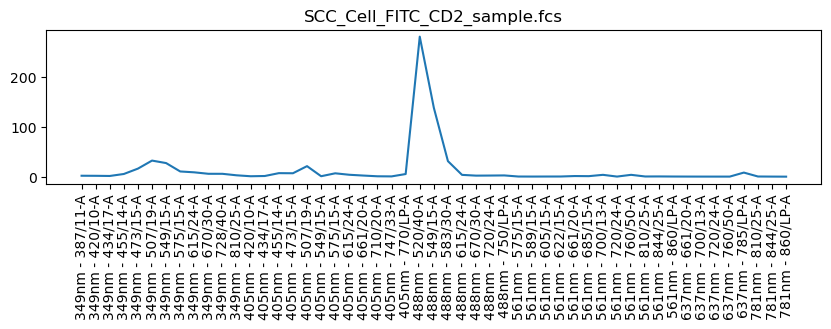

In [51]:
path = Data_dir+"/scc_cells/SCC_Cell_CD2 Run 1 20241112111908.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 520/40-A'

min = 300
max = 2000
filename = 'SCC_Cell_FITC_CD2_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 20
max = 50
filename = 'SCC_Cell_FITC_CD2_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 50
max = 2000
filename = 'SCC_Cell_FITC_CD2_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




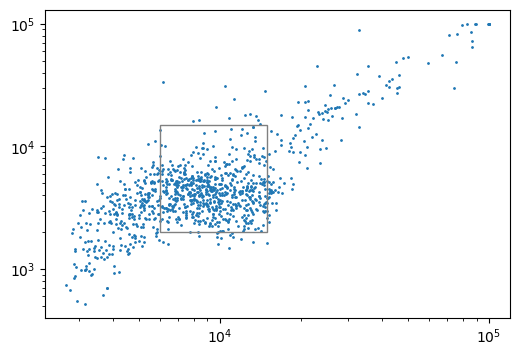

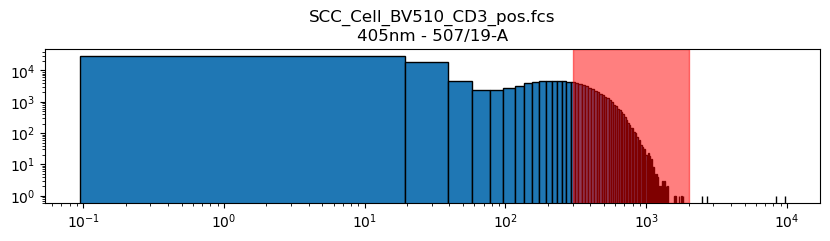

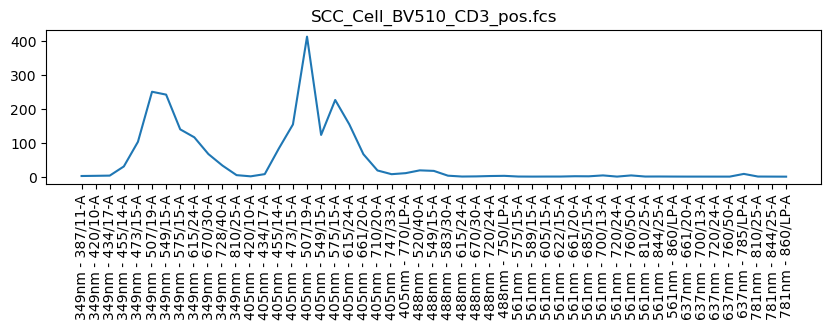

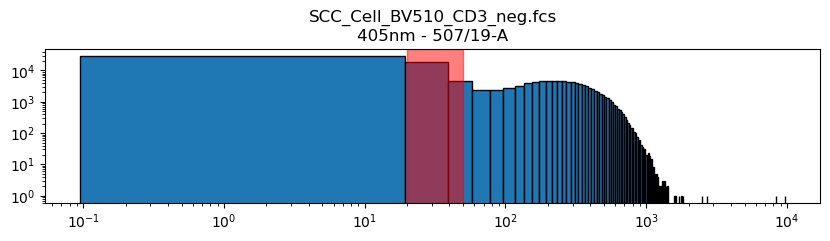

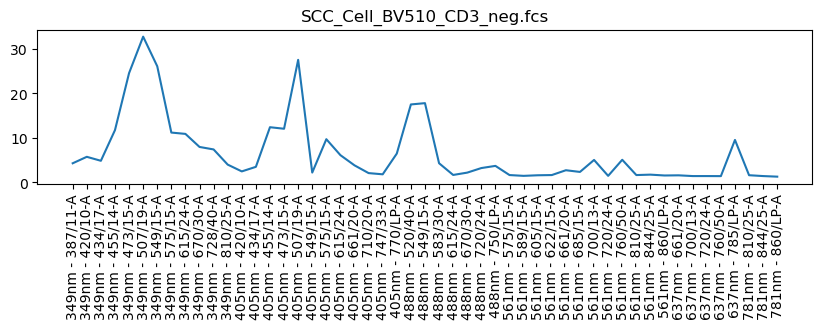

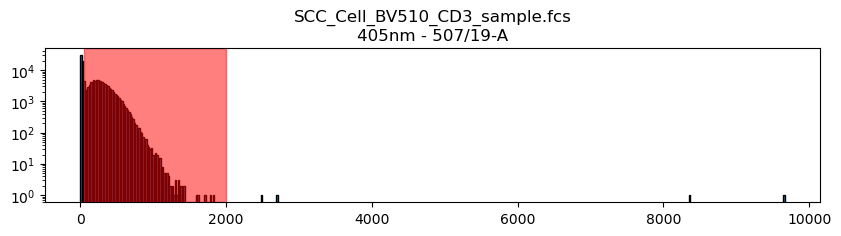

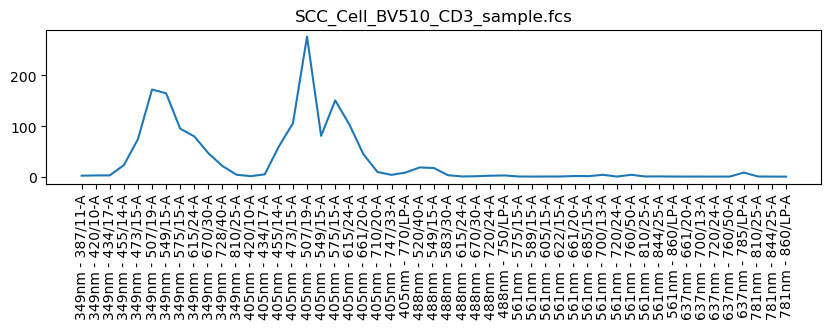

In [52]:
path = Data_dir+"/scc_cells/SCC_Cell_CD3 Run 1 20241112112836.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 507/19-A'

min = 300
max = 2000
filename = 'SCC_Cell_BV510_CD3_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 20
max = 50
filename = 'SCC_Cell_BV510_CD3_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 2000
filename = 'SCC_Cell_BV510_CD3_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

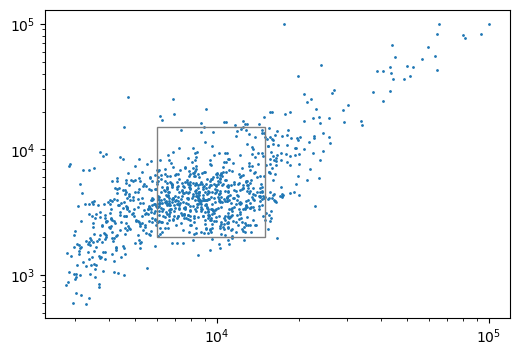

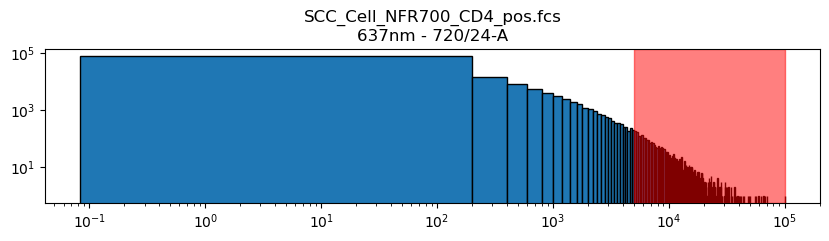

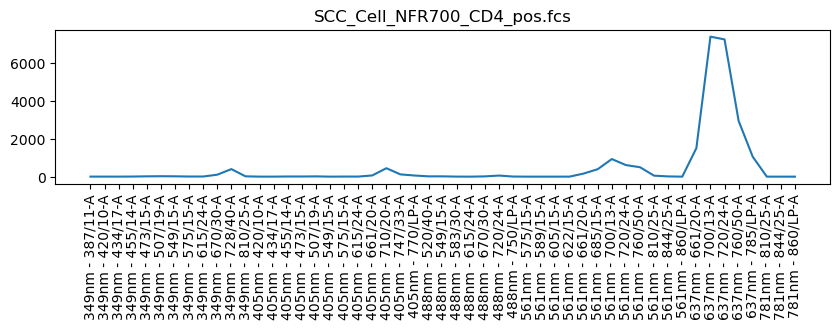

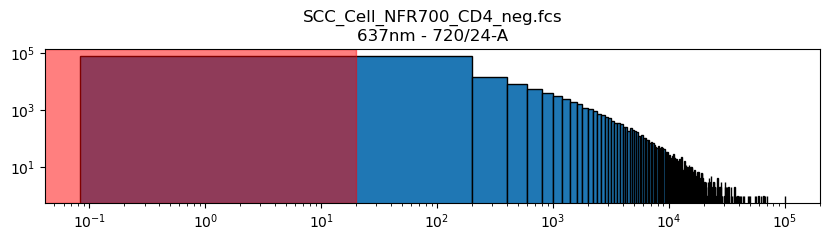

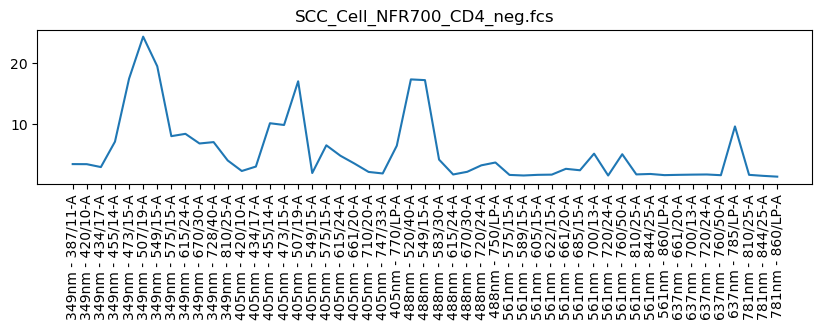

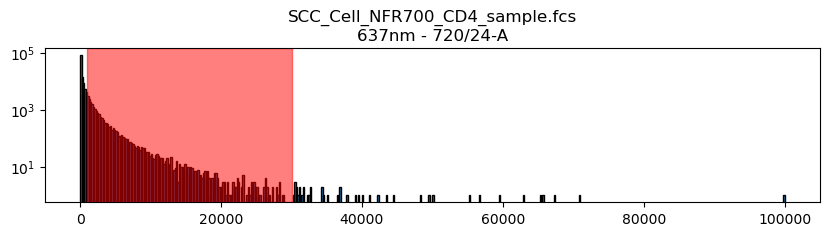

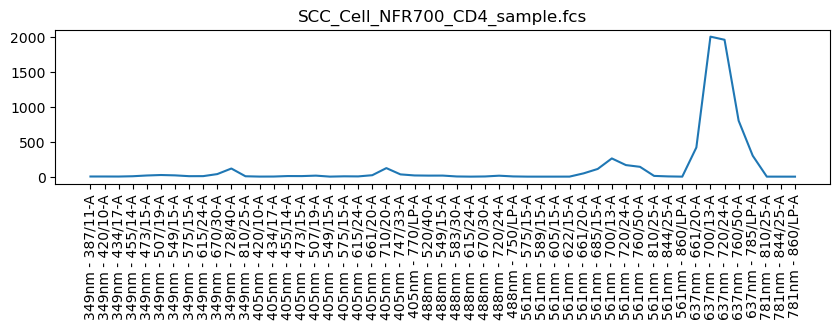

In [53]:
path = Data_dir+"/scc_cells/SCC_Cell_CD4 Run 1 20241112115150.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 720/24-A'

min = 5000
max = 100000
filename = 'SCC_Cell_NFR700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 0
max = 20
filename = 'SCC_Cell_NFR700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 1000
max = 30000
filename = 'SCC_Cell_NFR700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

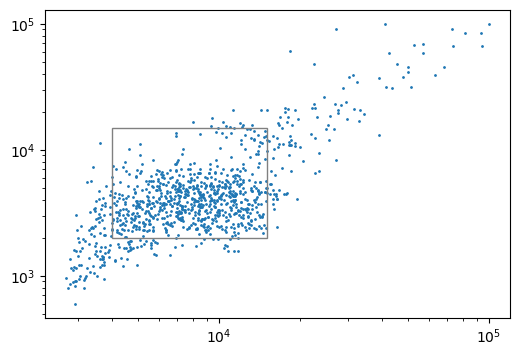

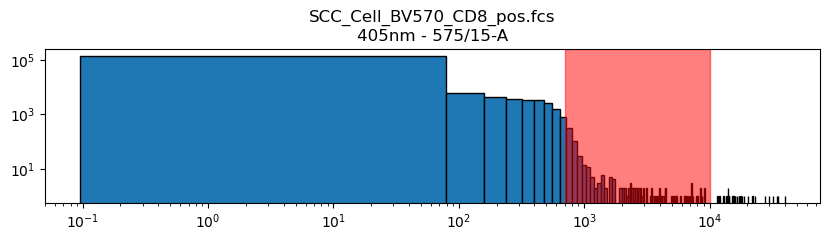

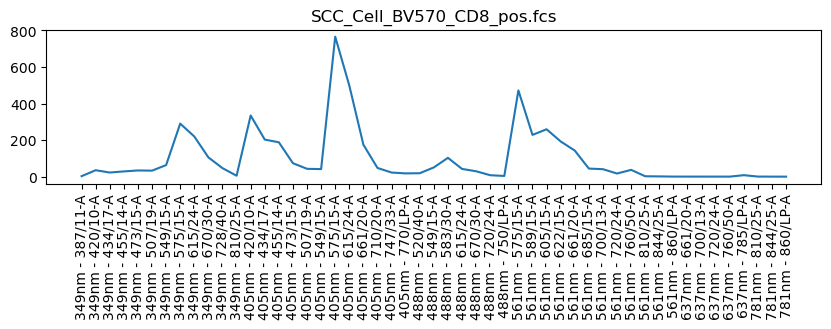

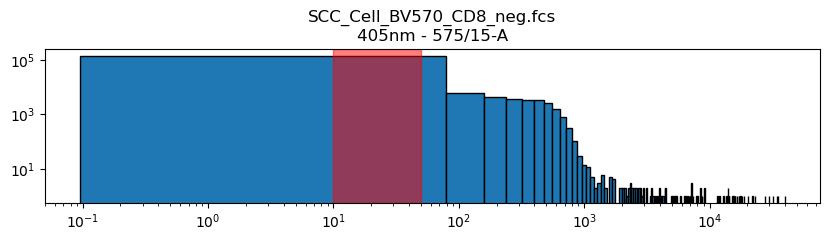

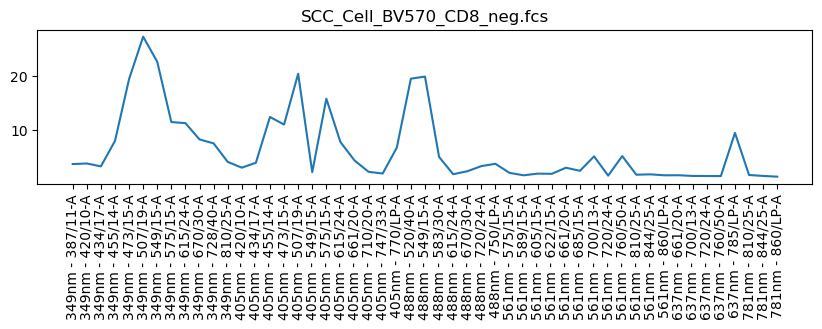

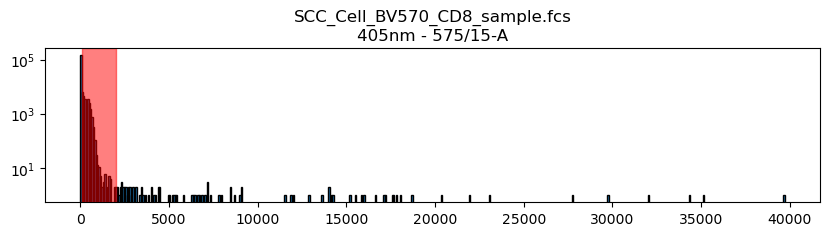

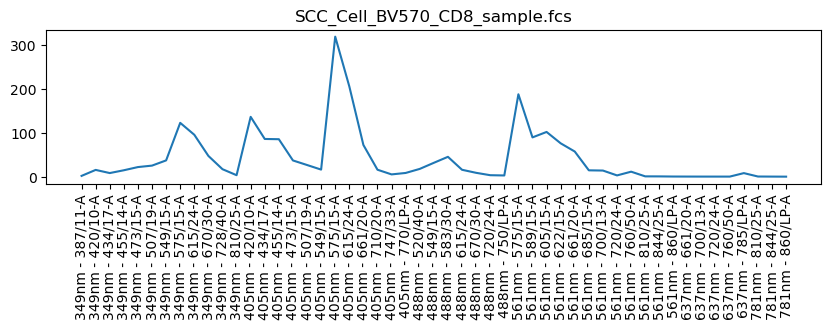

In [54]:
path = Data_dir+"/scc_cells/SCC_Cell_CD8 Run 1 20241112113855.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 575/15-A'

min = 700
max = 10000
filename = 'SCC_Cell_BV570_CD8_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Cell_BV570_CD8_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_BV570_CD8_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

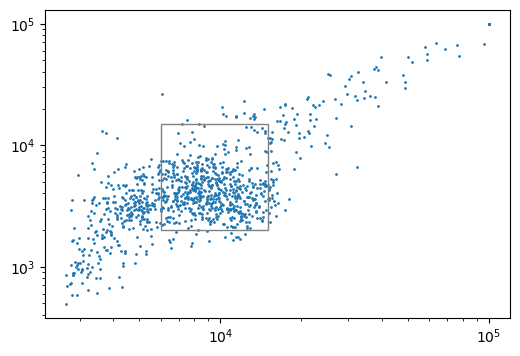

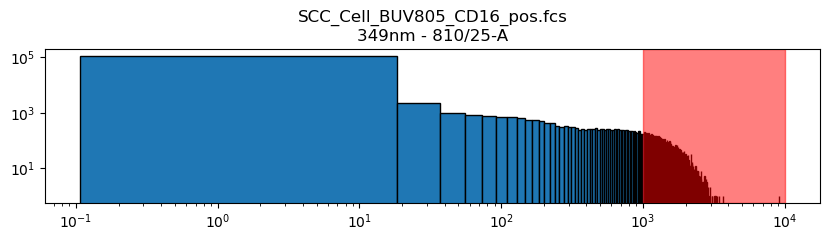

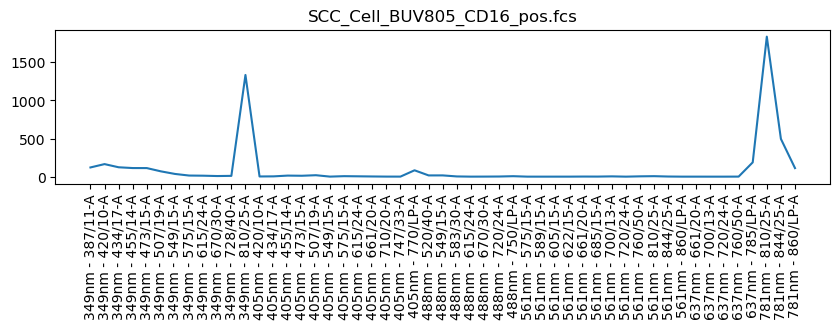

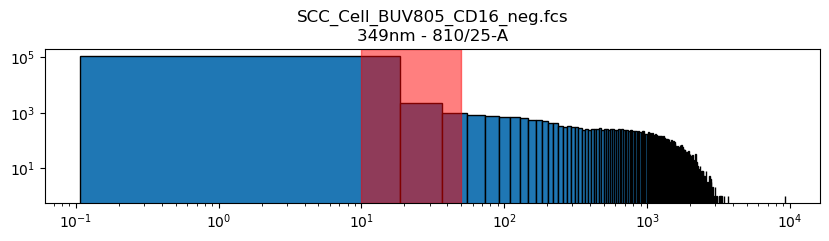

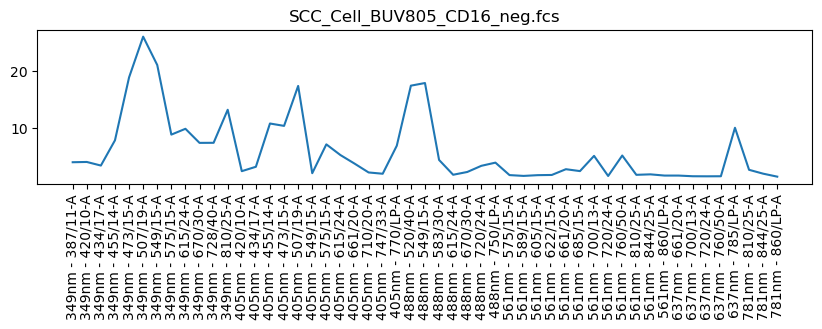

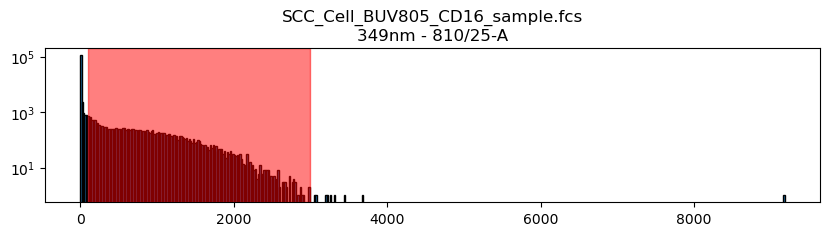

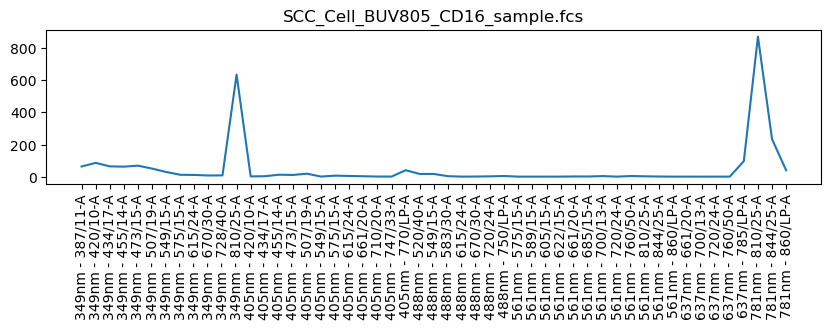

In [55]:
path = Data_dir+"/scc_cells/SCC_Cell_CD16 Run 1 20241112120443.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 810/25-A'

min = 1000
max = 10000
filename = 'SCC_Cell_BUV805_CD16_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Cell_BUV805_CD16_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 3000
filename = 'SCC_Cell_BUV805_CD16_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

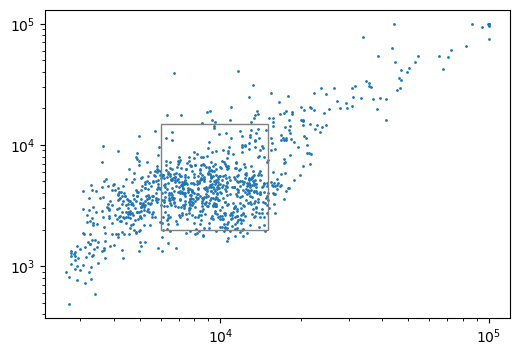

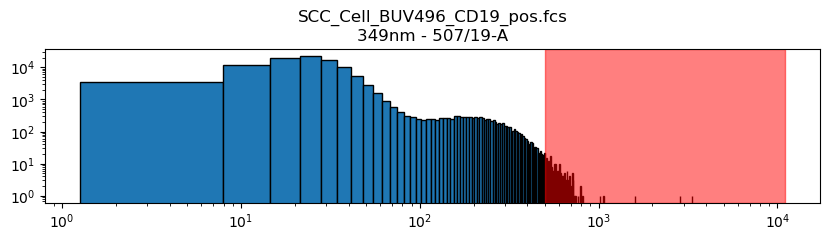

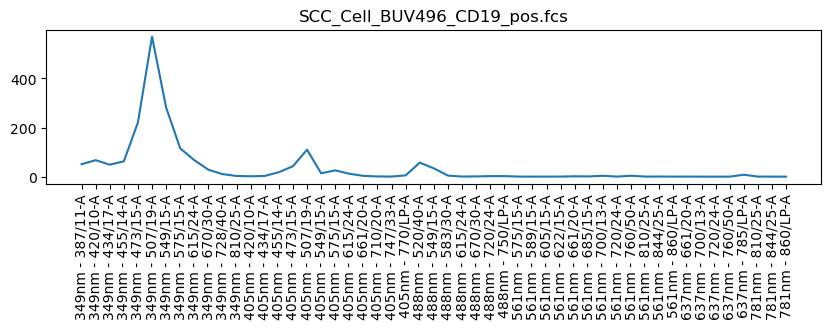

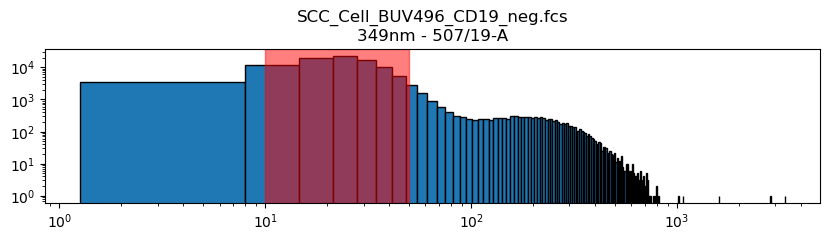

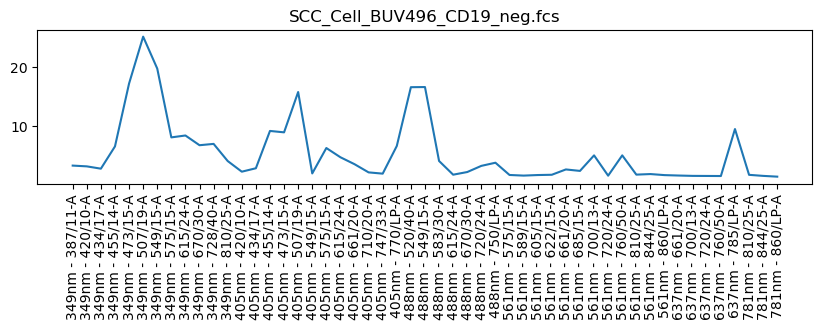

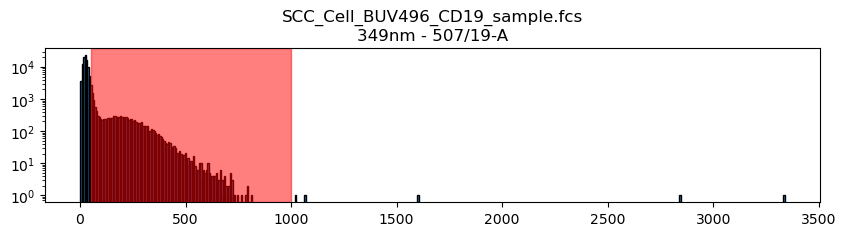

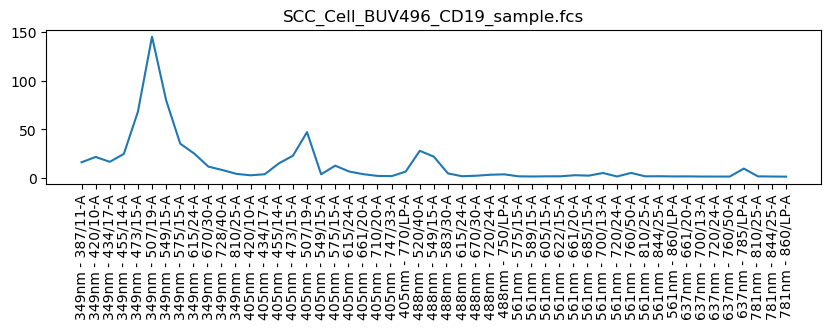

In [56]:
path = Data_dir+"/scc_cells/SCC_Cell_CD19 Run 1 20241112110843.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 507/19-A'

min = 500
max = 11000
filename = 'SCC_Cell_BUV496_CD19_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Cell_BUV496_CD19_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 1000
filename = 'SCC_Cell_BUV496_CD19_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

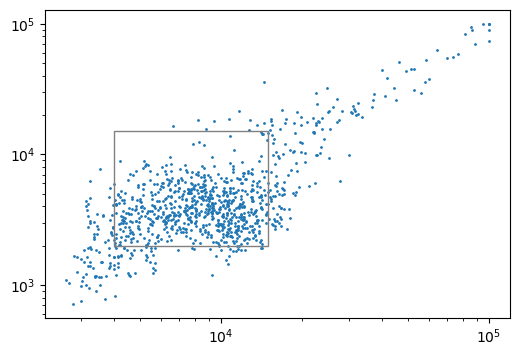

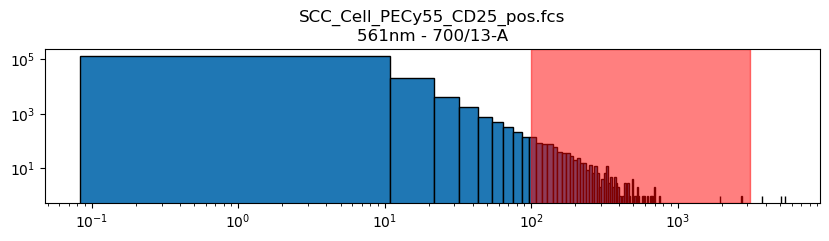

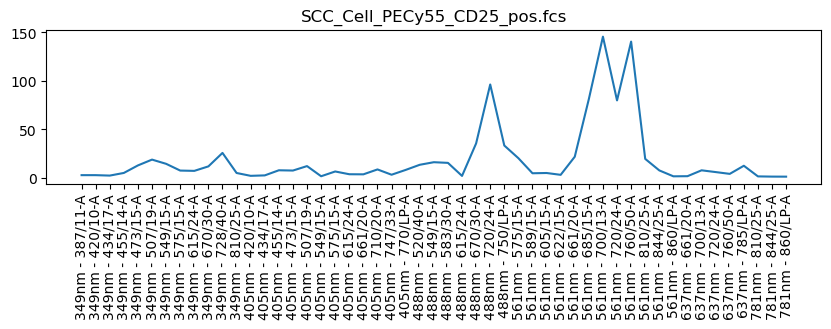

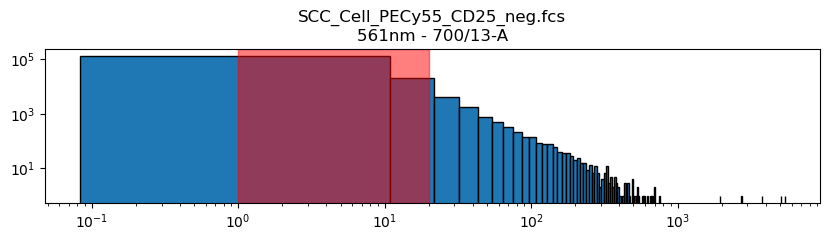

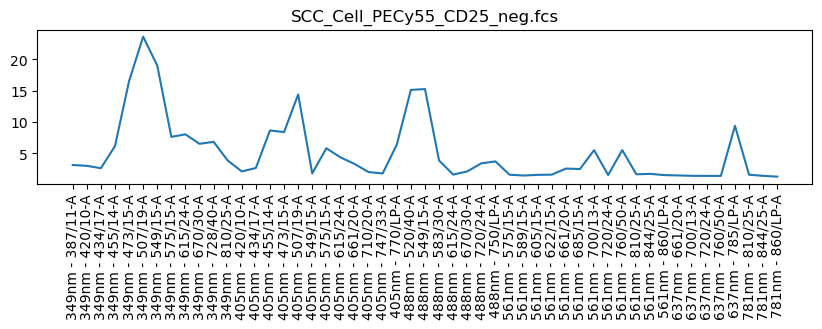

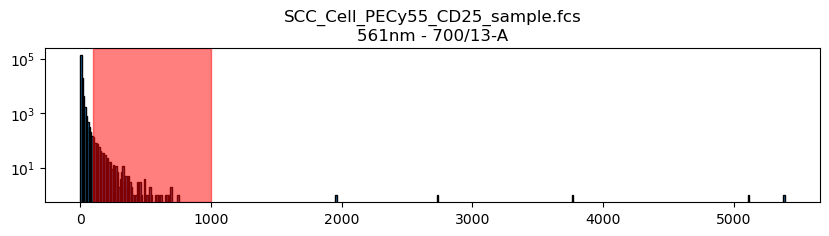

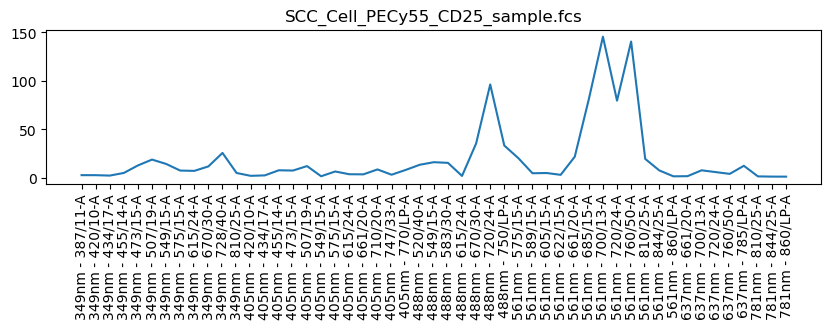

In [57]:
path = Data_dir+"/scc_cells/SCC_Cell_CD25 Run 1 20241112112212.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 700/13-A'

min = 100
max = 3100
filename = 'SCC_Cell_PECy55_CD25_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PECy55_CD25_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 1000
filename = 'SCC_Cell_PECy55_CD25_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

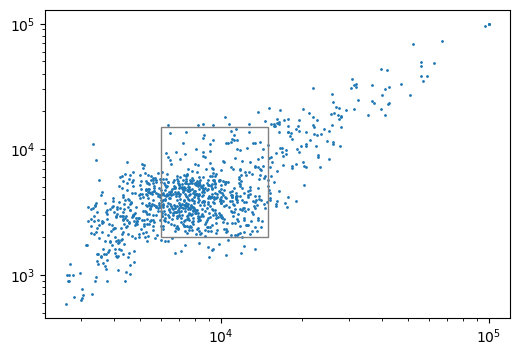

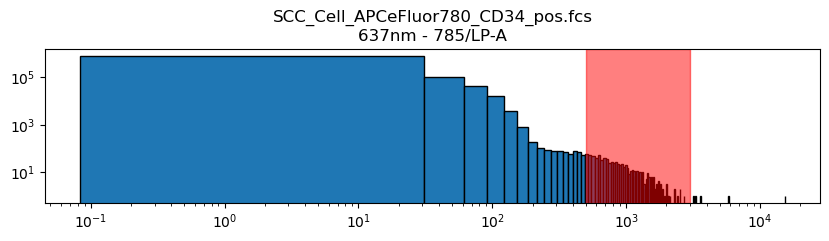

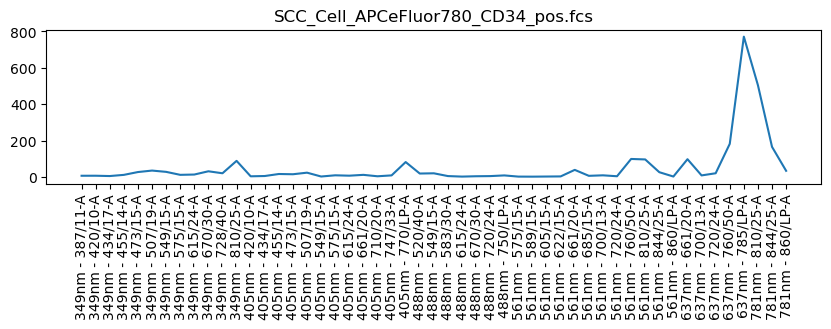

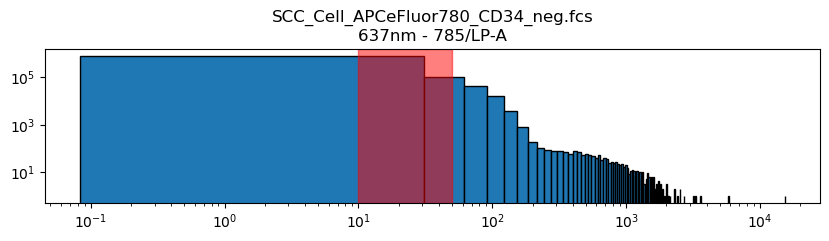

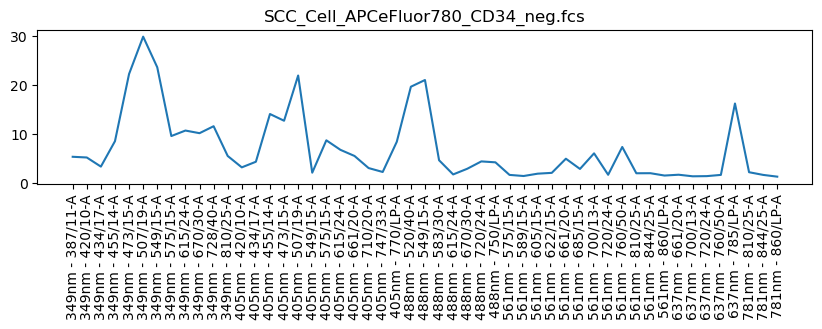

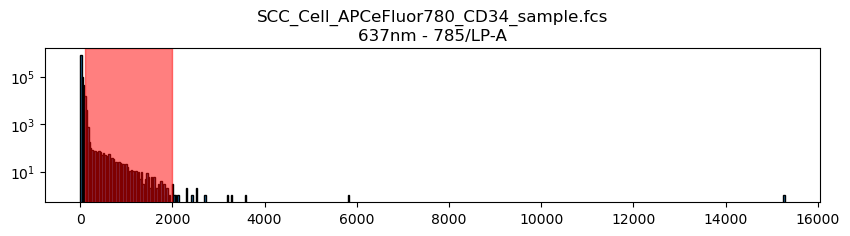

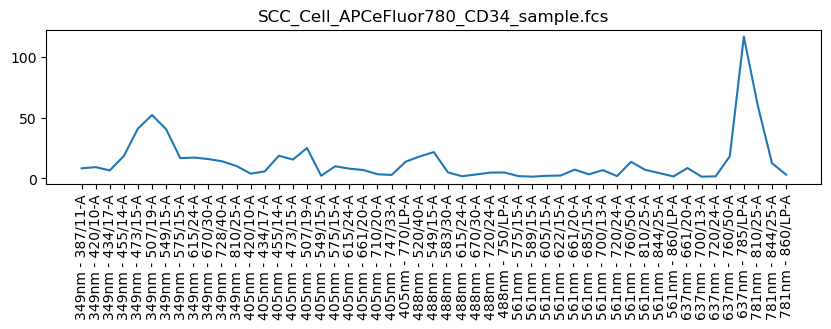

In [58]:
path = Data_dir+"/scc_cells/SCC_Cell_CD34 Run 1 20241112133600.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 785/LP-A'

min = 500
max = 3000
filename = 'SCC_Cell_APCeFluor780_CD34_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 50
filename = 'SCC_Cell_APCeFluor780_CD34_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_APCeFluor780_CD34_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

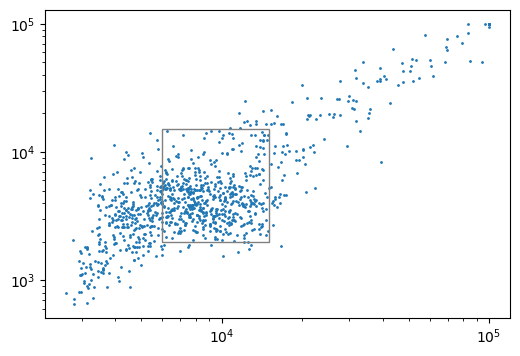

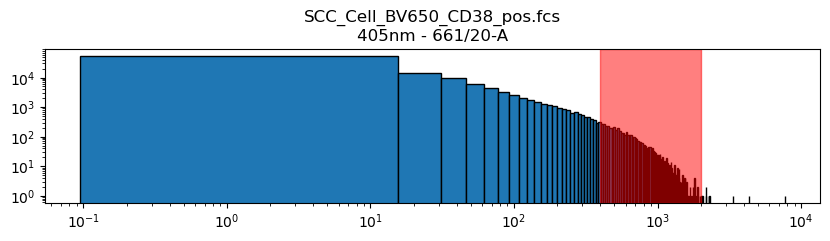

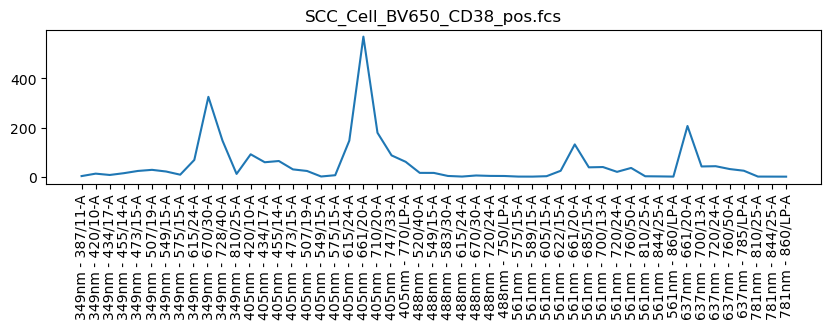

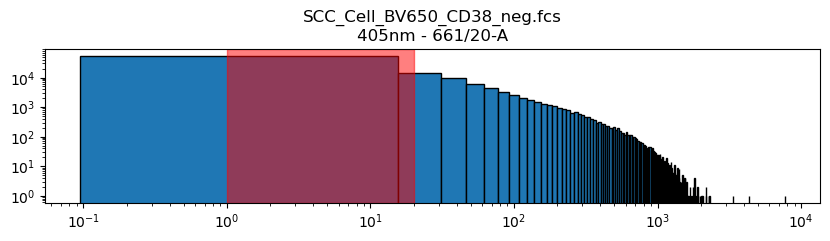

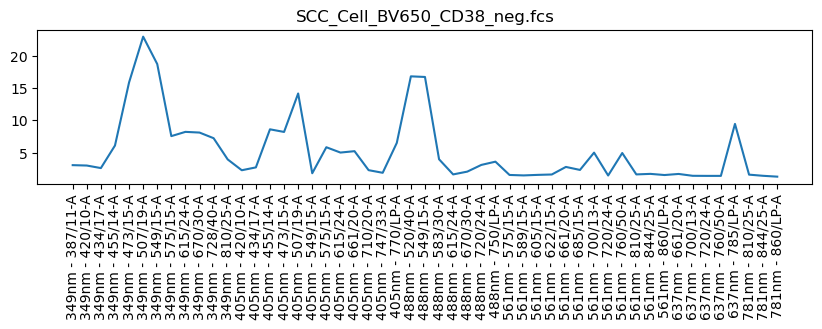

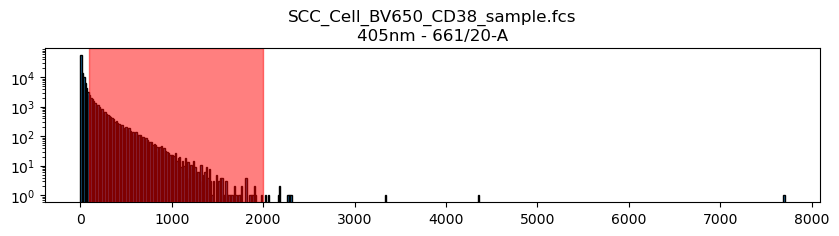

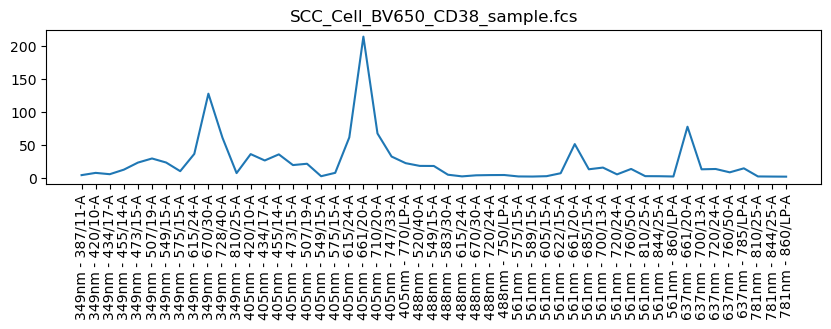

In [59]:
path = Data_dir+"/scc_cells/SCC_Cell_CD38 Run 1 20241112115818.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 661/20-A'

min = 400
max = 2000
filename = 'SCC_Cell_BV650_CD38_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BV650_CD38_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_BV650_CD38_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

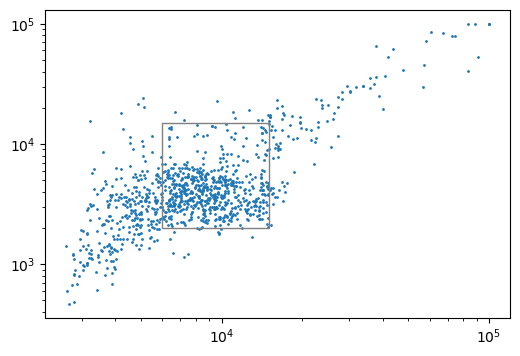

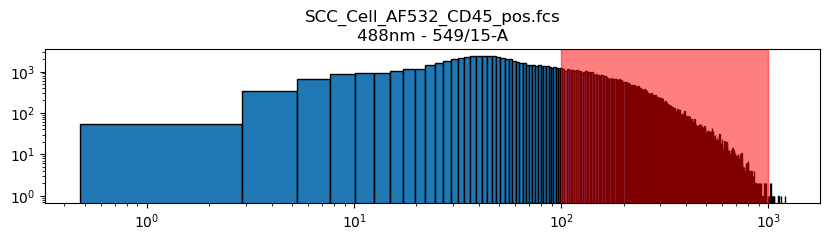

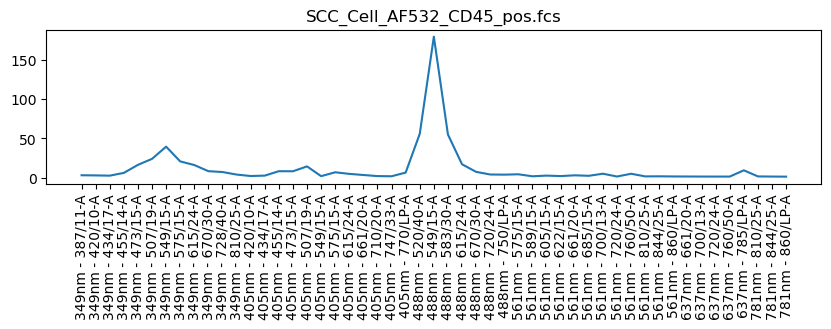

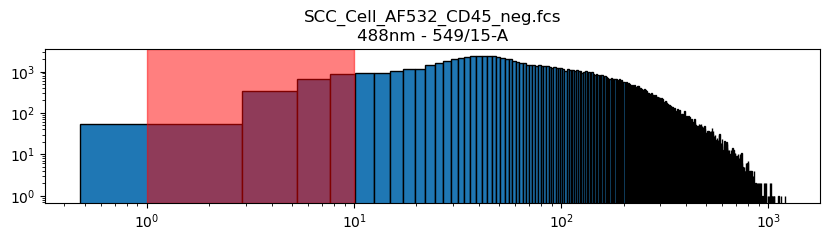

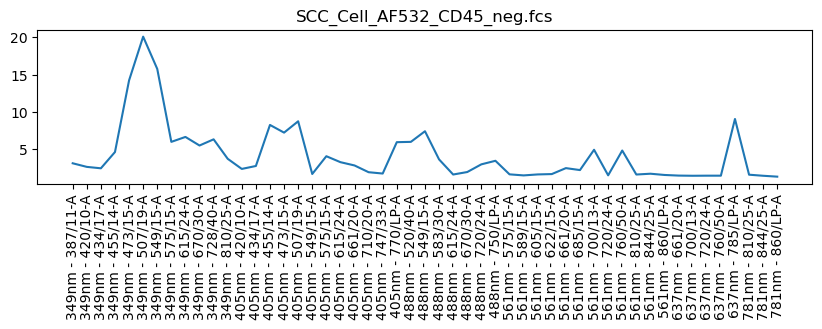

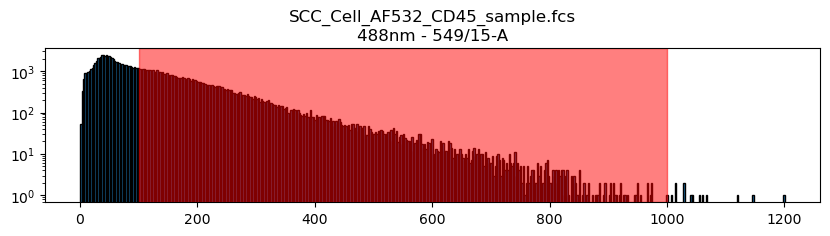

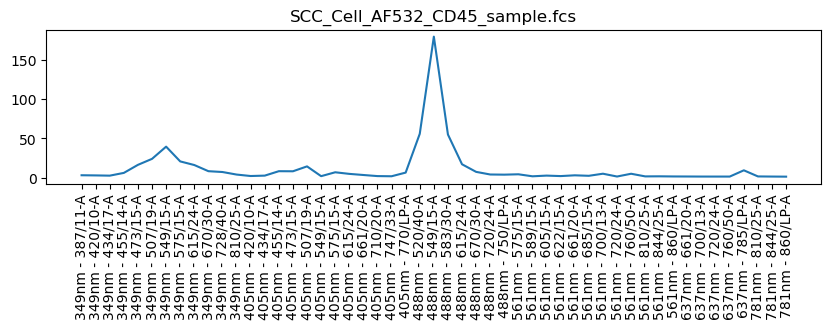

In [60]:
path = Data_dir+"/scc_cells/SCC_Cell_CD45 Run 1 20241112113144.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 549/15-A'

min = 100
max = 1000
filename = 'SCC_Cell_AF532_CD45_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Cell_AF532_CD45_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 1000
filename = 'SCC_Cell_AF532_CD45_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

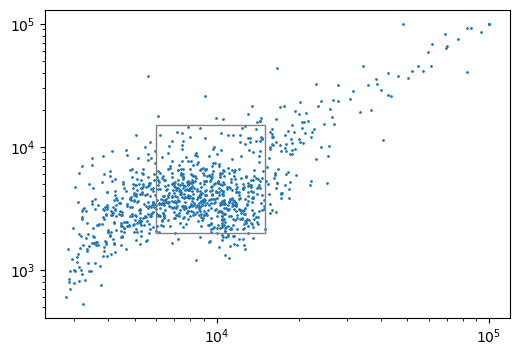

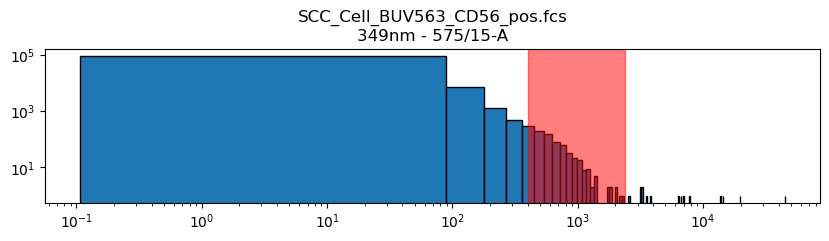

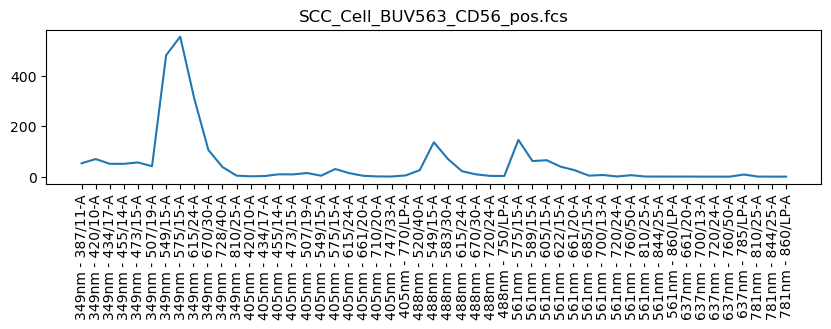

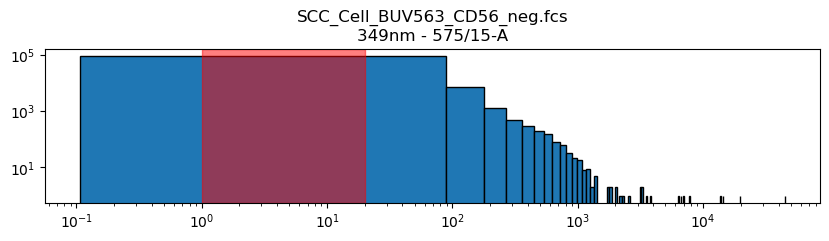

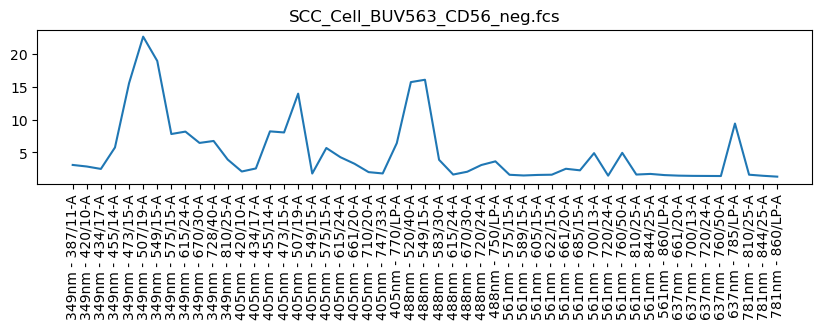

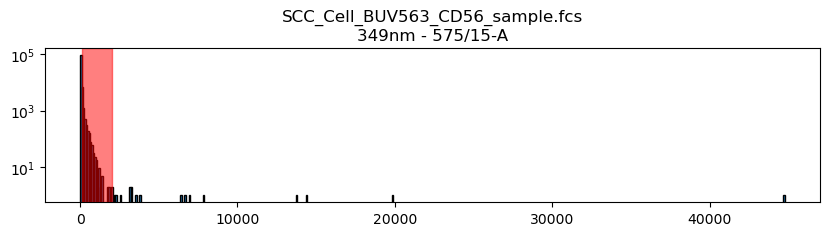

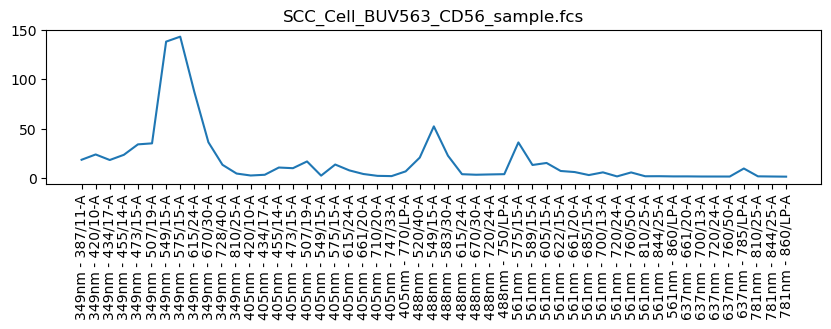

In [61]:
path = Data_dir+"/scc_cells/SCC_Cell_CD56 Run 1 20241112112529.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 575/15-A'

min = 400
max = 2400
filename = 'SCC_Cell_BUV563_CD56_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BUV563_CD56_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_BUV563_CD56_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

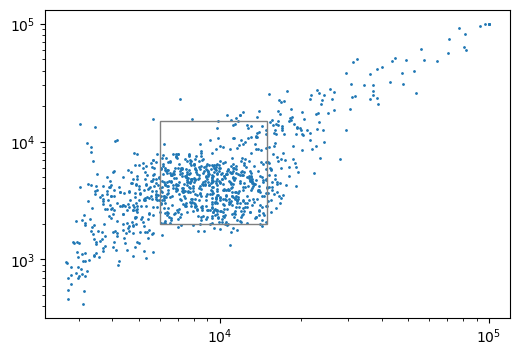

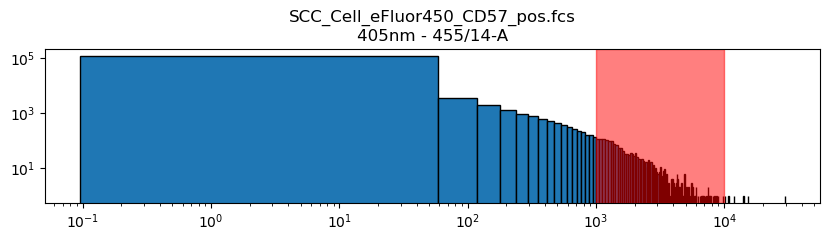

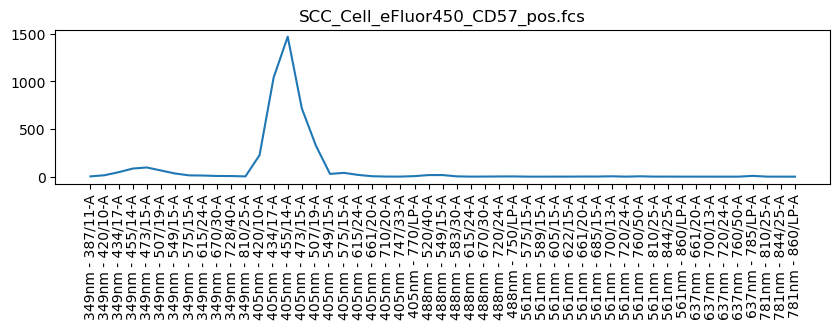

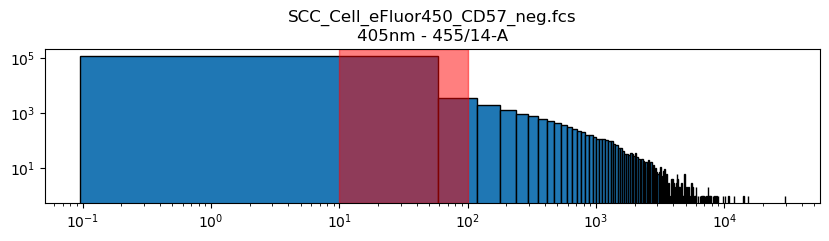

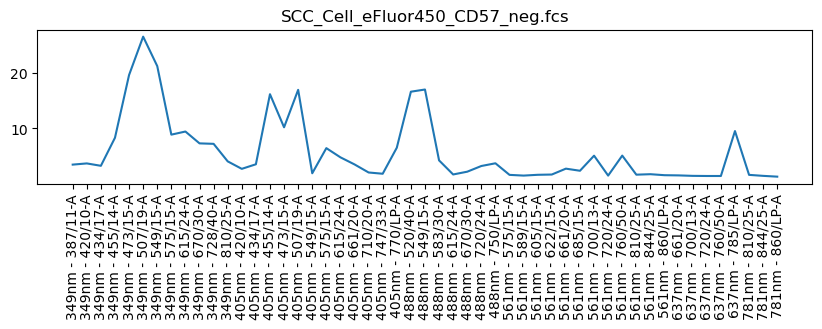

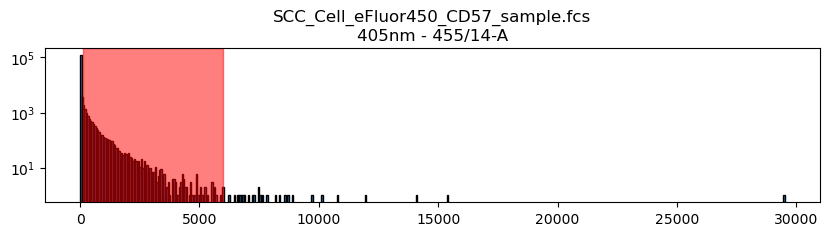

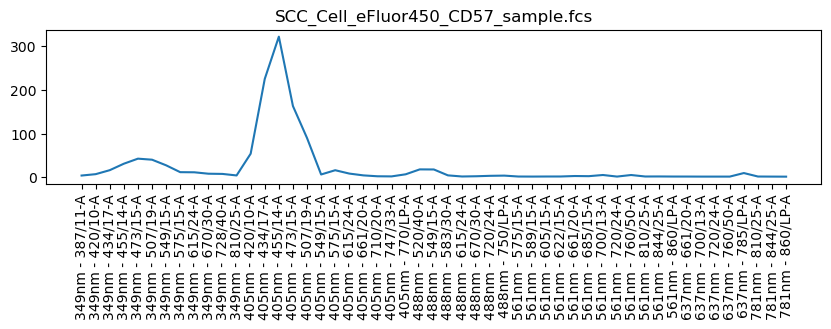

In [62]:
path = Data_dir+"/scc_cells/SCC_Cell_CD57 Run 1 20241112110525.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 455/14-A'

min = 1000
max = 10000
filename = 'SCC_Cell_eFluor450_CD57_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 10
max = 100
filename = 'SCC_Cell_eFluor450_CD57_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 6000
filename = 'SCC_Cell_eFluor450_CD57_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

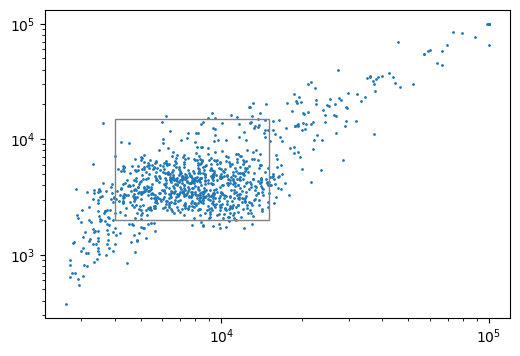

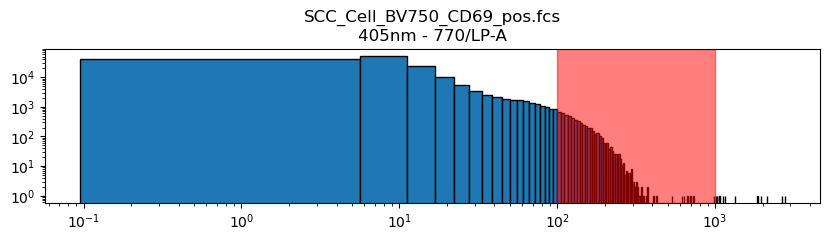

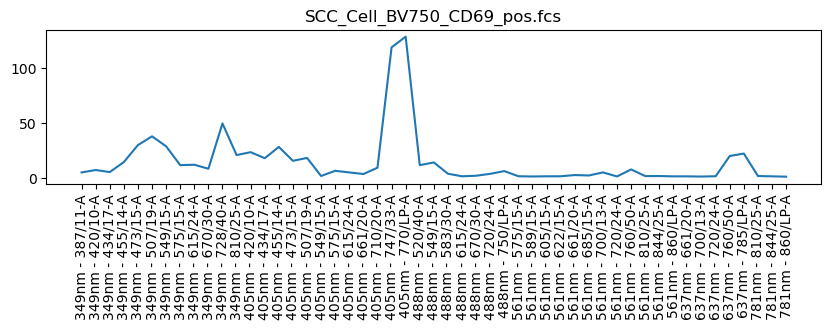

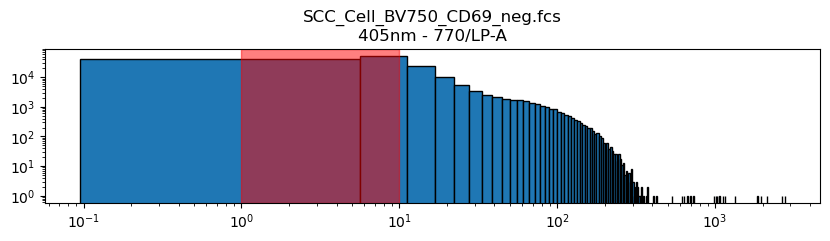

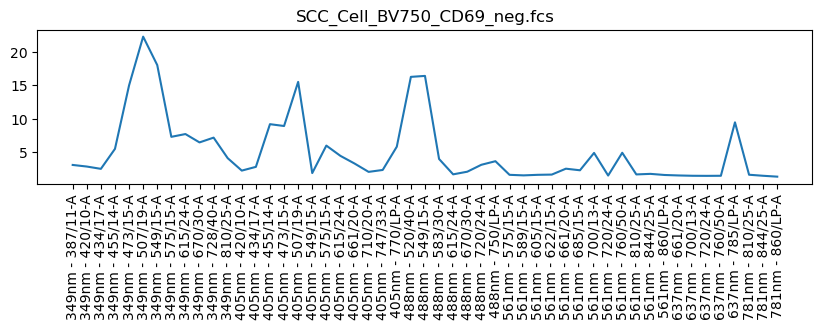

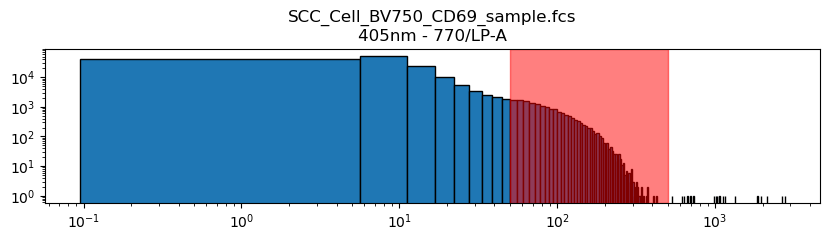

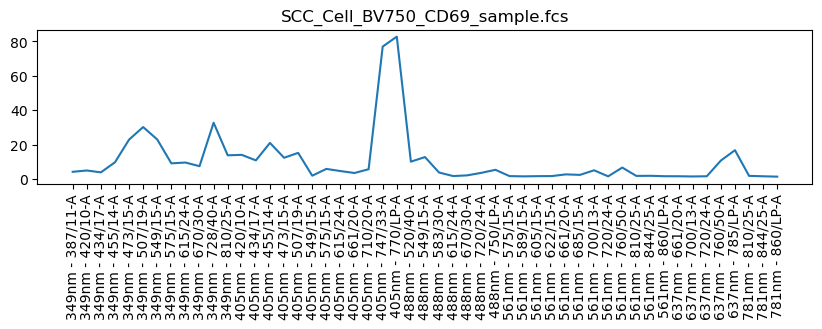

In [ ]:
path = Data_dir+"/scc_cells/SCC_Cell_CD69 Run 1 20241112121457.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 747/33-A'
#peak_channel = '405nm - 770/LP-A'

min = 100
max = 1000
filename = 'SCC_Cell_BV750_CD69_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Cell_BV750_CD69_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 500
filename = 'SCC_Cell_BV750_CD69_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

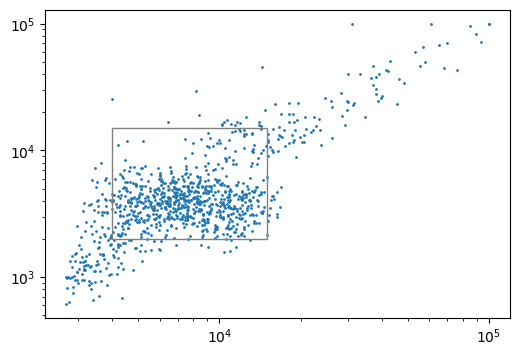

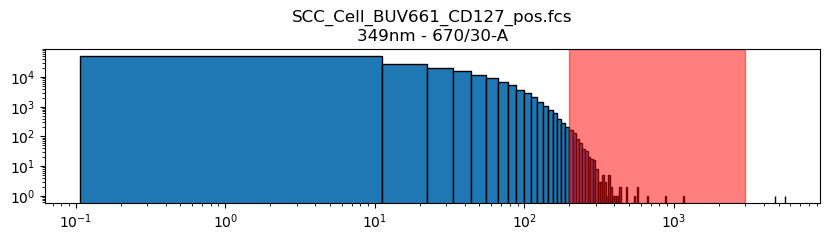

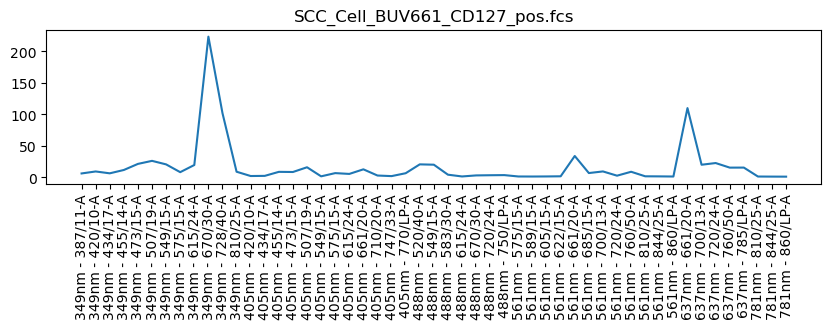

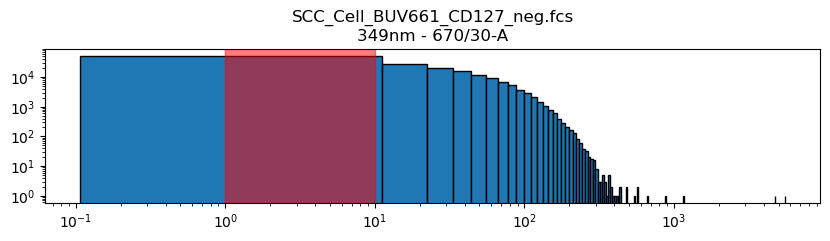

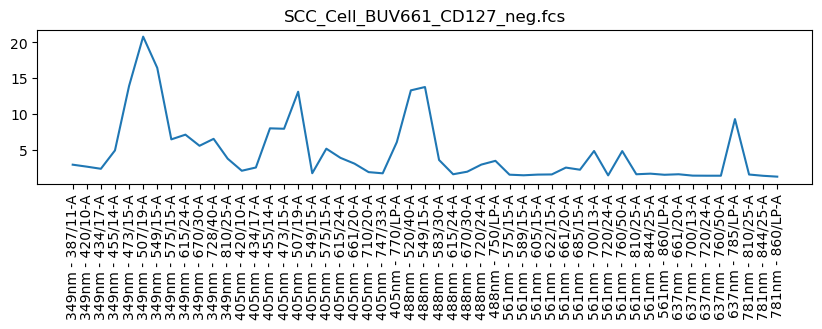

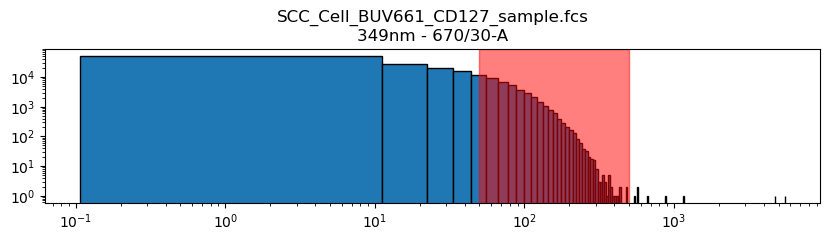

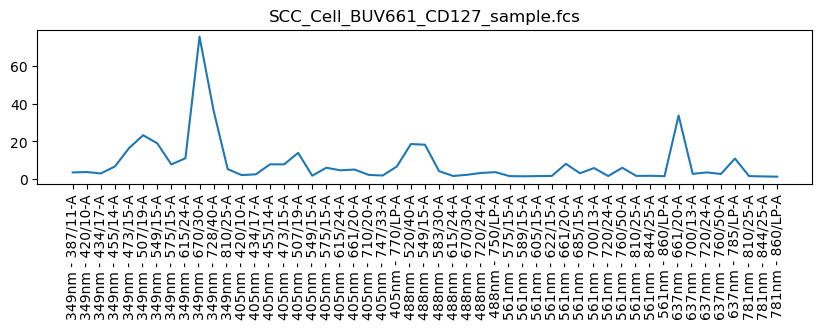

In [64]:
path = Data_dir+"/scc_cells/SCC_Cell_CD127 Run 1 20241112114513.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 670/30-A'

min = 200
max = 3000
filename = 'SCC_Cell_BUV661_CD127_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Cell_BUV661_CD127_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 500
filename = 'SCC_Cell_BUV661_CD127_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

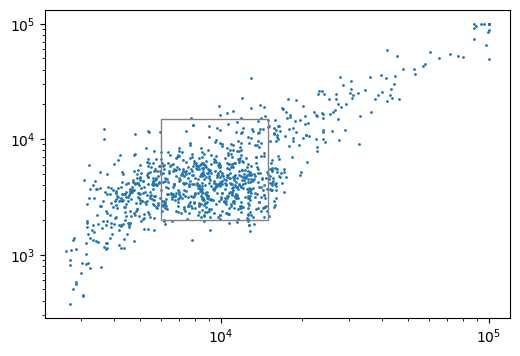

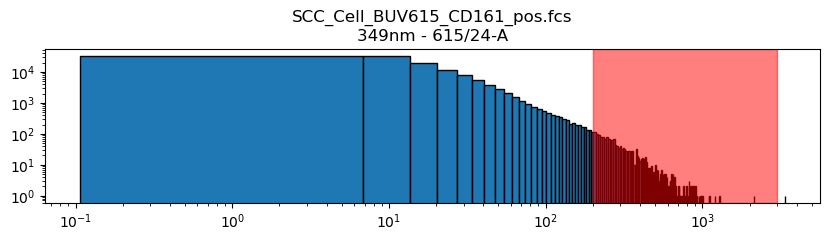

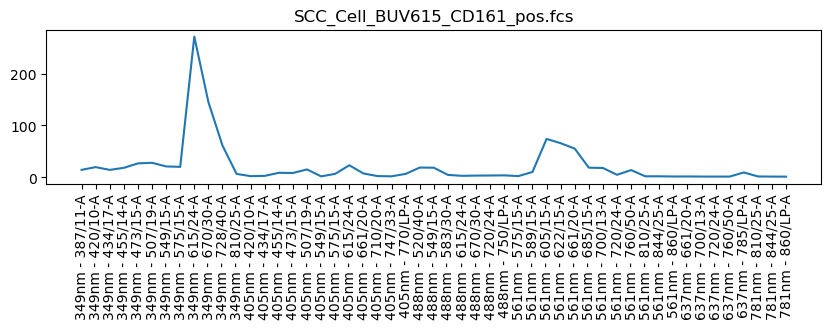

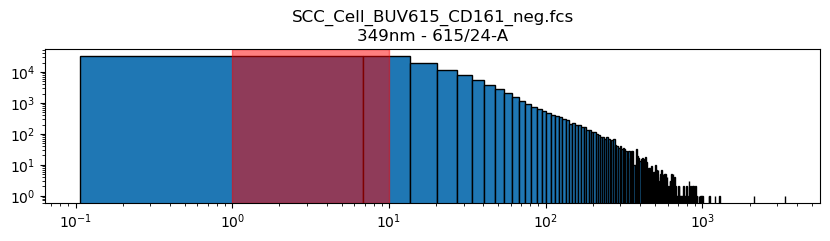

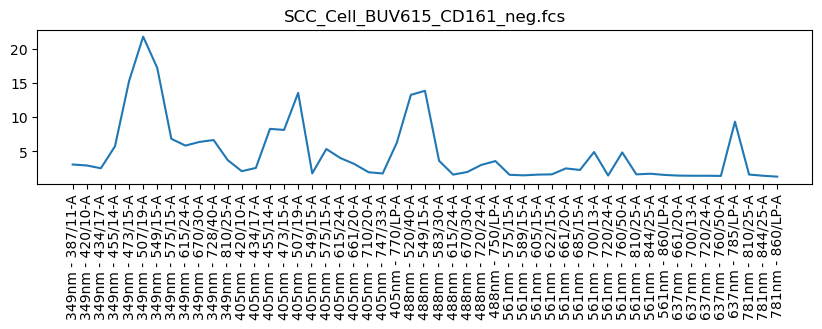

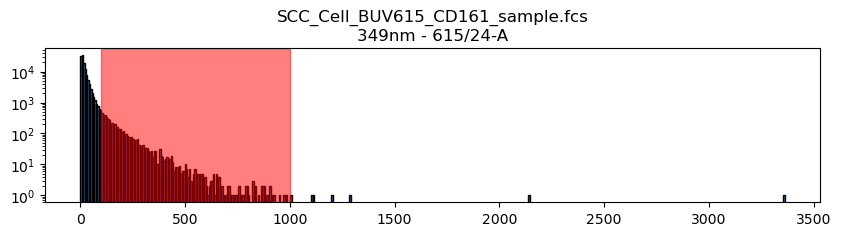

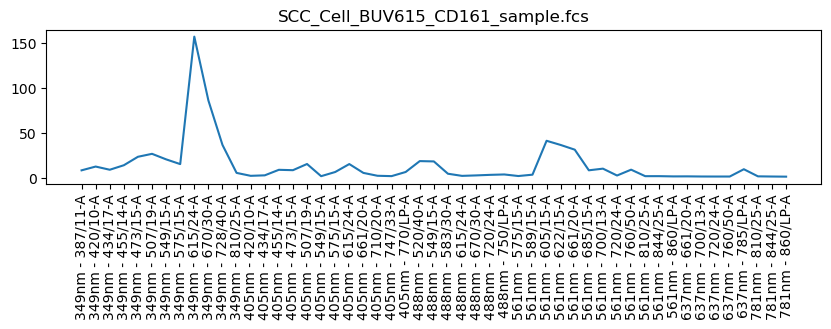

In [65]:
path = Data_dir+"/scc_cells/SCC_Cell_CD161 Run 1 20241112113455.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 615/24-A'

min = 200
max = 3000
filename = 'SCC_Cell_BUV615_CD161_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Cell_BUV615_CD161_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 1000
filename = 'SCC_Cell_BUV615_CD161_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

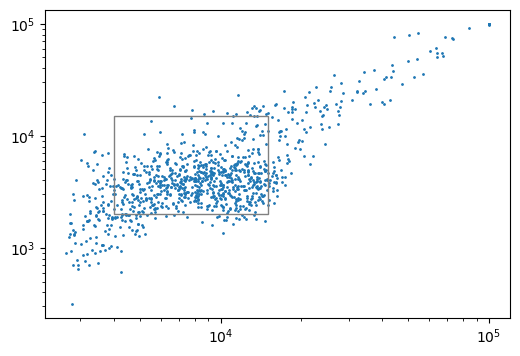

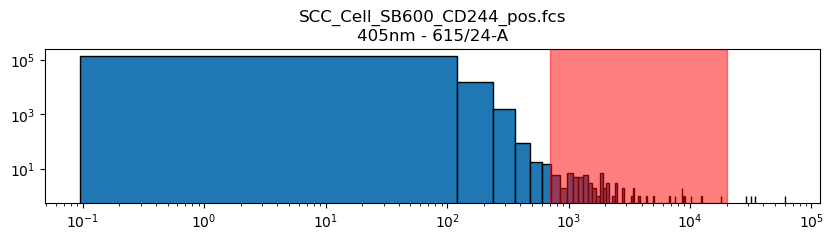

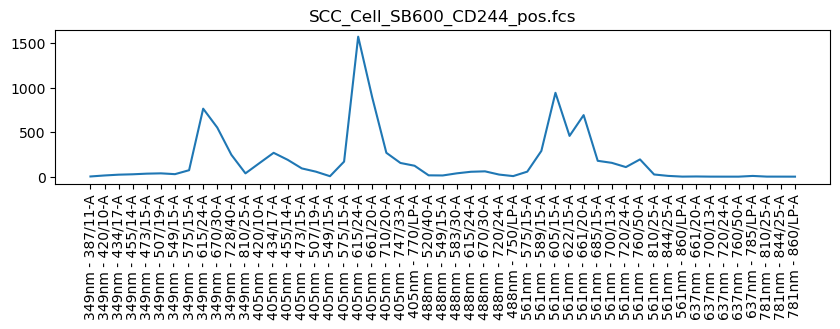

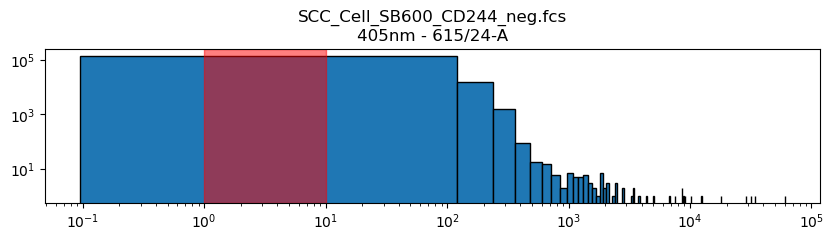

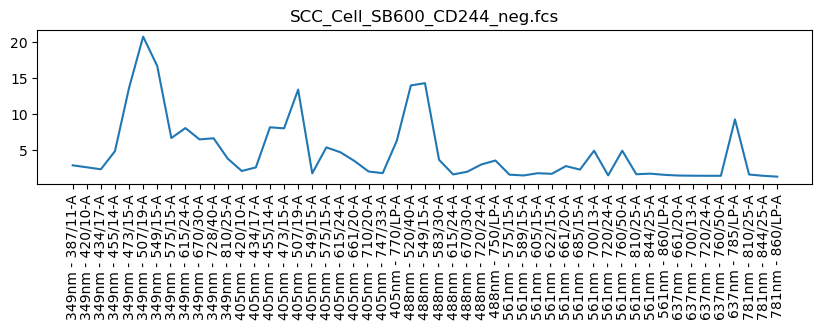

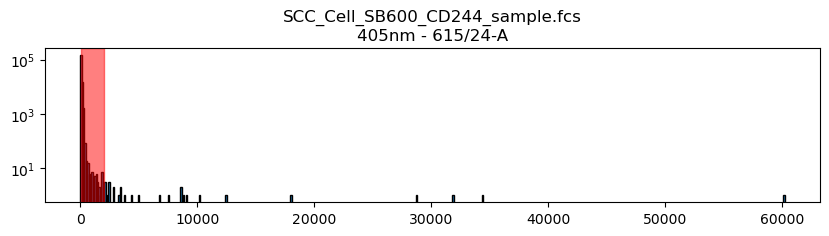

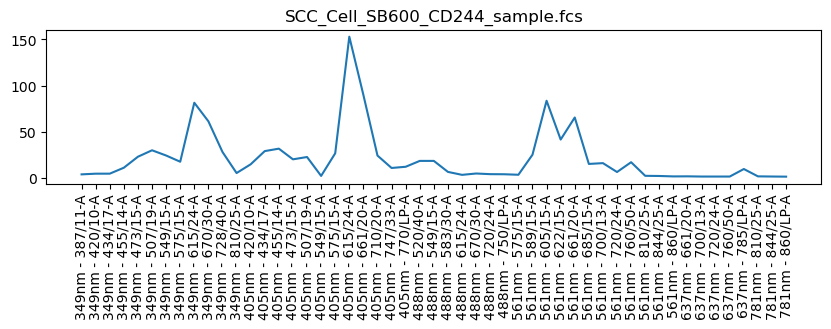

In [66]:
path = Data_dir+"/scc_cells/SCC_Cell_CD244 Run 1 20241112114836.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 615/24-A'

min = 700
max = 20000
filename = 'SCC_Cell_SB600_CD244_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_Cell_SB600_CD244_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_SB600_CD244_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

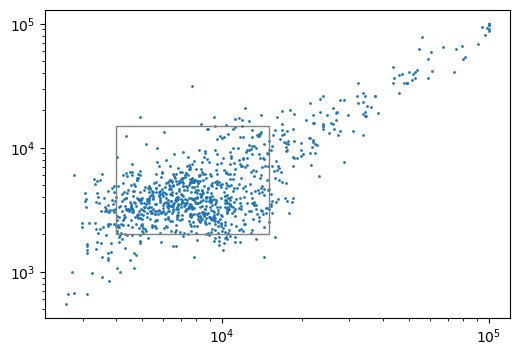

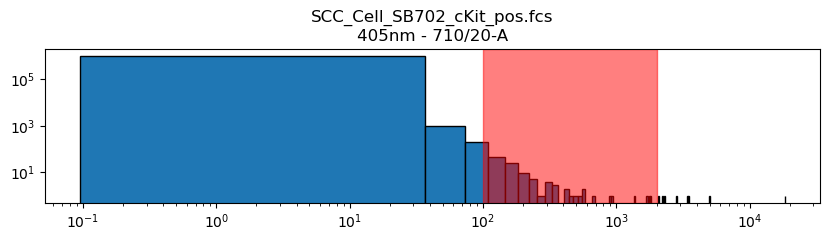

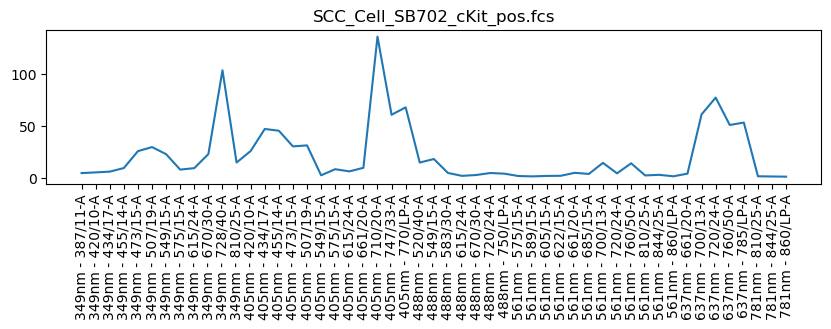

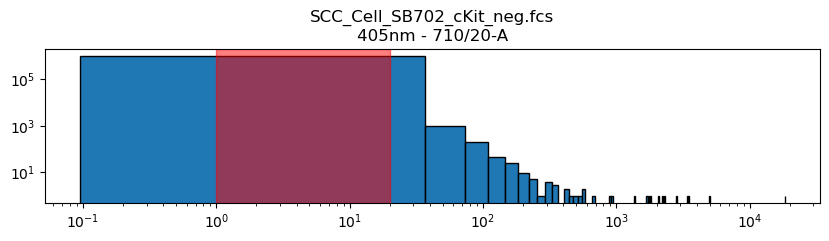

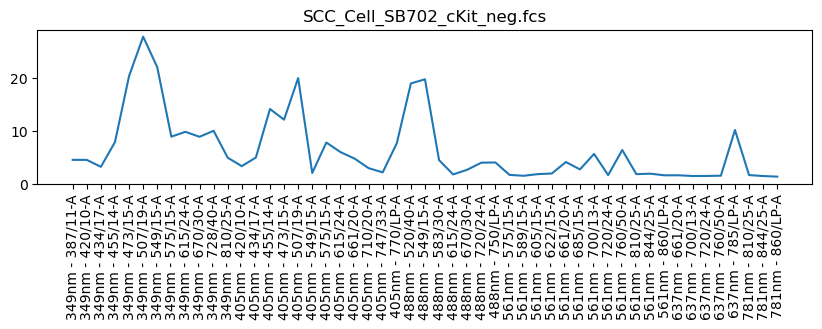

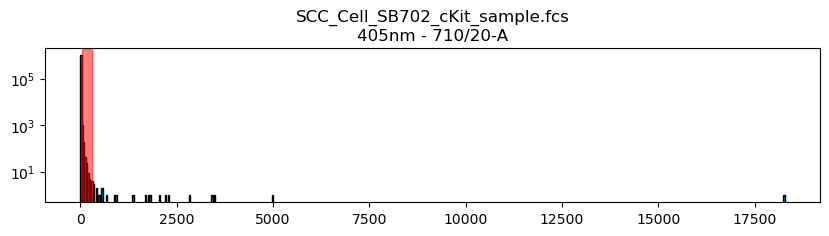

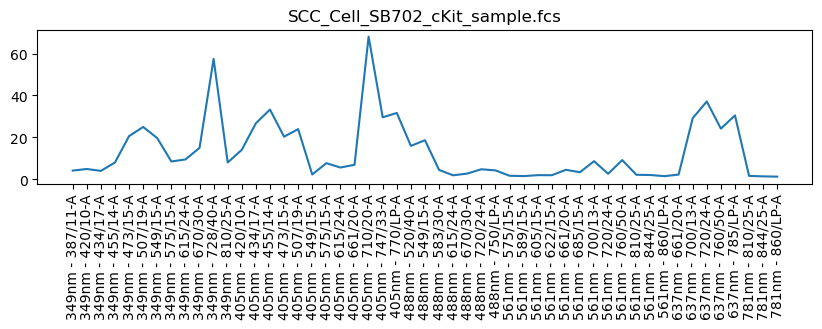

In [67]:
path = Data_dir+"/scc_cells/SCC_Cell_cKit Run 1 20241112132607.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 710/20-A'

min = 100
max = 2000
filename = 'SCC_Cell_SB702_cKit_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_SB702_cKit_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 300
filename = 'SCC_Cell_SB702_cKit_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

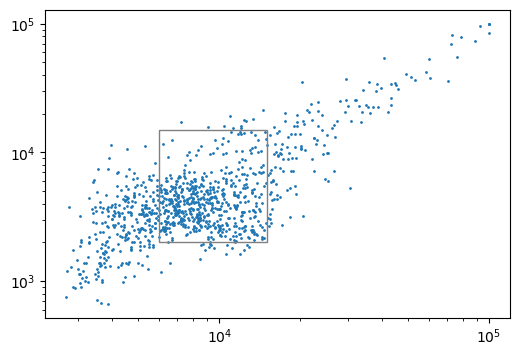

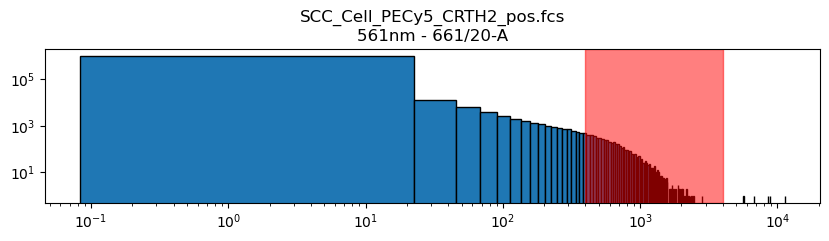

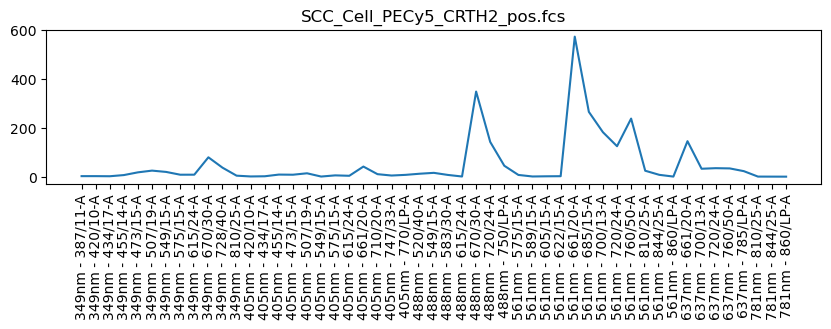

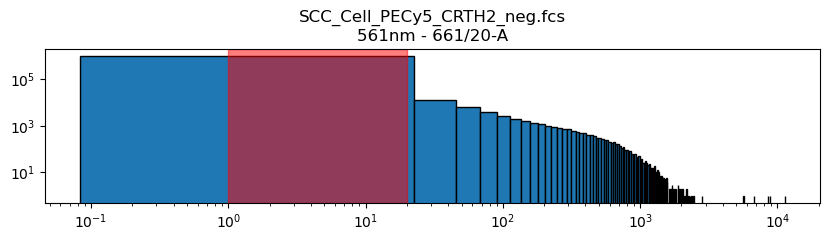

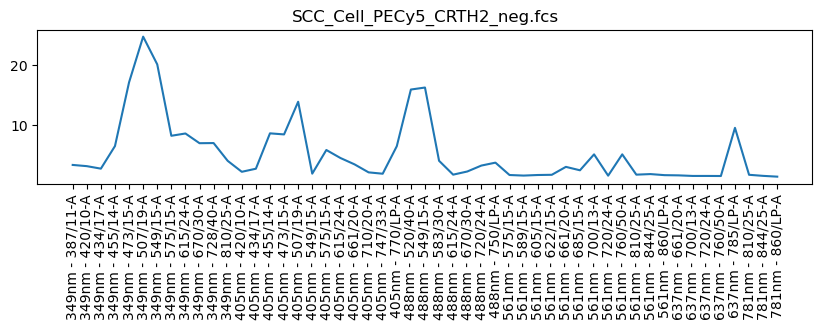

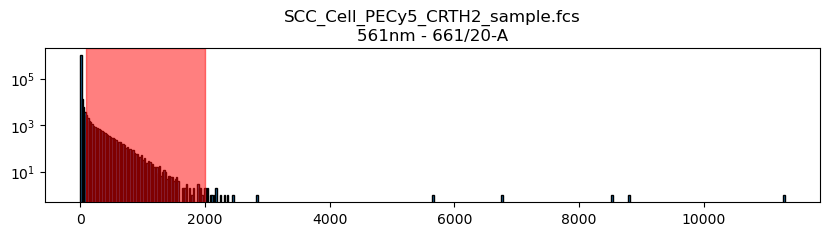

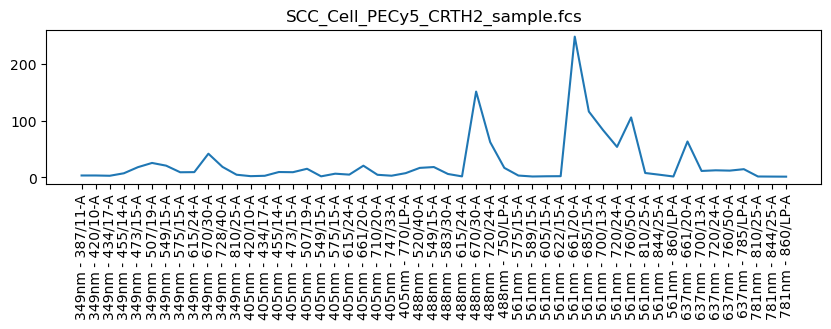

In [68]:
path = Data_dir+"/scc_cells/SCC_Cell_CRTH2 Run 1 20241112123830.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 661/20-A'

min = 400
max = 4000
filename = 'SCC_Cell_PECy5_CRTH2_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PECy5_CRTH2_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_PECy5_CRTH2_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

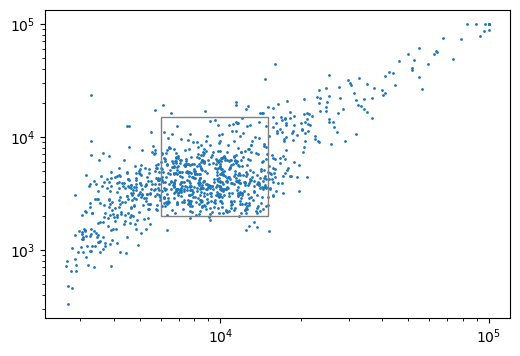

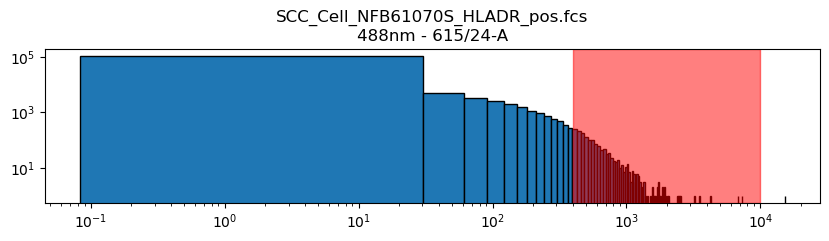

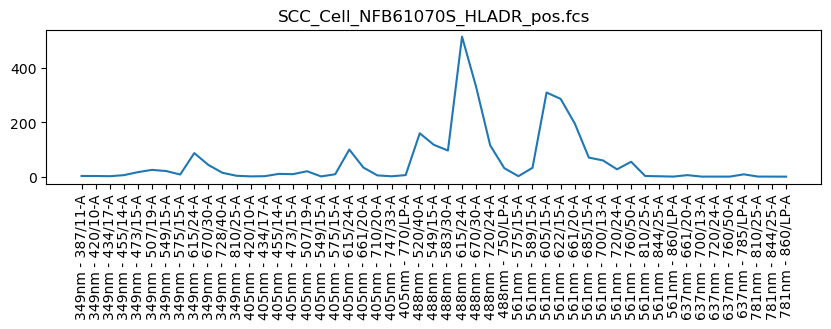

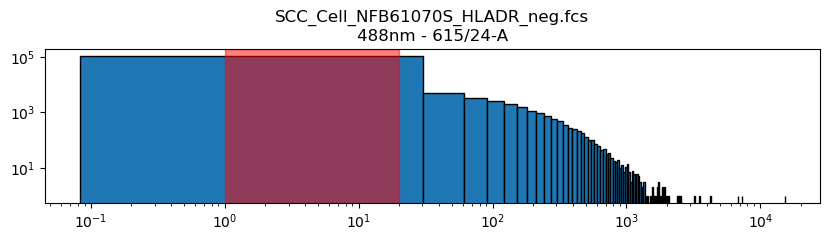

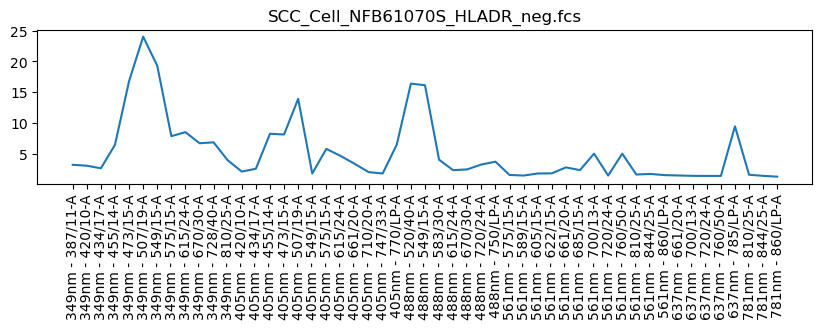

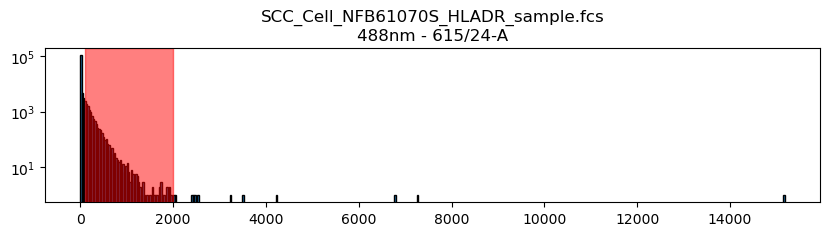

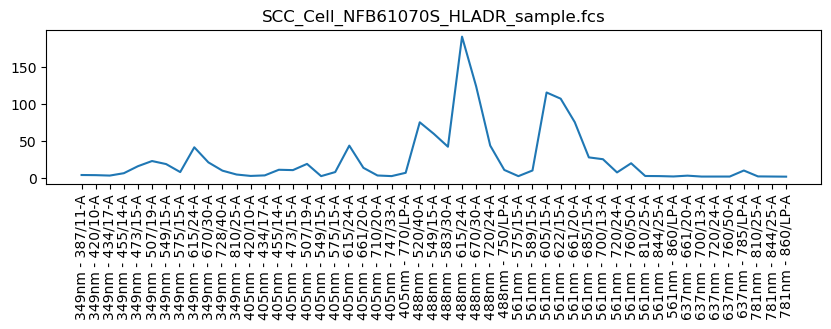

In [69]:
path = Data_dir+"/scc_cells/SCC_Cell_HLADR Run 1 20241112114204.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 615/24-A'

min = 400
max = 10000
filename = 'SCC_Cell_NFB61070S_HLADR_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_NFB61070S_HLADR_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_NFB61070S_HLADR_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

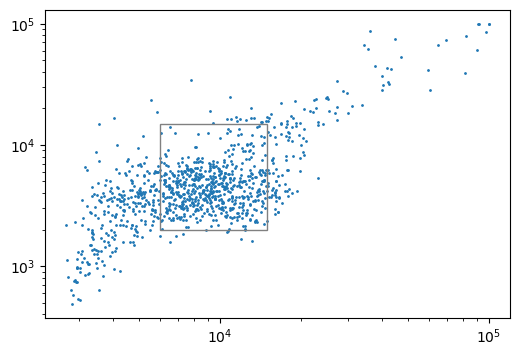

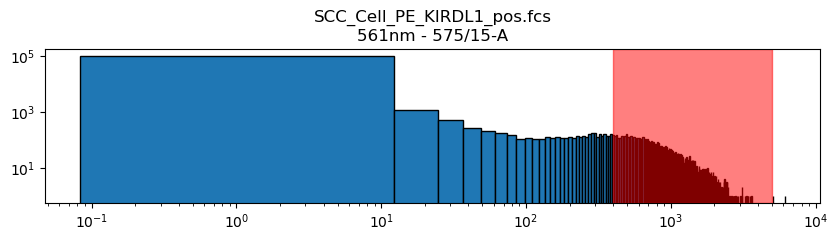

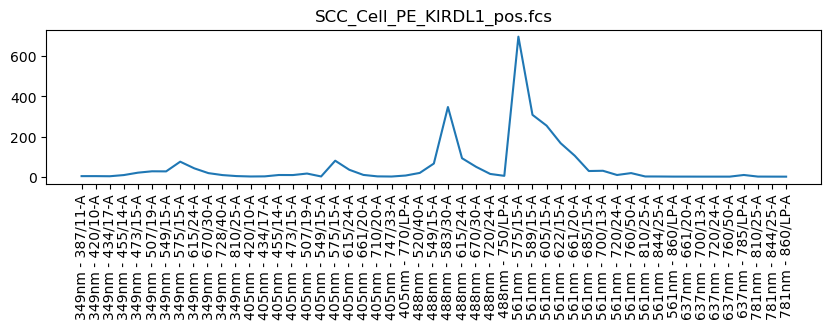

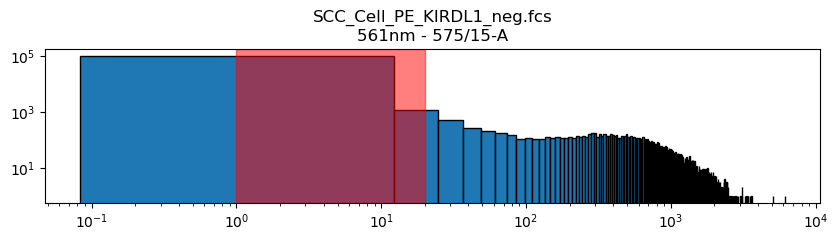

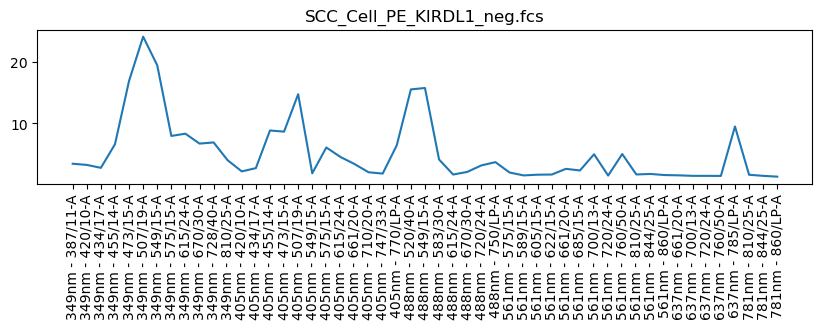

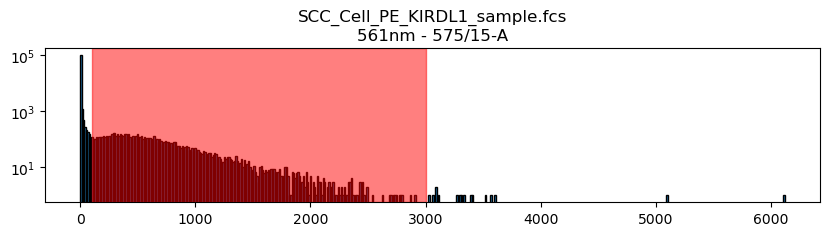

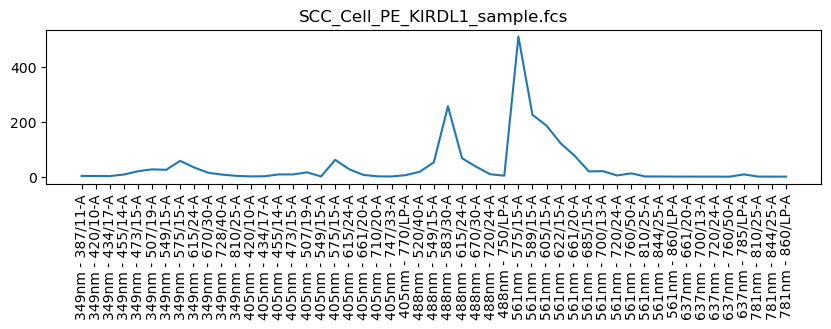

In [70]:
path = Data_dir+"/scc_cells/SCC_Cell_KIRDL1 Run 1 20241112120750.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 575/15-A'

min = 400
max = 5000
filename = 'SCC_Cell_PE_KIRDL1_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PE_KIRDL1_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 3000
filename = 'SCC_Cell_PE_KIRDL1_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

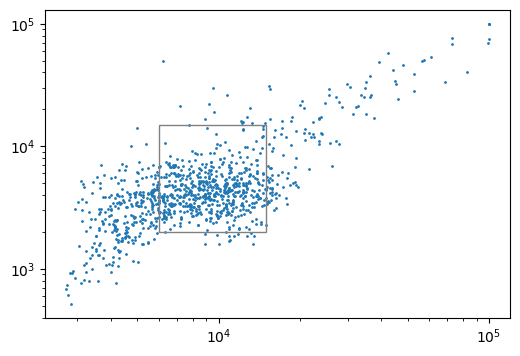

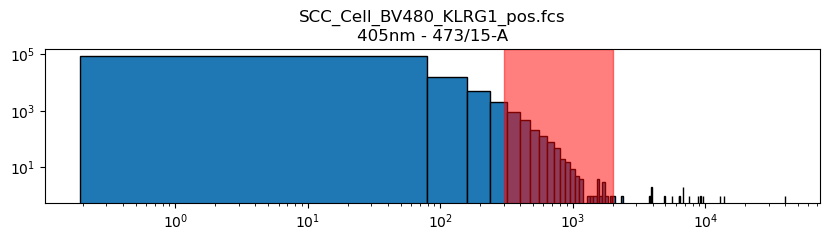

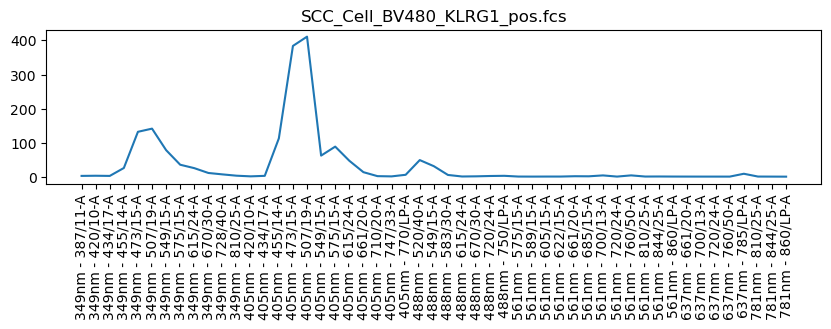

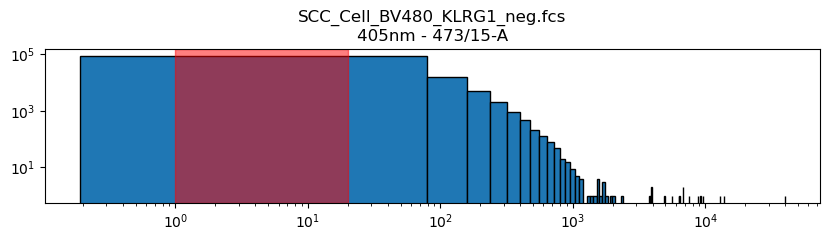

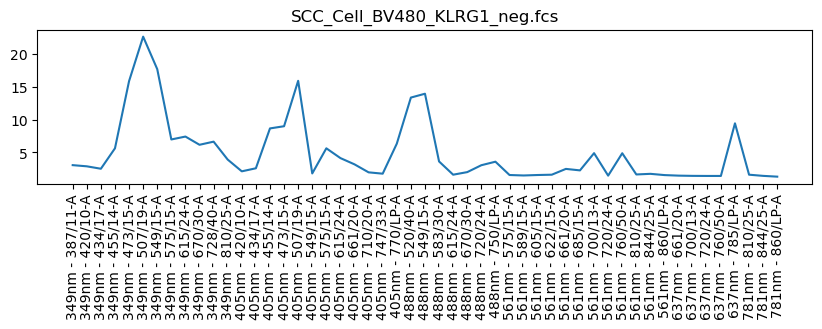

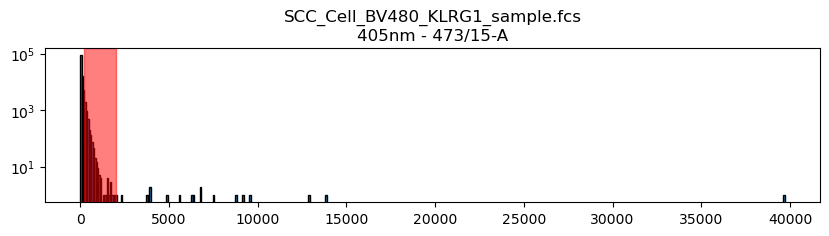

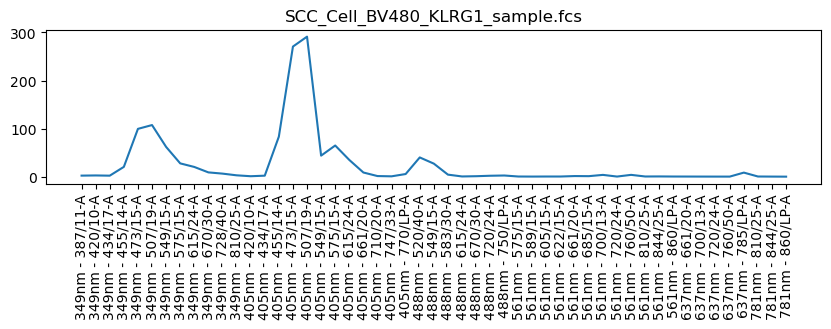

In [71]:
path = Data_dir+"/scc_cells/SCC_Cell_KLRG1 Run 1 20241112111246.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 473/15-A'

min = 300
max = 2000
filename = 'SCC_Cell_BV480_KLRG1_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BV480_KLRG1_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 200
max = 2000
filename = 'SCC_Cell_BV480_KLRG1_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

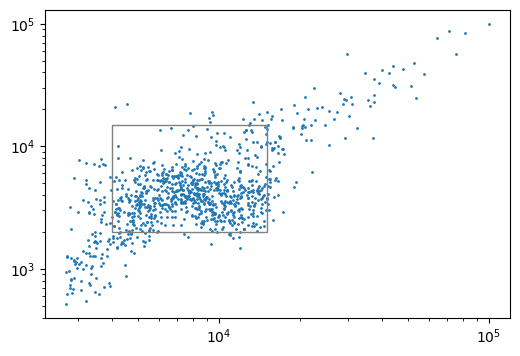

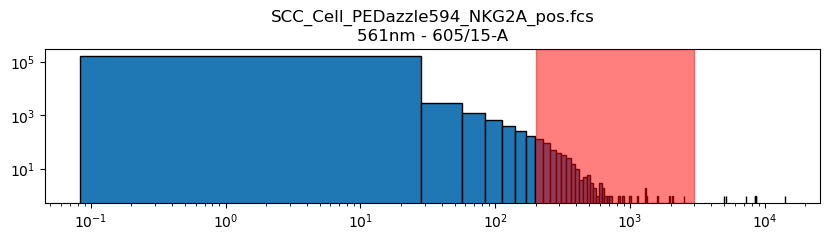

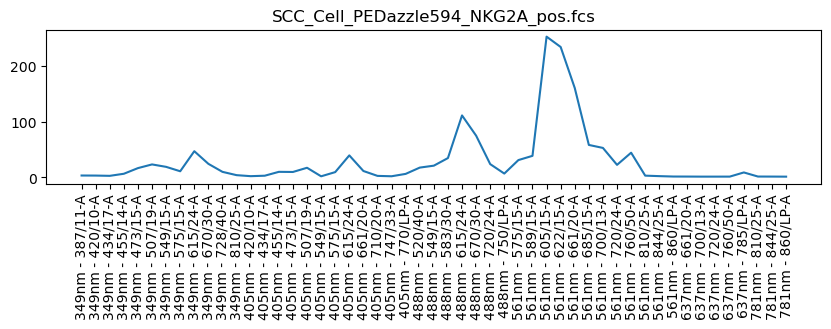

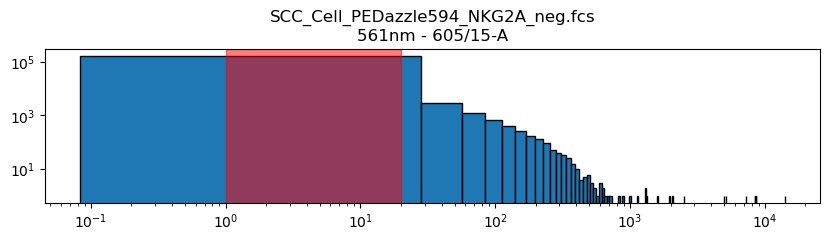

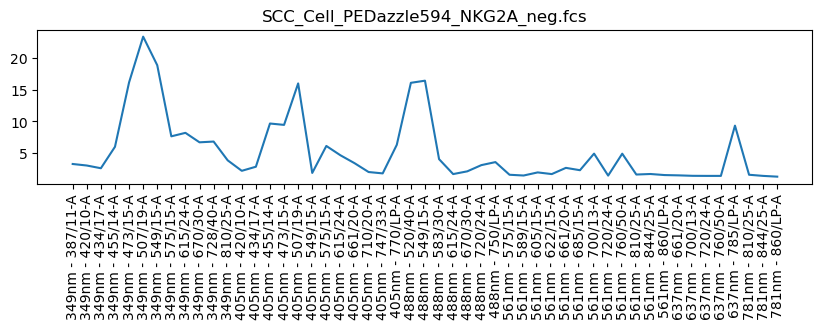

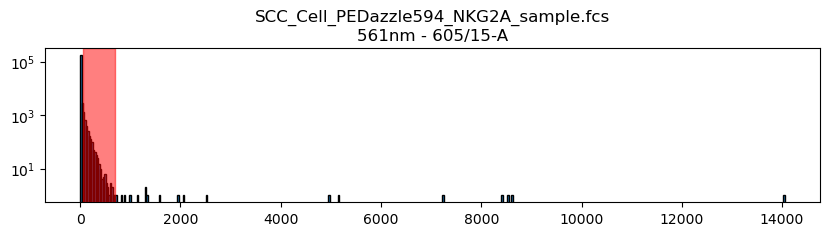

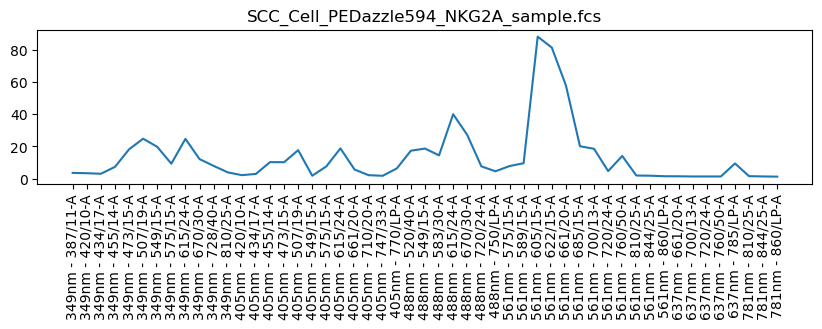

In [72]:
path = Data_dir+"/scc_cells/SCC_Cell_NKG2A Run 1 20241112121822.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 605/15-A'

min = 200
max = 3000
filename = 'SCC_Cell_PEDazzle594_NKG2A_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PEDazzle594_NKG2A_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 50
max = 700
filename = 'SCC_Cell_PEDazzle594_NKG2A_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

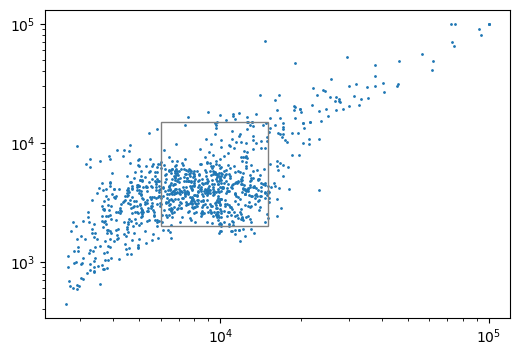

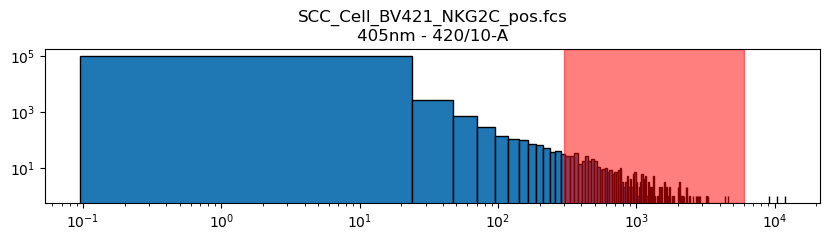

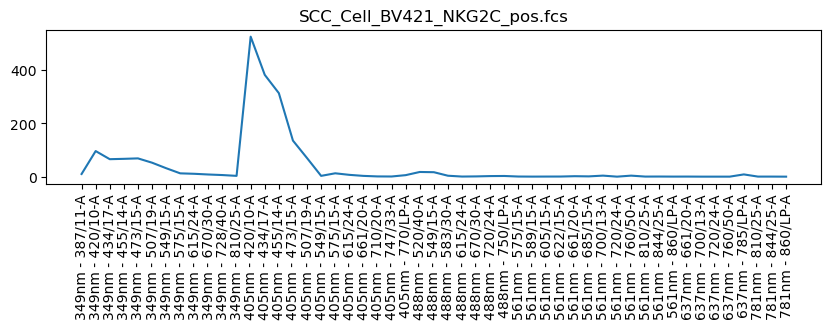

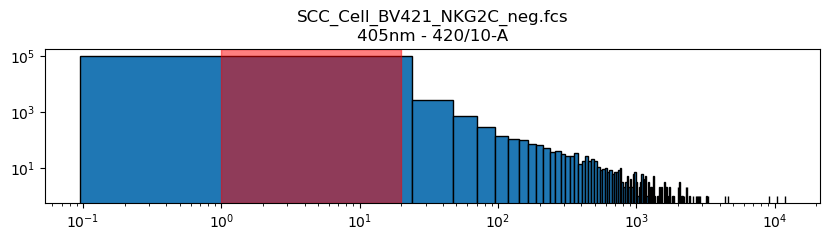

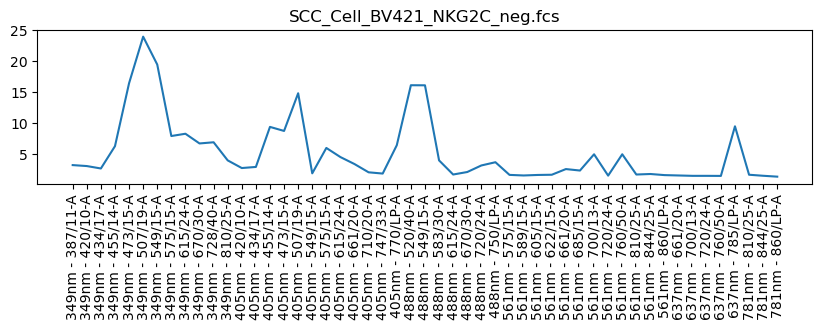

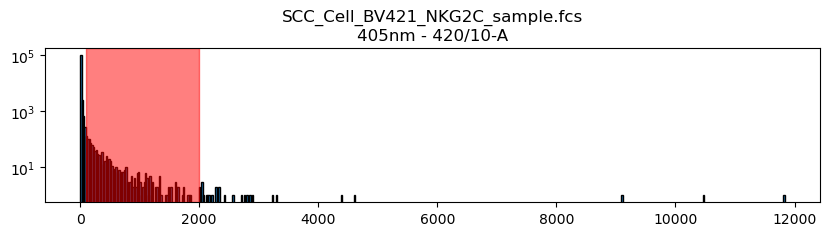

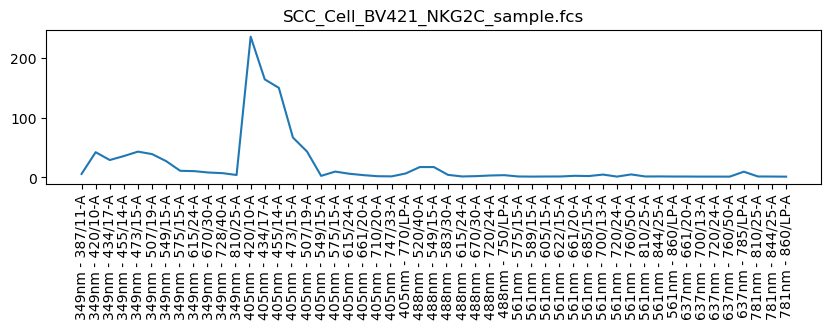

In [73]:
path = Data_dir+"/scc_cells/SCC_Cell_NKG2C Run 1 20241112121106.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 420/10-A'

min = 300
max = 6000
filename = 'SCC_Cell_BV421_NKG2C_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BV421_NKG2C_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 100
max = 2000
filename = 'SCC_Cell_BV421_NKG2C_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

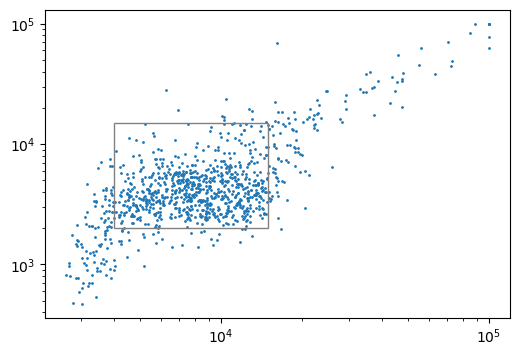

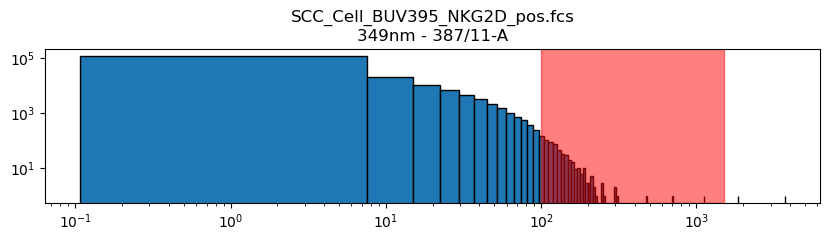

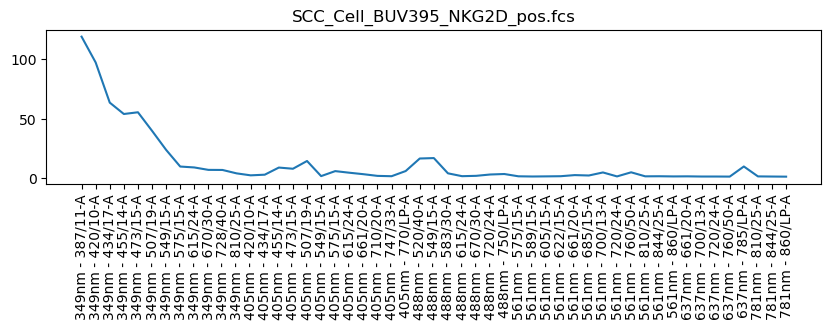

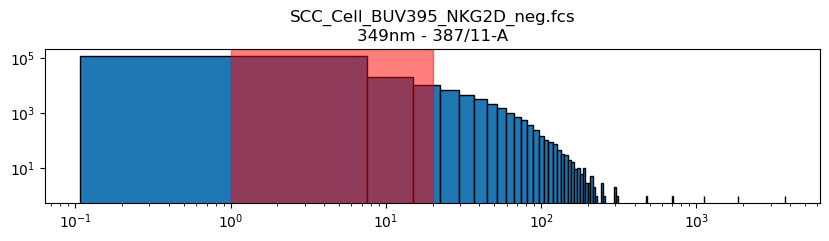

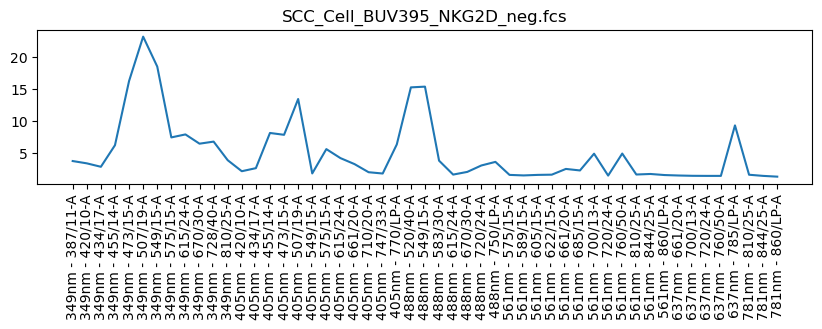

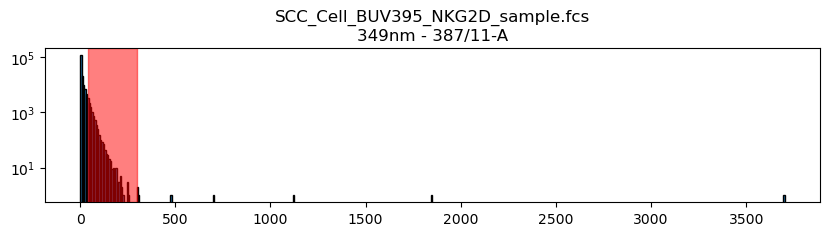

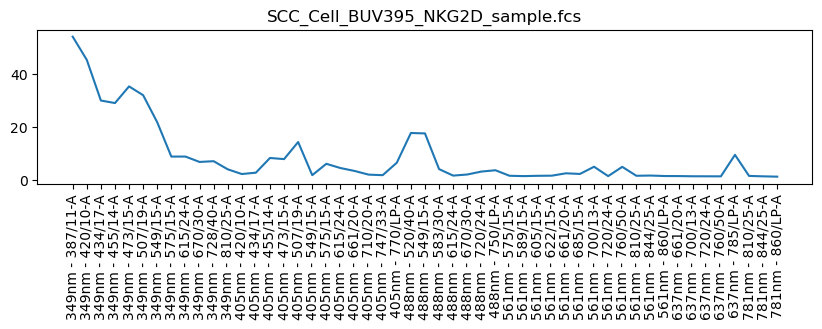

In [74]:
path = Data_dir+"/scc_cells/SCC_Cell_NKG2D Run 1 20241112110105.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 387/11-A'

min = 100
max = 1500
filename = 'SCC_Cell_BUV395_NKG2D_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BUV395_NKG2D_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 40
max = 300
filename = 'SCC_Cell_BUV395_NKG2D_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

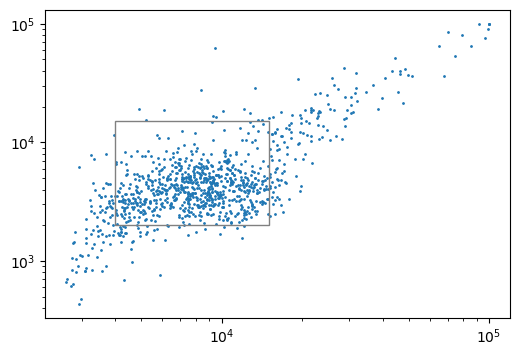

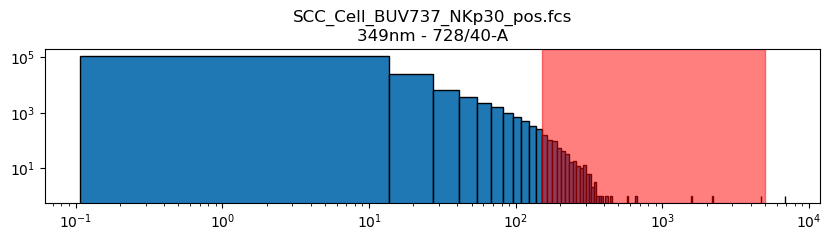

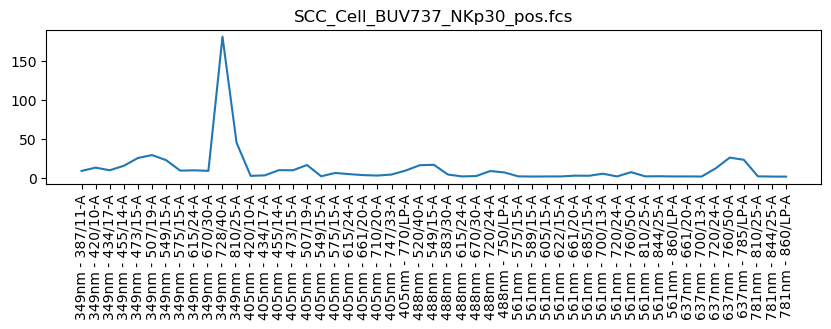

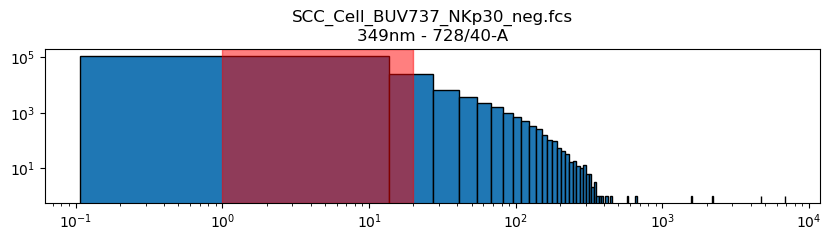

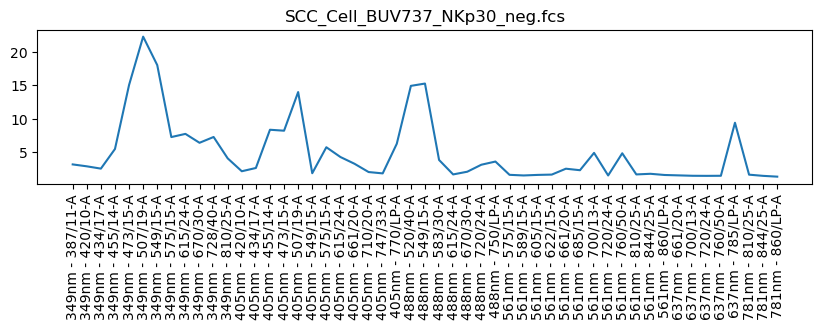

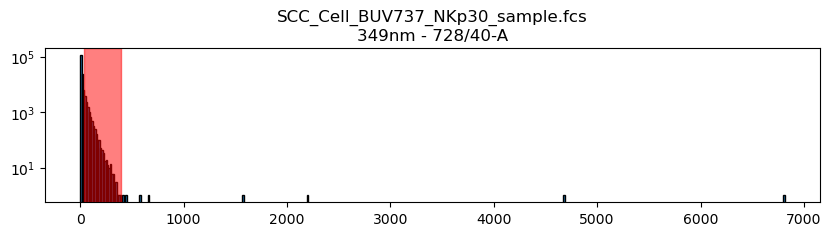

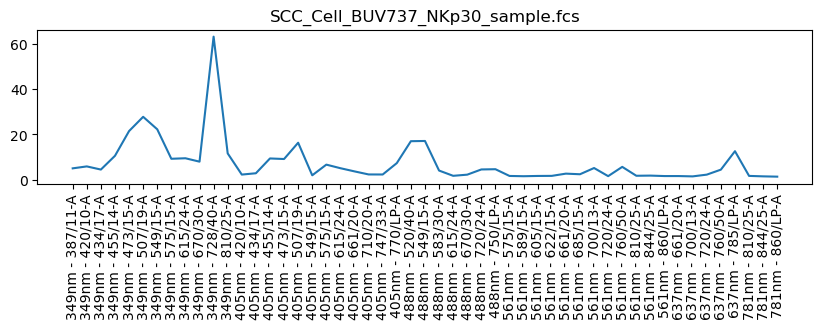

In [75]:
path = Data_dir+"/scc_cells/SCC_Cell_NKp30 Run 1 20241112115457.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '349nm - 728/40-A'

min = 150
max = 5000
filename = 'SCC_Cell_BUV737_NKp30_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BUV737_NKp30_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 40
max = 400
filename = 'SCC_Cell_BUV737_NKp30_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

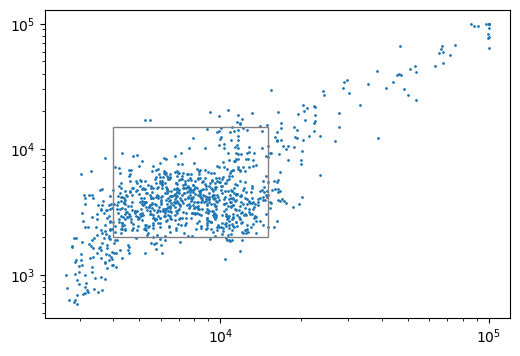

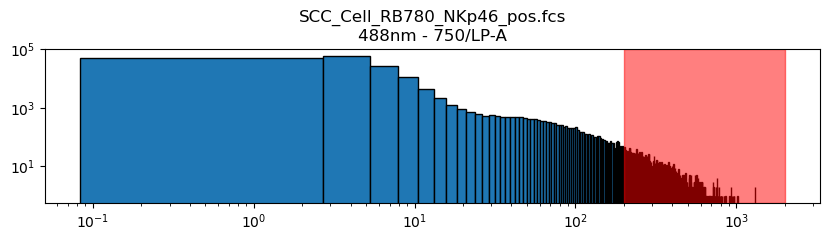

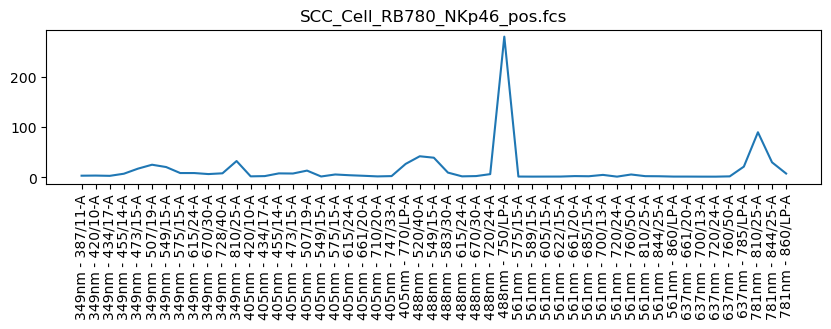

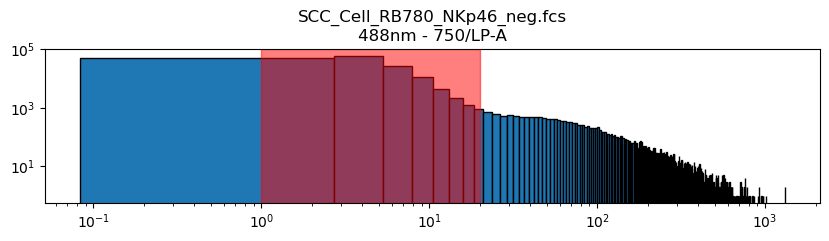

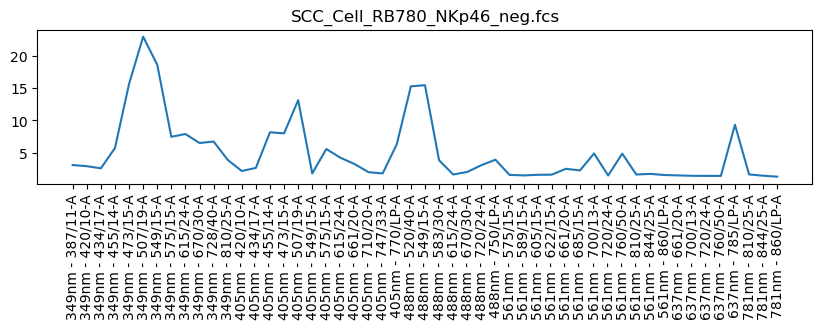

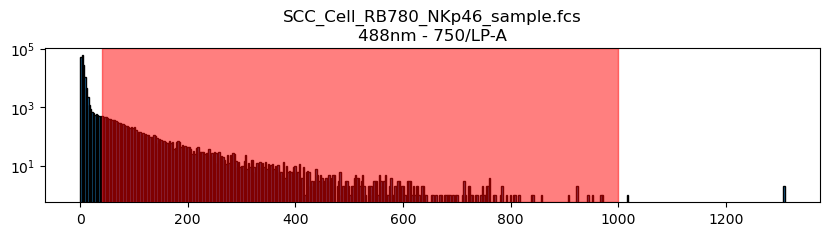

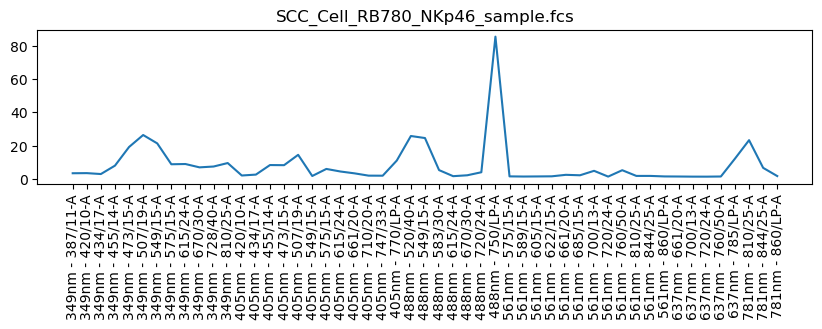

In [76]:
path = Data_dir+"/scc_cells/SCC_Cell_NKp46 Run 1 20241112120134.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 750/LP-A'

min = 200
max = 2000
filename = 'SCC_Cell_RB780_NKp46_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_RB780_NKp46_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 40
max = 1000
filename = 'SCC_Cell_RB780_NKp46_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

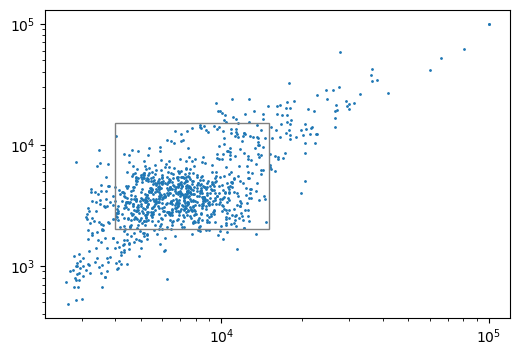

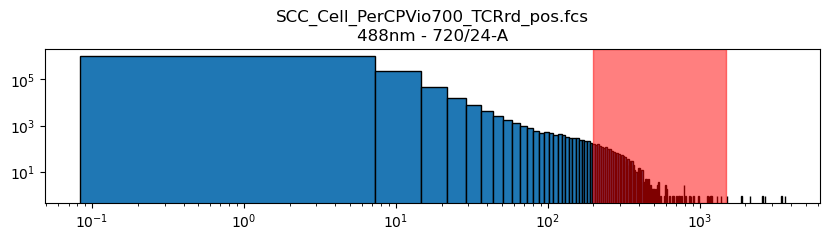

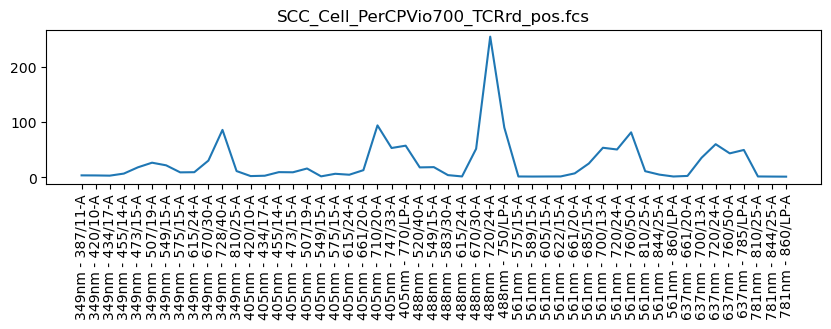

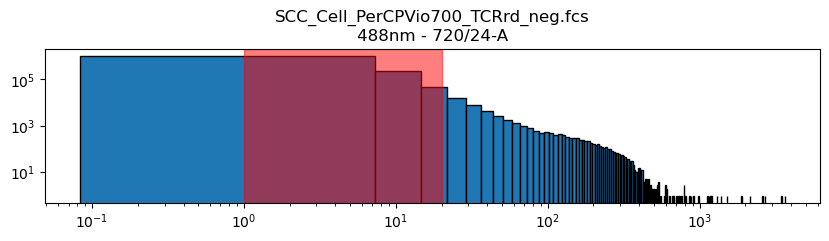

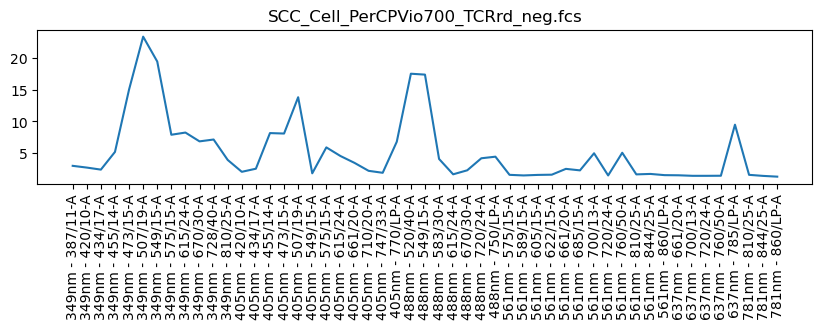

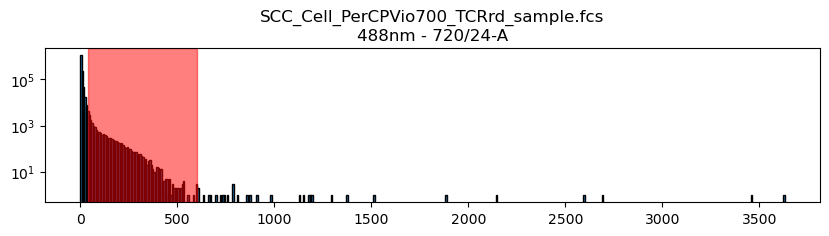

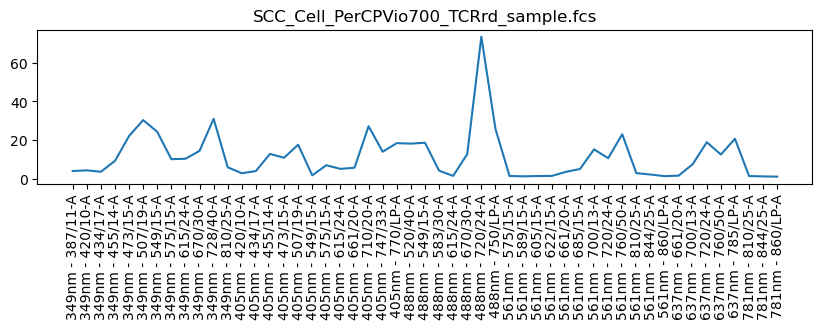

In [79]:
path = Data_dir+"/scc_cells/SCC_Cell_TCRrd Run 1 20241112131601.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '488nm - 720/24-A'

min = 200
max = 1500
filename = 'SCC_Cell_PerCPVio700_TCRrd_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PerCPVio700_TCRrd_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 40
max = 600
filename = 'SCC_Cell_PerCPVio700_TCRrd_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

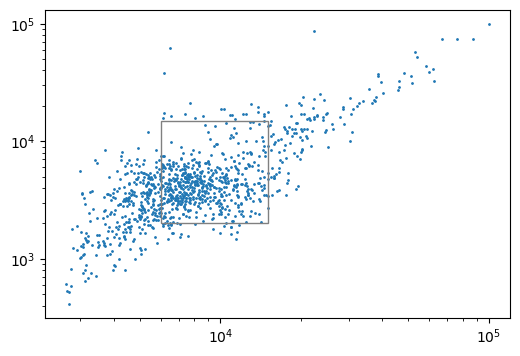

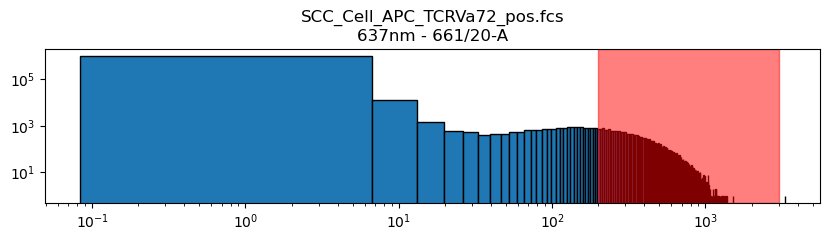

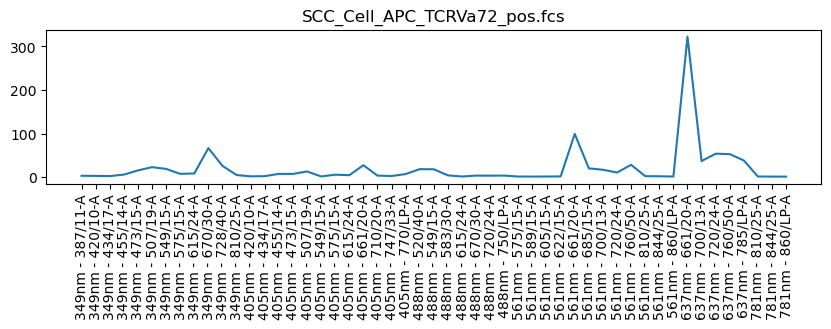

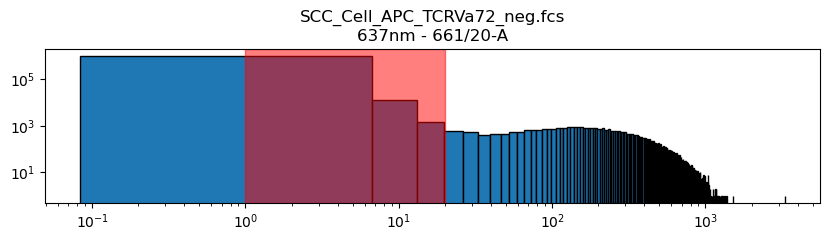

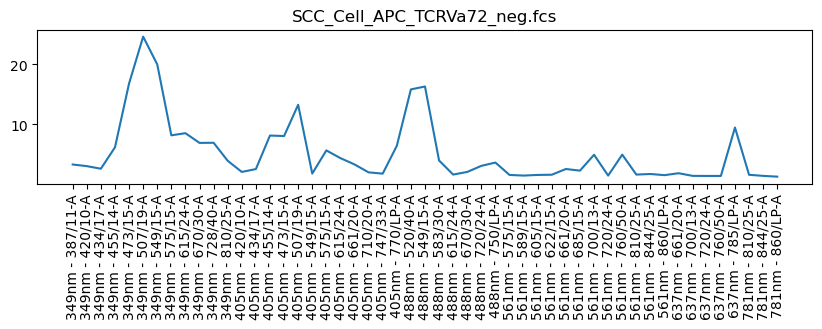

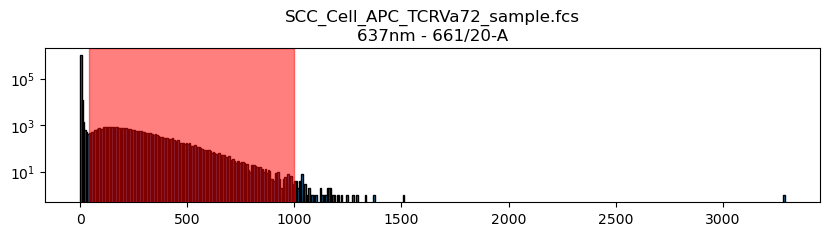

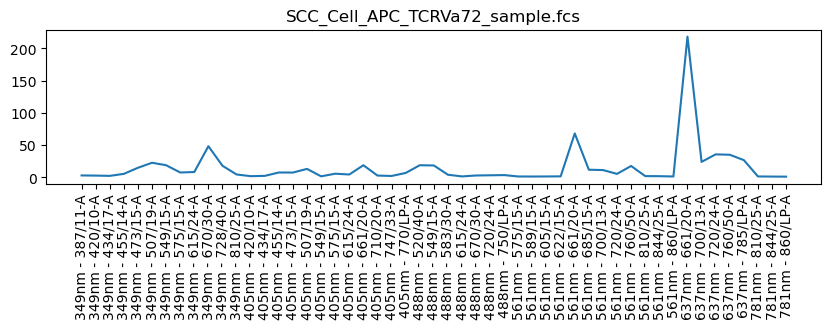

In [80]:
path = Data_dir+"/scc_cells/SCC_Cell_TCRVa7.2 Run 1 20241112130355.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '637nm - 661/20-A'

min = 200
max = 3000
filename = 'SCC_Cell_APC_TCRVa72_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_APC_TCRVa72_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 40
max = 1000
filename = 'SCC_Cell_APC_TCRVa72_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

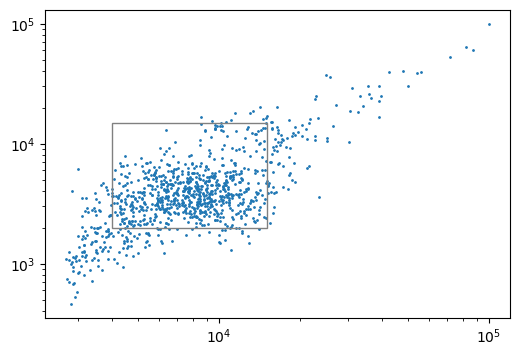

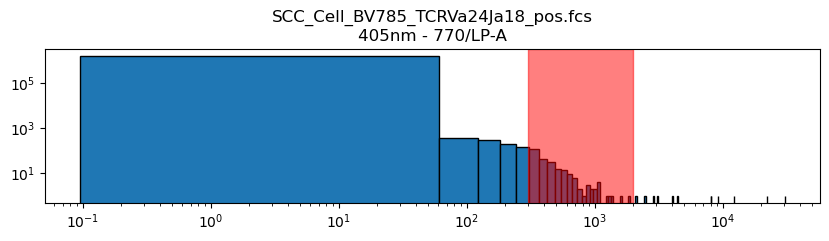

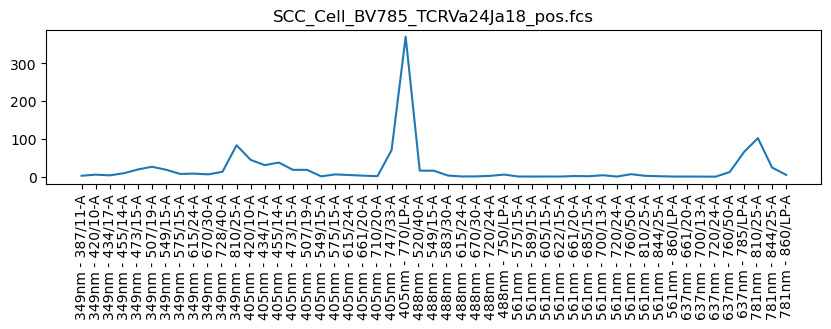

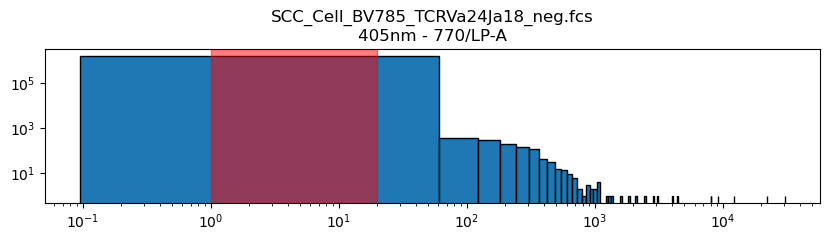

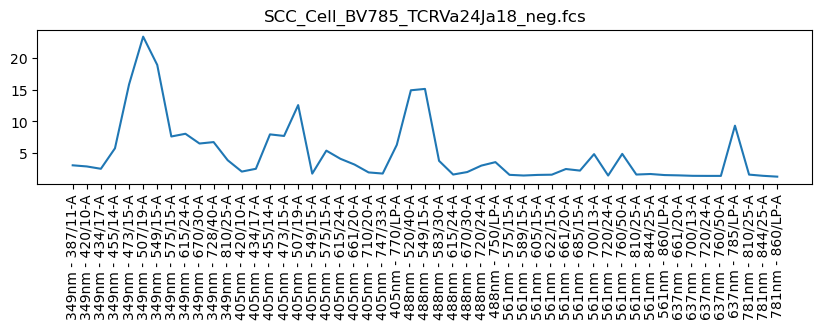

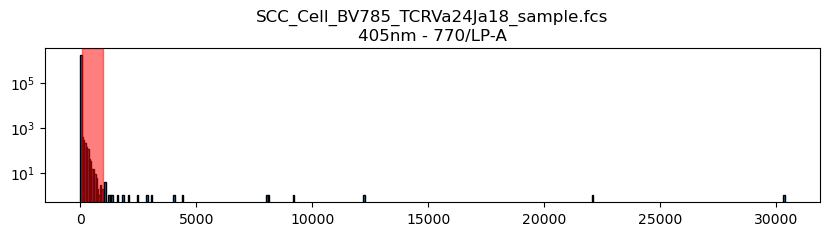

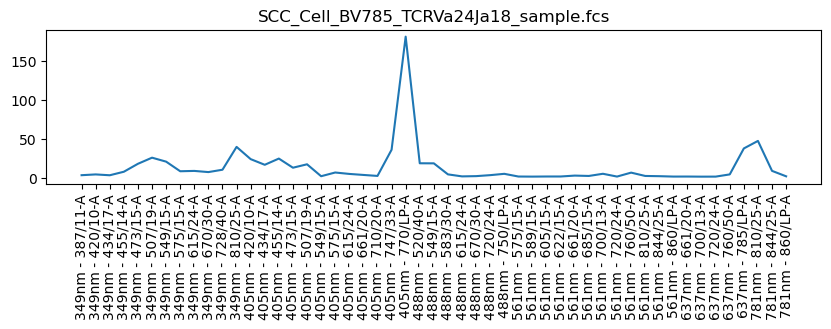

In [81]:
path = Data_dir+"/scc_cells/SCC_Cell_TCRVa24Ja18 Run 1 20241112122655.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=4000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '405nm - 770/LP-A'

min = 300
max = 2000
filename = 'SCC_Cell_BV785_TCRVa24Ja18_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_BV785_TCRVa24Ja18_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")

min = 70
max = 1000
filename = 'SCC_Cell_BV785_TCRVa24Ja18_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

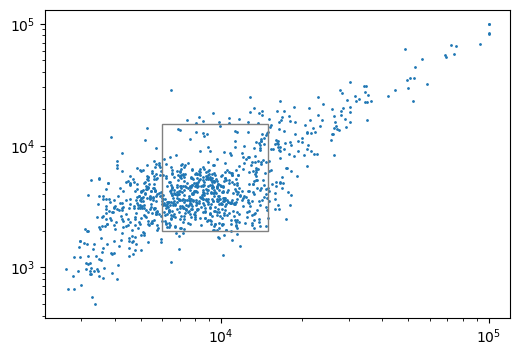

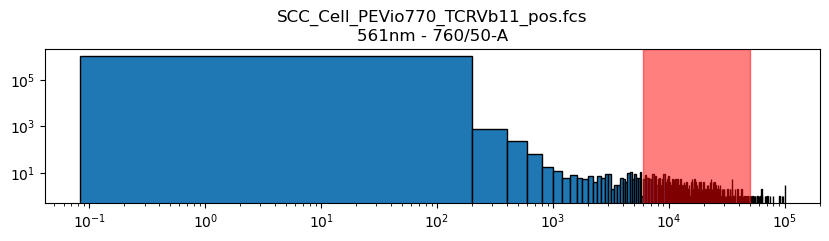

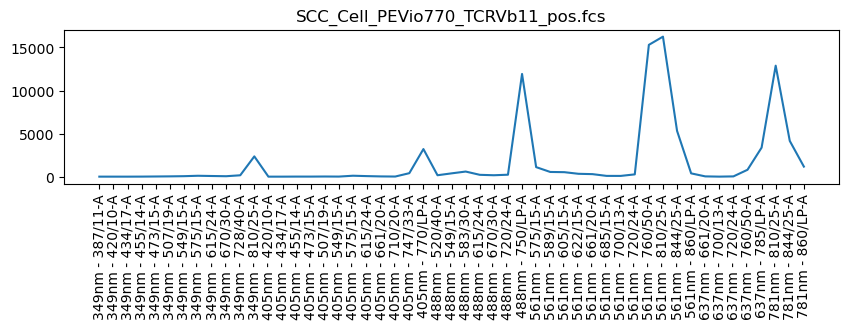

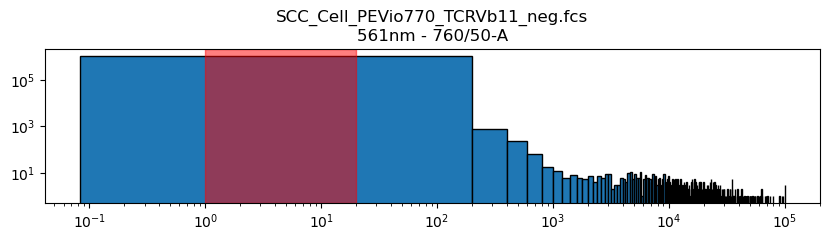

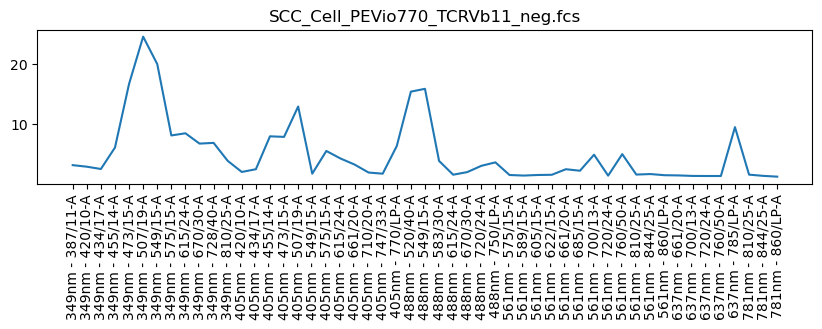

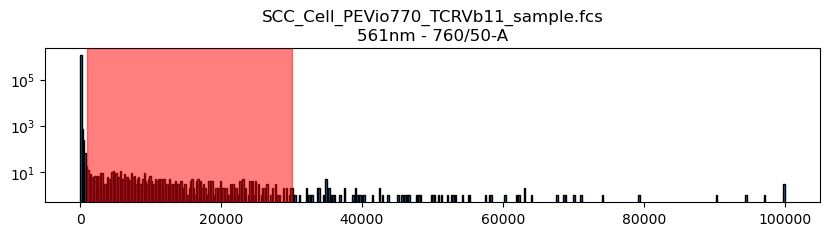

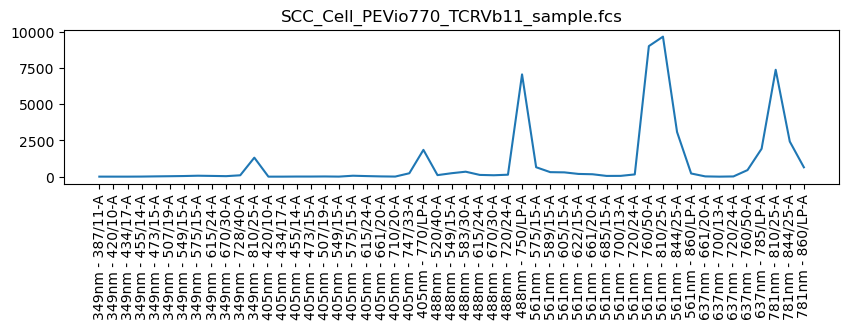

In [82]:
path = Data_dir+"/scc_cells/SCC_Cell_TCRVb11 Run 1 20241112125011.fcs"
meta, data = fcsparser.parse(path, reformat_meta=True)
data = gating(data,
              x_chan="488 FSC-A",y_chan="488 SSC-A",
              x_min=6000,x_max=15000,
              y_min=2000,y_max=15000,
              x_scale=True,y_scale=True)

peak_channel = '561nm - 760/50-A'

min = 6000
max = 50000
filename = 'SCC_Cell_PEVio770_TCRVb11_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 20
filename = 'SCC_Cell_PEVio770_TCRVb11_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1000
max = 30000
filename = 'SCC_Cell_PEVio770_TCRVb11_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")

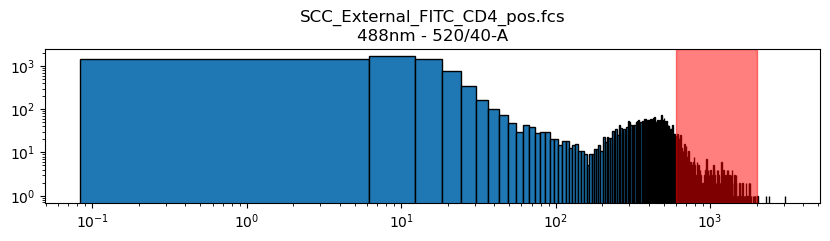

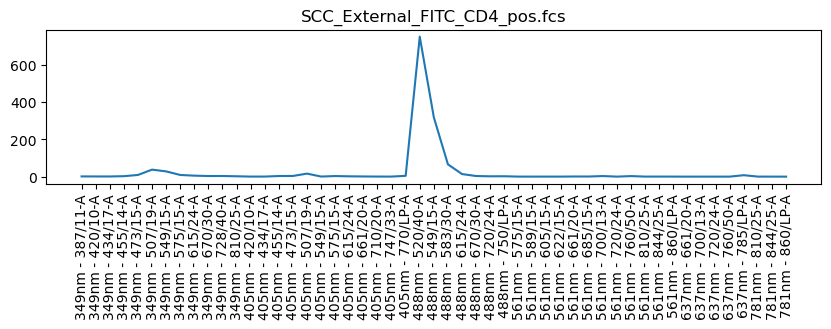

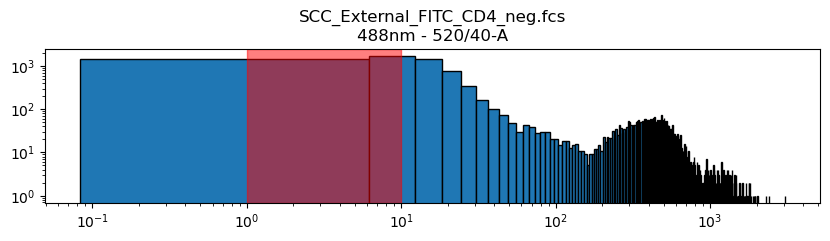

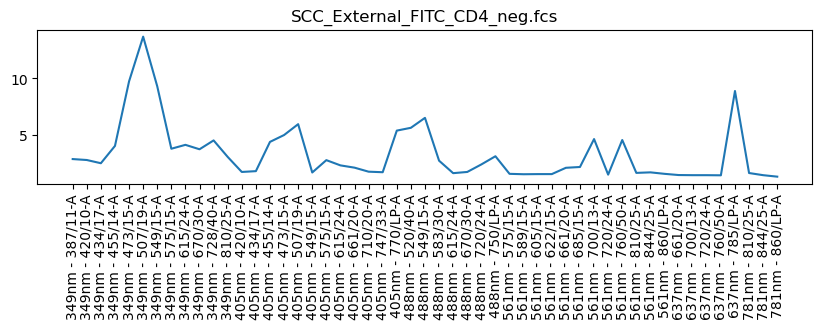

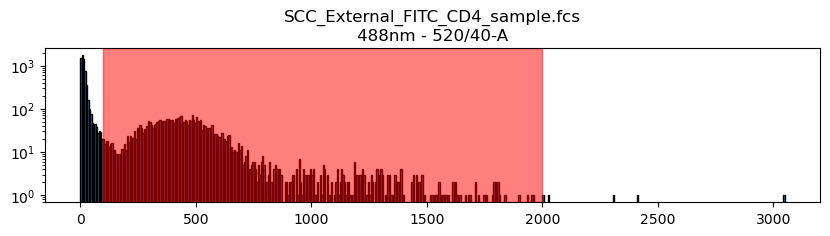

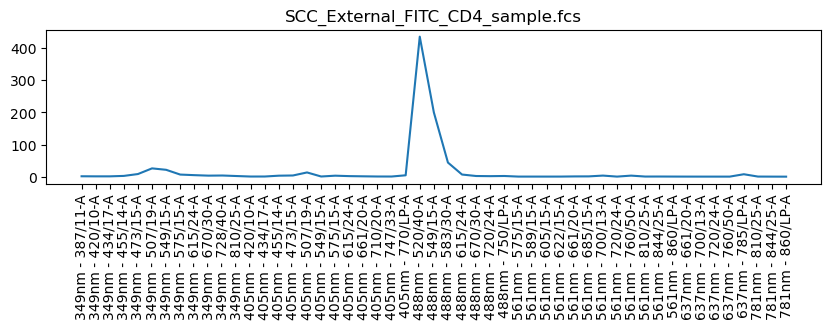

In [59]:
path = Data_dir+"/scc_external/FITC.fcs" #CD2
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '488nm - 520/40-A'

min = 600
max = 2000
filename = 'SCC_External_FITC_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_FITC_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_External_FITC_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




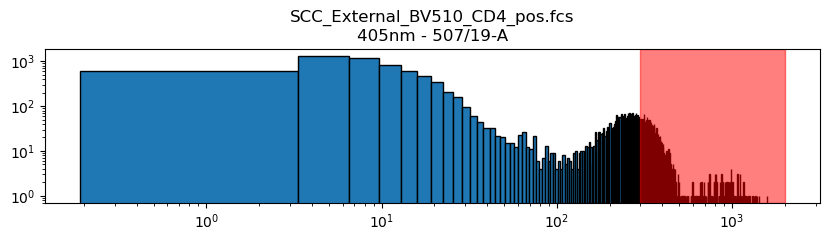

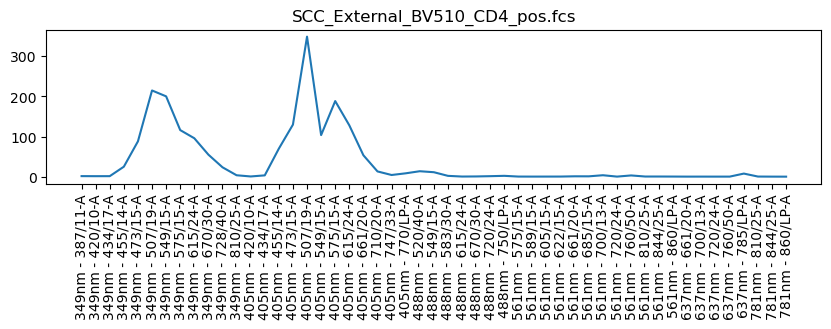

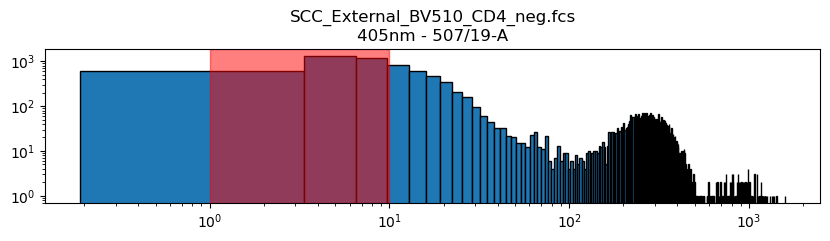

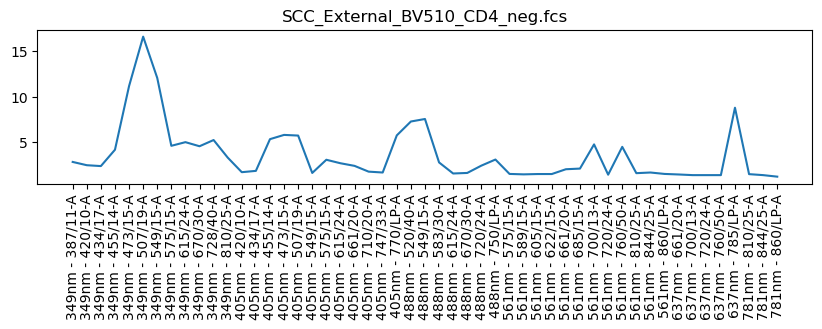

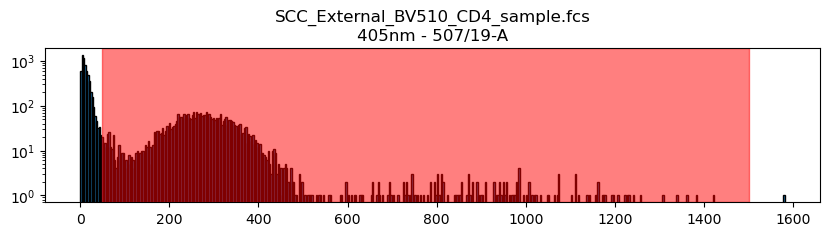

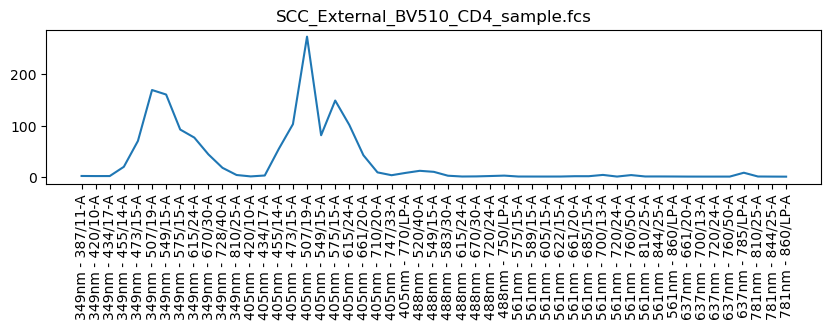

In [60]:
path = Data_dir+"/scc_external/BV510.fcs" #CD3
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '405nm - 507/19-A'

min = 300
max = 2000
filename = 'SCC_External_BV510_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BV510_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 50
max = 1500
filename = 'SCC_External_BV510_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




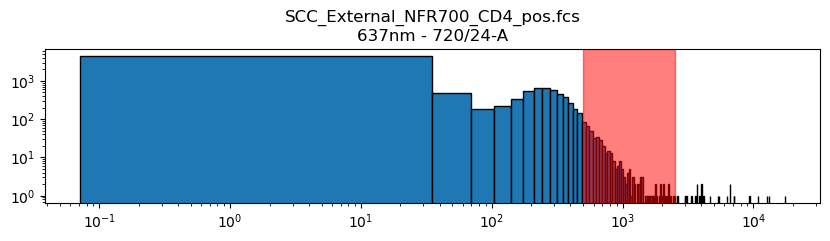

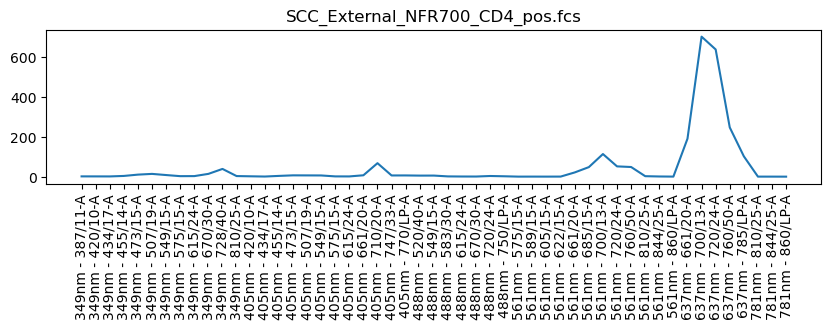

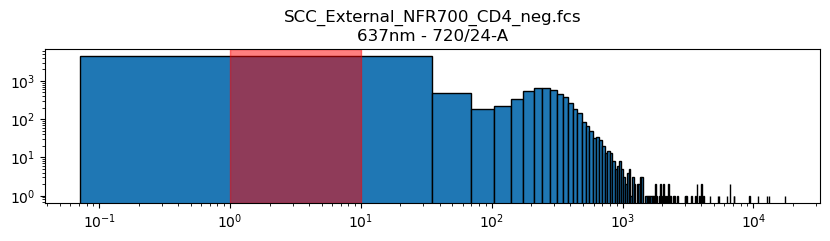

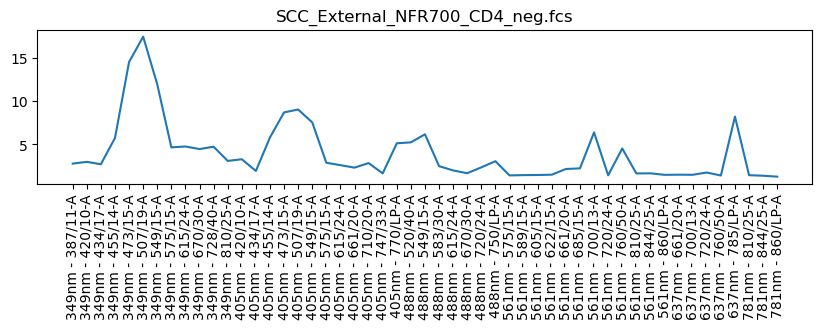

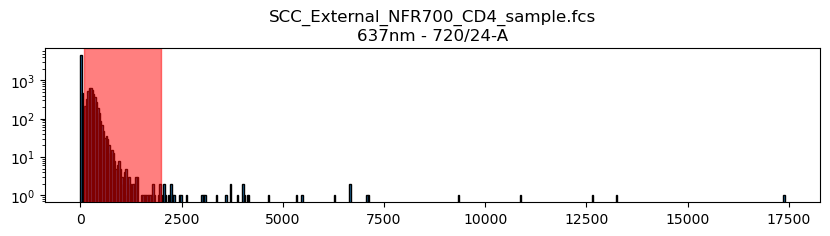

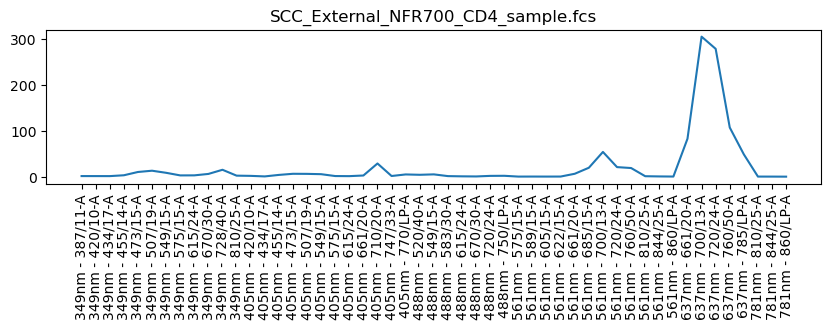

In [61]:
path = Data_dir+"/scc_external/NovaFluorRed700.fcs" #CD4
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '637nm - 720/24-A'

min = 500
max = 2500
filename = 'SCC_External_NFR700_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_NFR700_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_External_NFR700_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [62]:
path = Data_dir+"/scc_external/BV570.fcs" #CD8 not fcs



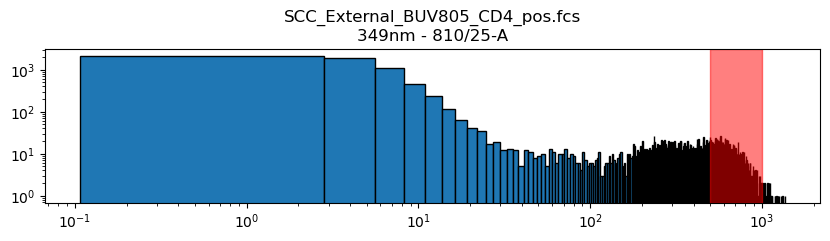

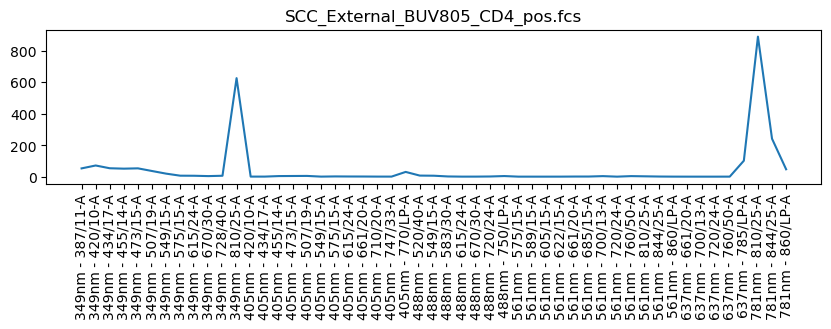

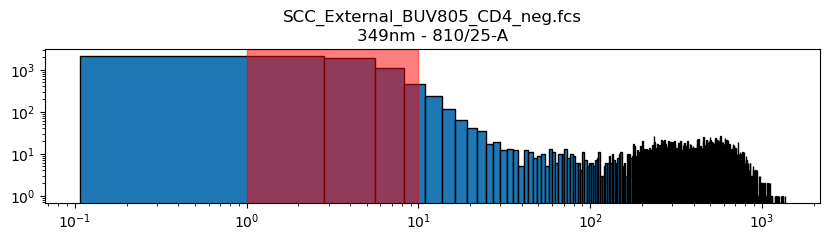

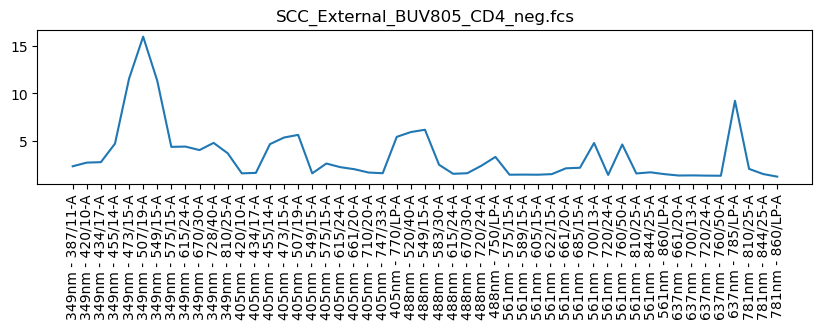

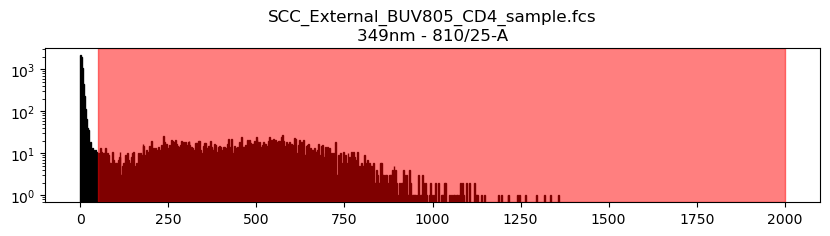

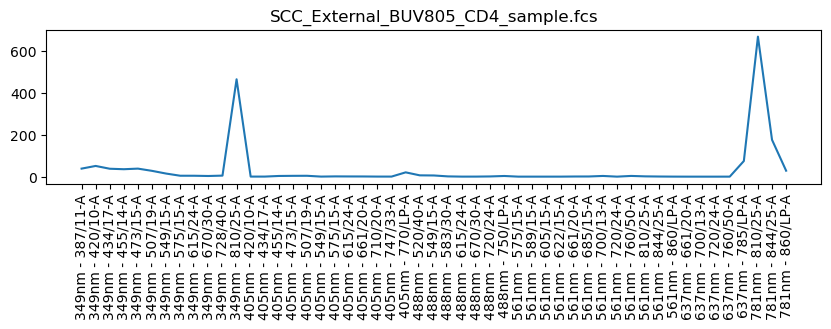

In [63]:
path = Data_dir+"/scc_external/BUV805.fcs" #CD16
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 810/25-A'

min = 500
max = 1000
filename = 'SCC_External_BUV805_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV805_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 50
max = 2000
filename = 'SCC_External_BUV805_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




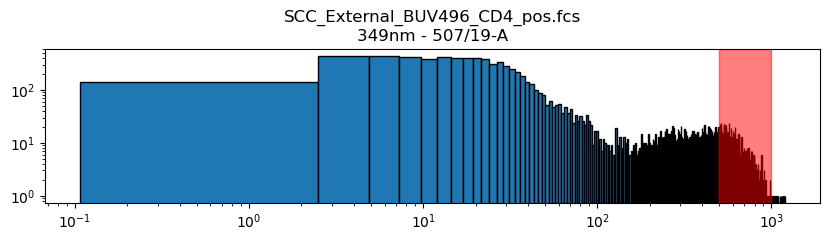

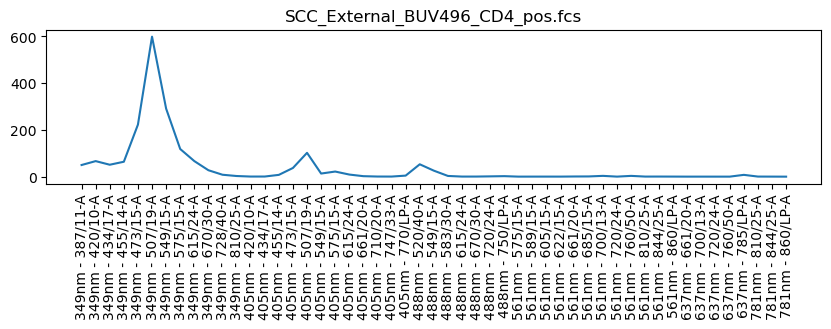

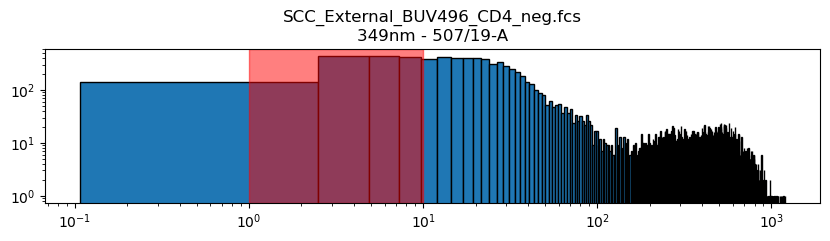

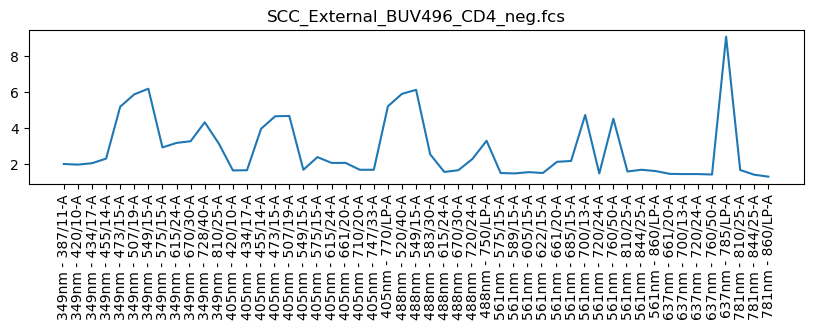

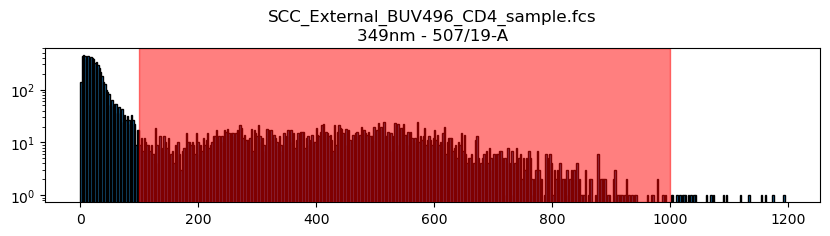

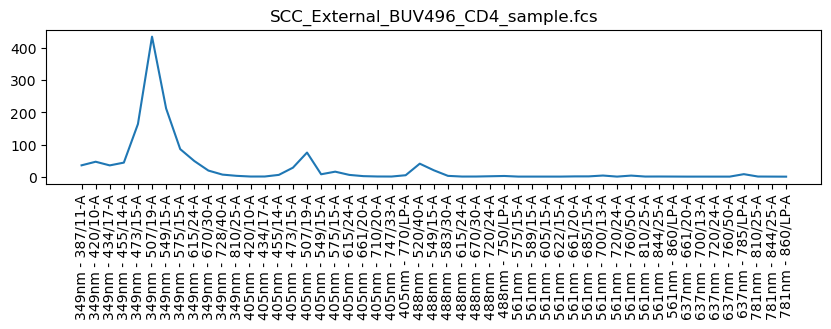

In [64]:
path = Data_dir+"/scc_external/BUV496.fcs" #CD19
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 507/19-A'

min = 500
max = 1000
filename = 'SCC_External_BUV496_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV496_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_External_BUV496_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [65]:
path = Data_dir+"/scc_external/PECy55.fcs" #CD25 no fcs file



In [66]:
path = Data_dir+"/scc_external/APCeFluor780.fcs" #CD34 no fcs file



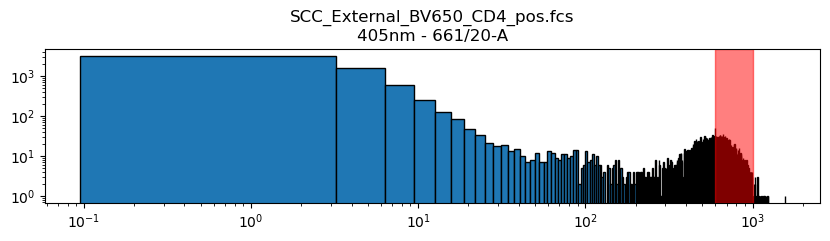

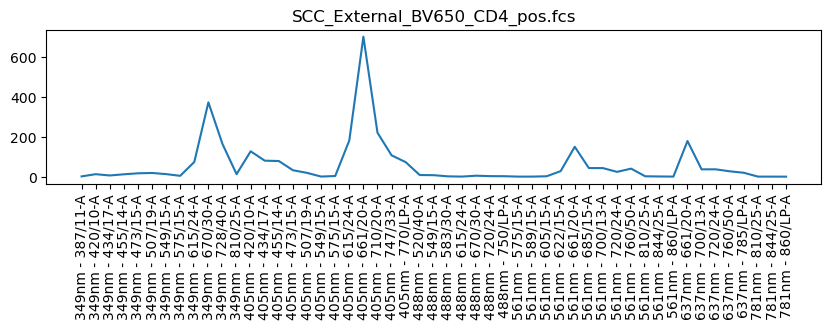

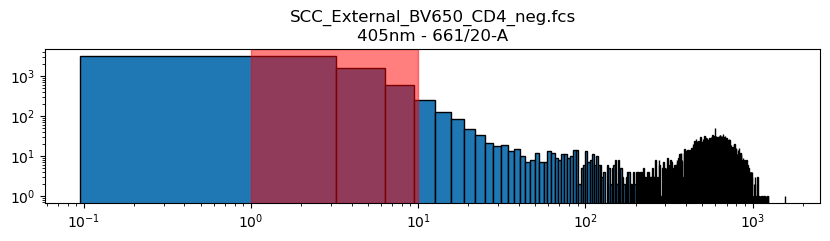

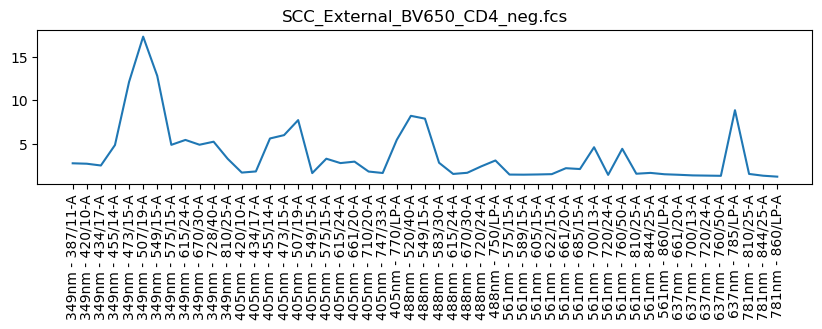

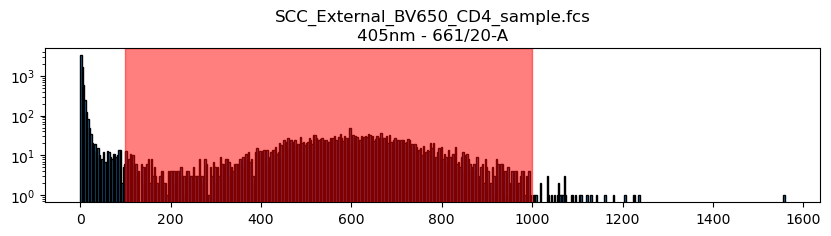

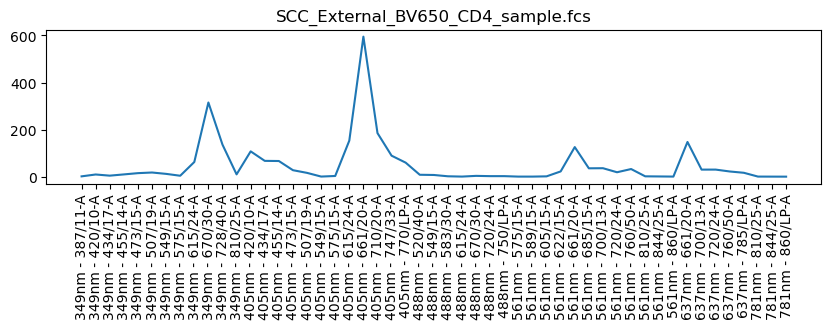

In [67]:
path = Data_dir+"/scc_external/BV650.fcs" #CD38
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '405nm - 661/20-A'

min = 600
max = 1000
filename = 'SCC_External_BV650_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BV650_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_External_BV650_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [68]:
path = Data_dir+"/scc_external/AF532.fcs" #CD45 no fcs file



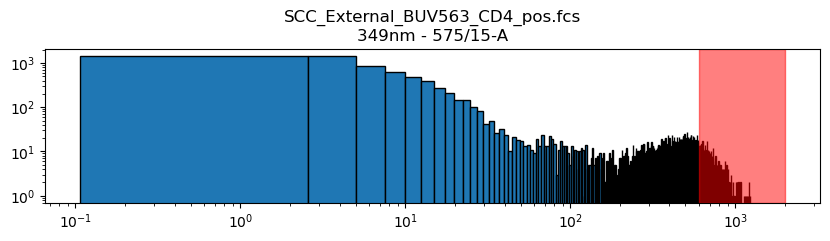

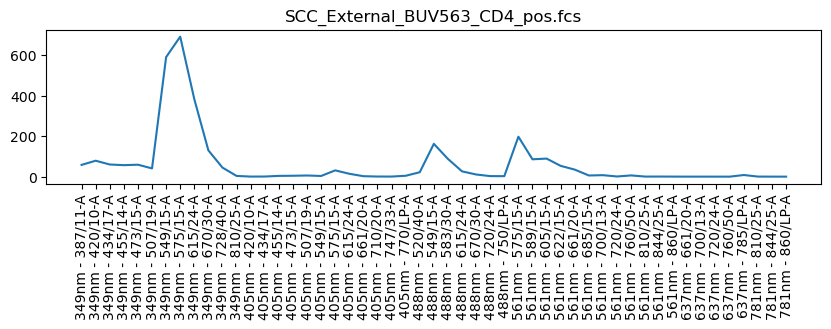

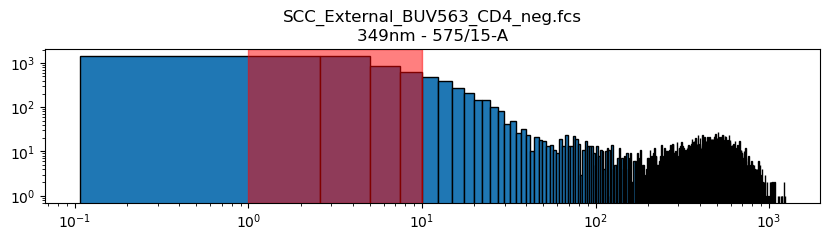

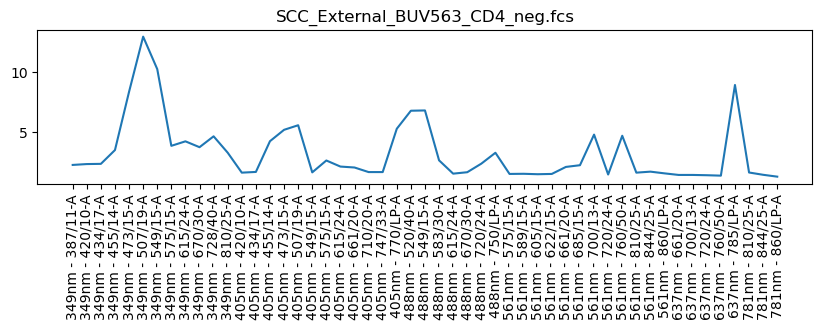

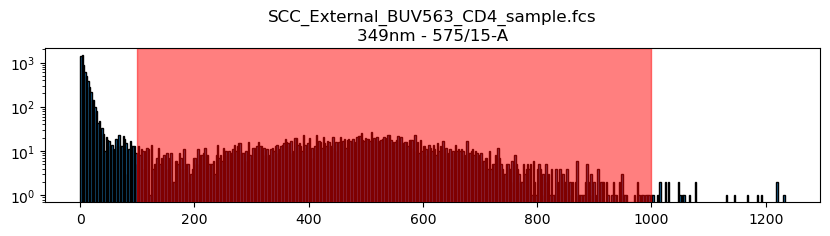

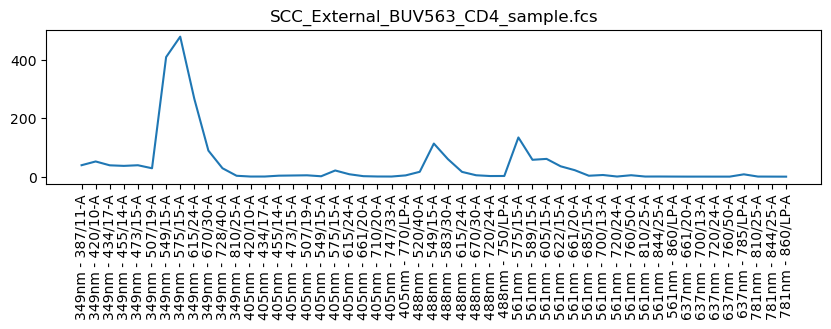

In [69]:
path = Data_dir+"/scc_external/BUV563.fcs" #CD56
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 575/15-A'

min = 600
max = 2000
filename = 'SCC_External_BUV563_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV563_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_External_BUV563_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [70]:
path = Data_dir+"/scc_external/eFluor450.fcs" #CD57 no fcs file




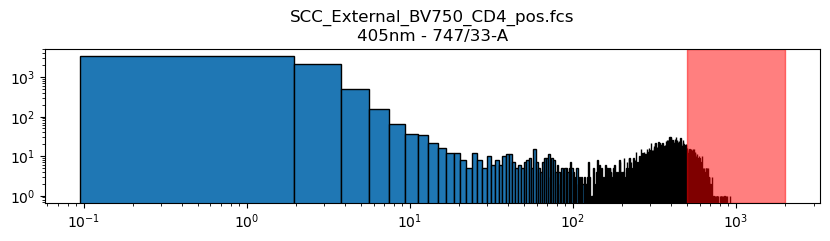

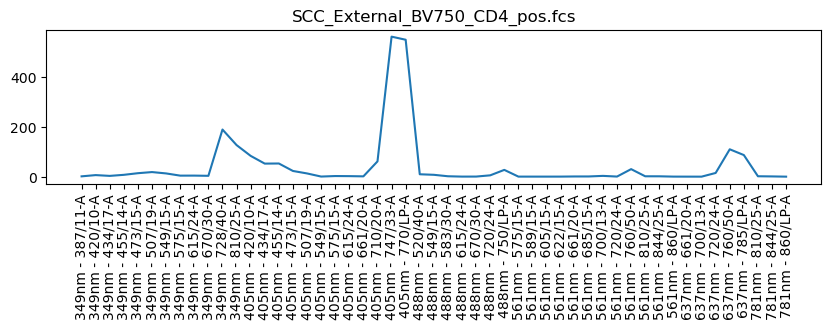

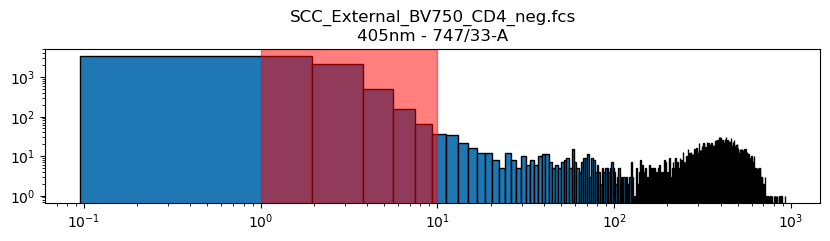

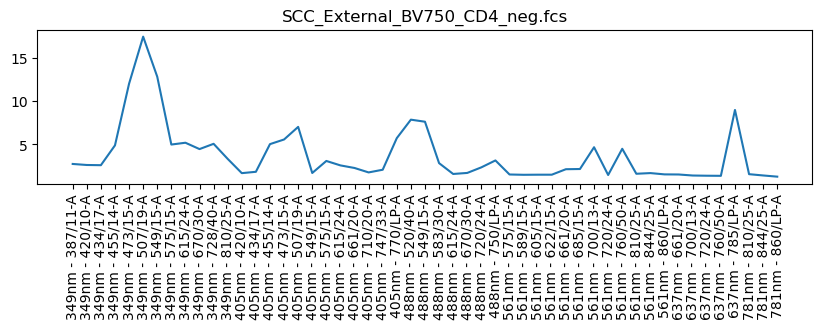

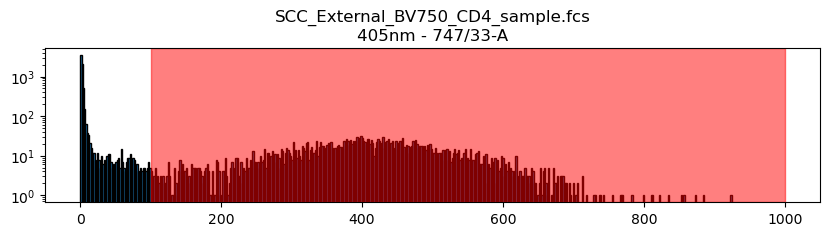

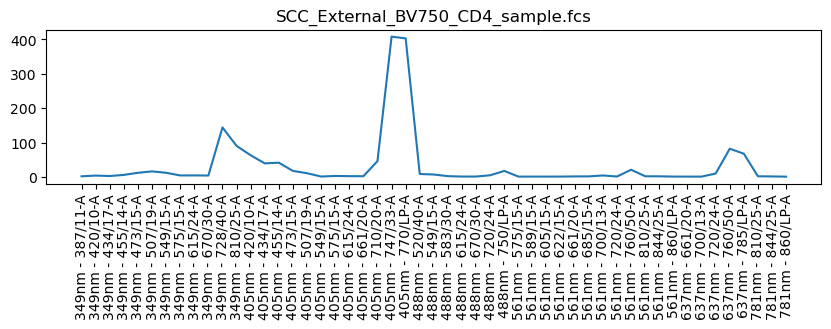

In [71]:
path = Data_dir+"/scc_external/BV750.fcs" #CD69
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '405nm - 747/33-A'

min = 500
max = 2000
filename = 'SCC_External_BV750_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BV750_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1000
filename = 'SCC_External_BV750_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




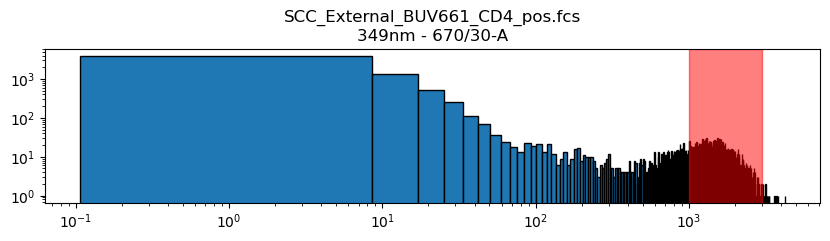

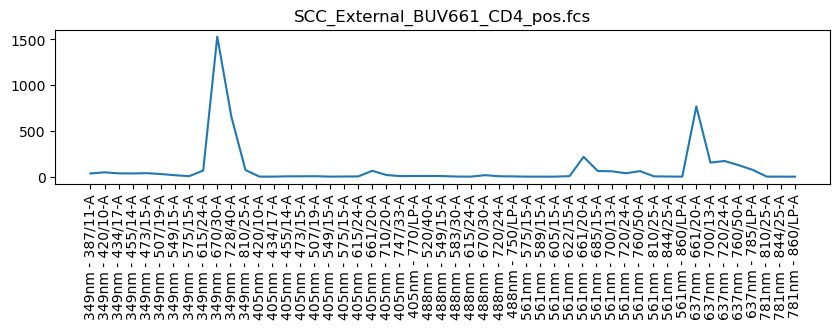

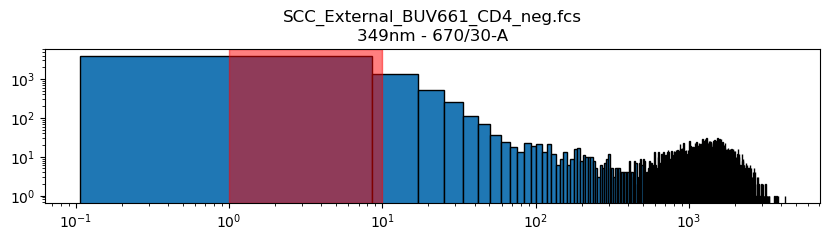

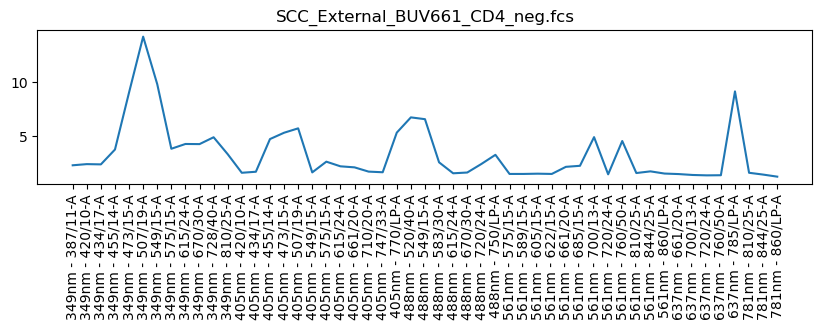

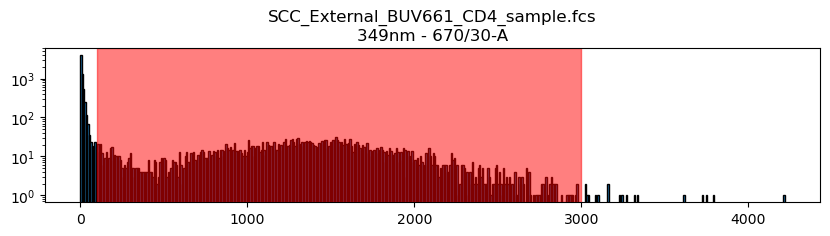

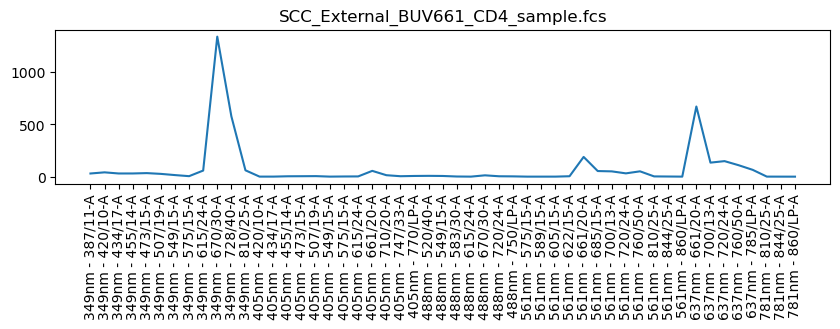

In [72]:
path = Data_dir+"/scc_external/BUV661.fcs" #CD127
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 670/30-A'

min = 1000
max = 3000
filename = 'SCC_External_BUV661_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV661_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 3000
filename = 'SCC_External_BUV661_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




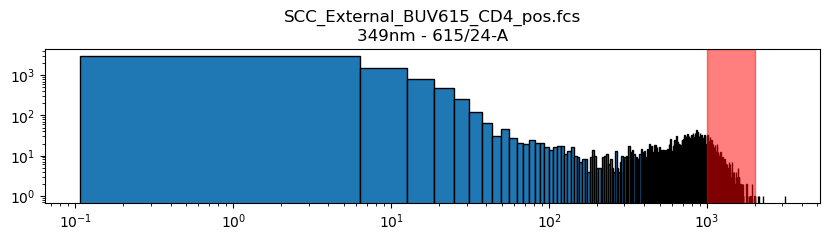

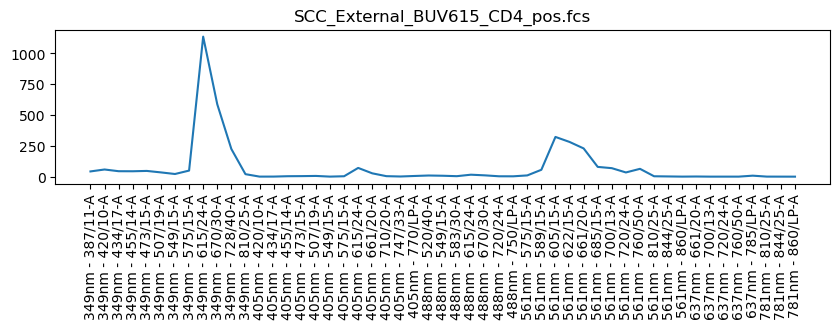

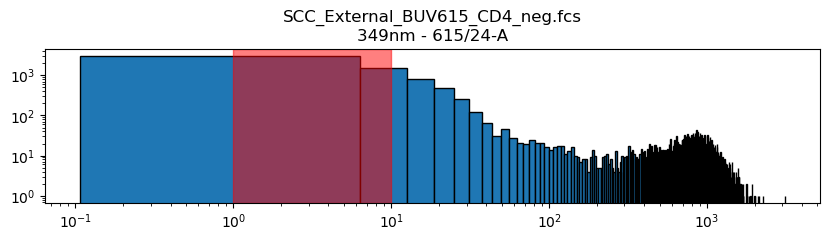

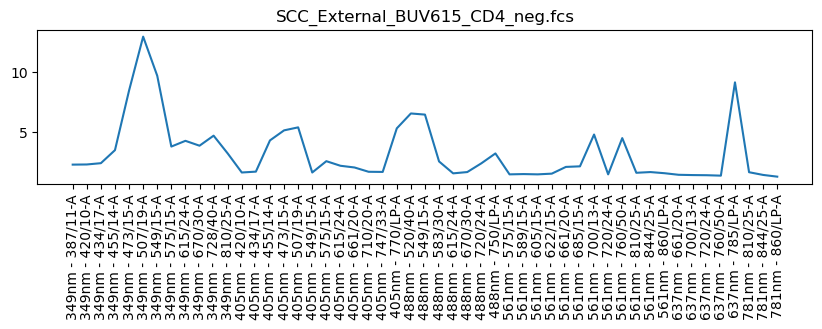

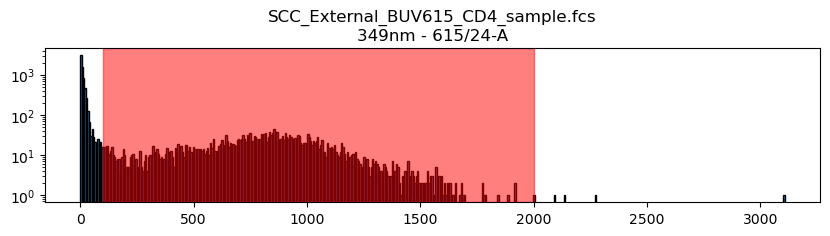

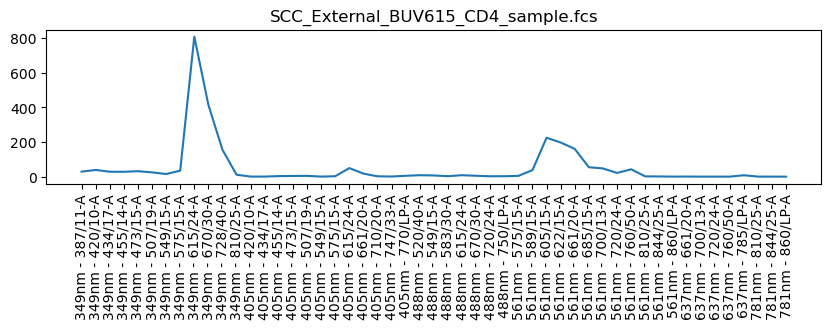

In [73]:
path = Data_dir+"/scc_external/BUV615.fcs" #CD161
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 615/24-A'

min = 1000
max = 2000
filename = 'SCC_External_BUV615_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV615_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_External_BUV615_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [74]:
path = Data_dir+"/scc_external/SB600.fcs" #CD244 no fcs file



In [75]:
path = Data_dir+"/scc_external/SB702.fcs" #cKit no fcs file



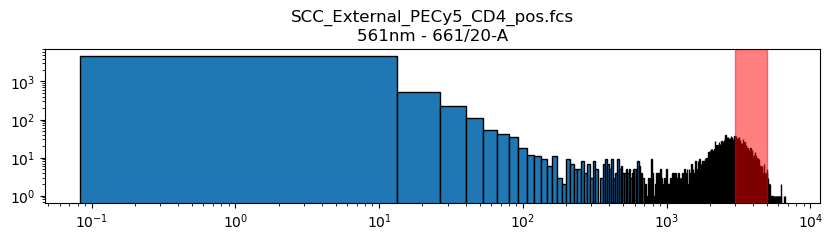

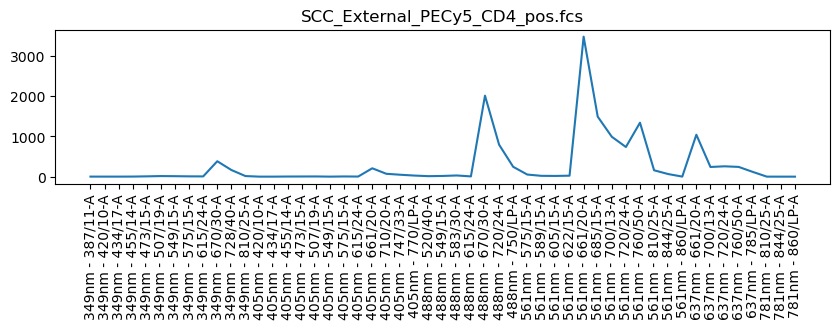

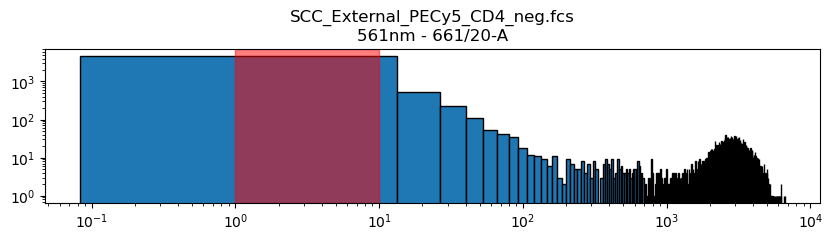

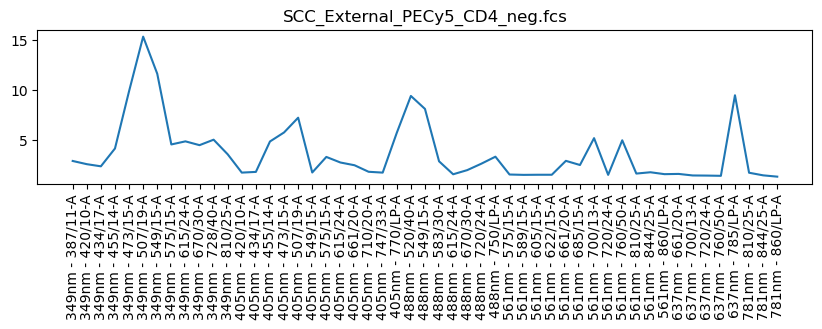

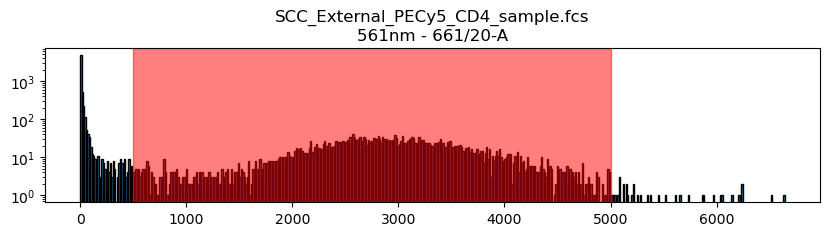

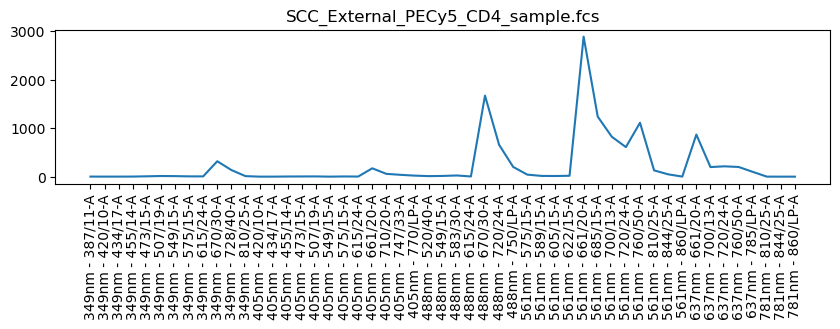

In [76]:
path = Data_dir+"/scc_external/PECy5.fcs" #CRTH2
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '561nm - 661/20-A'

min = 3000
max = 5000
filename = 'SCC_External_PECy5_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_PECy5_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 500
max = 5000
filename = 'SCC_External_PECy5_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




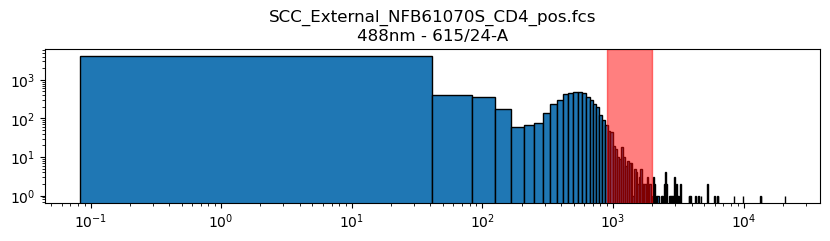

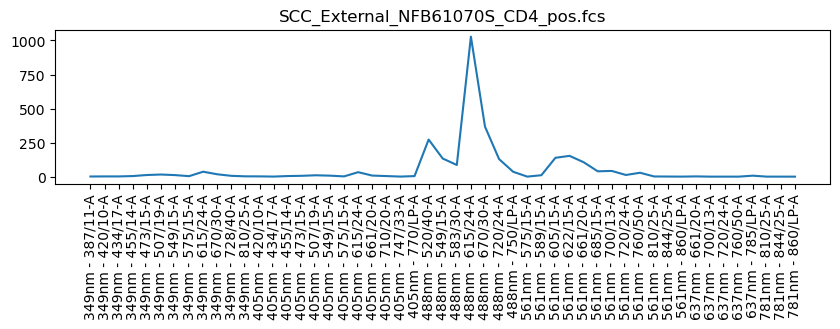

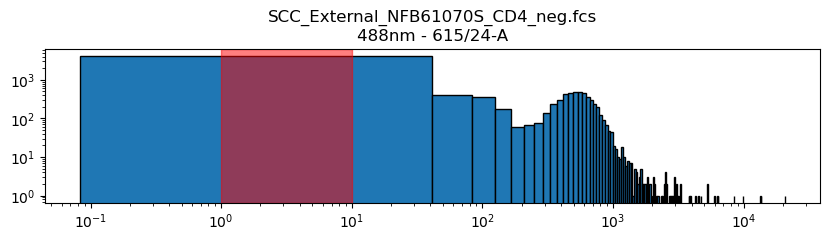

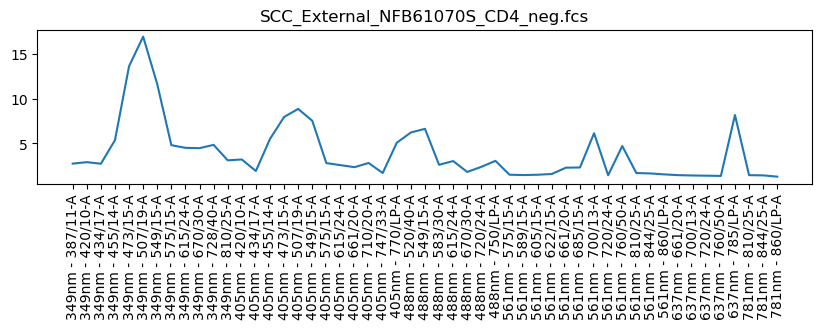

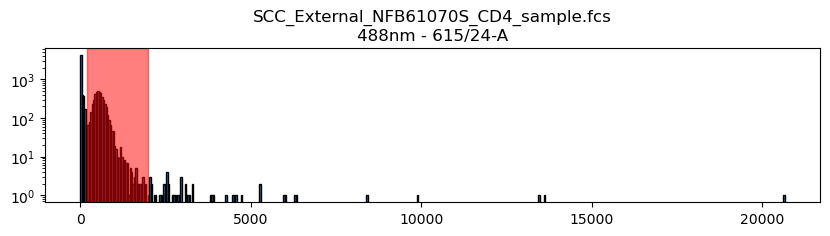

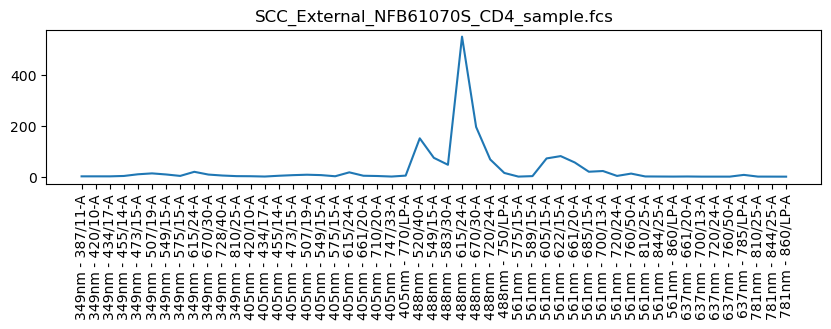

In [77]:
path = Data_dir+"/scc_external/NovaFlourBlue61070S.fcs" #HLADR
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '488nm - 615/24-A'

min = 900
max = 2000
filename = 'SCC_External_NFB61070S_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_NFB61070S_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 200
max = 2000
filename = 'SCC_External_NFB61070S_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




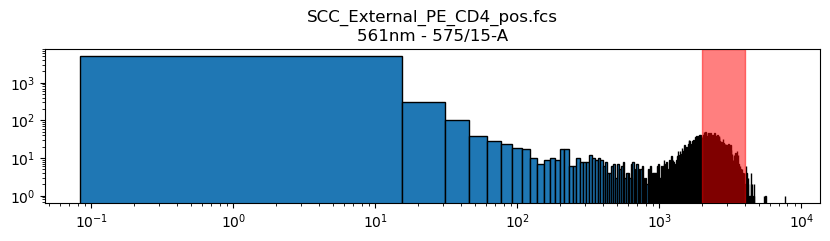

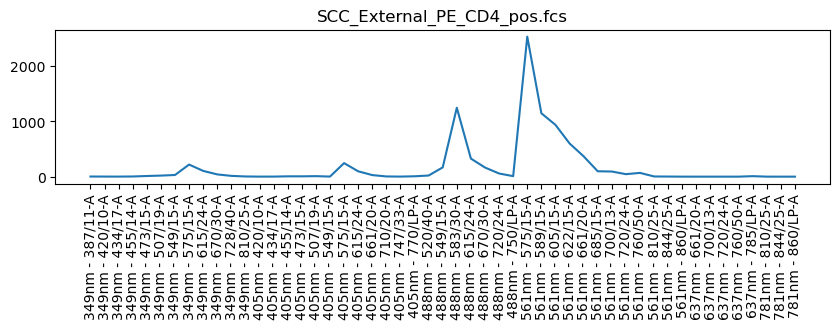

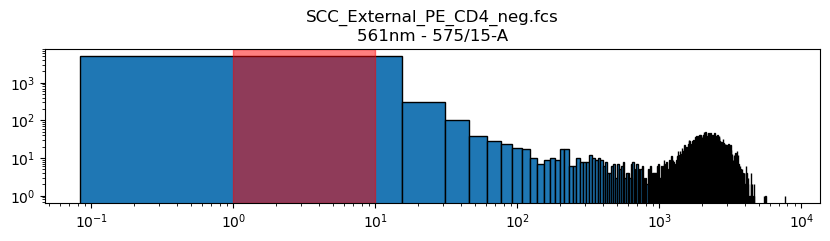

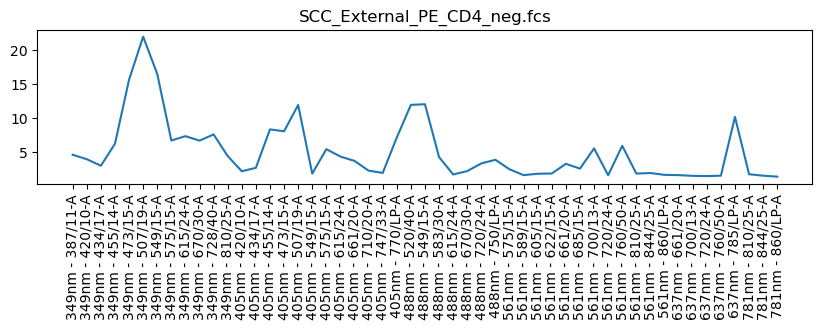

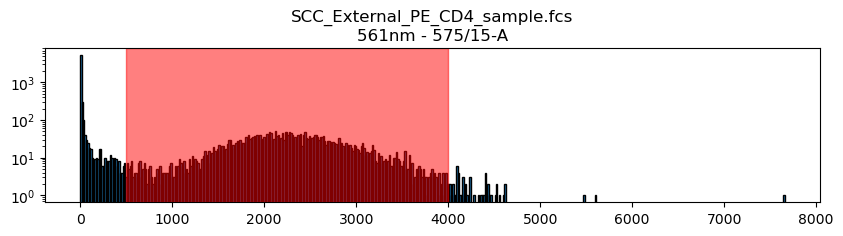

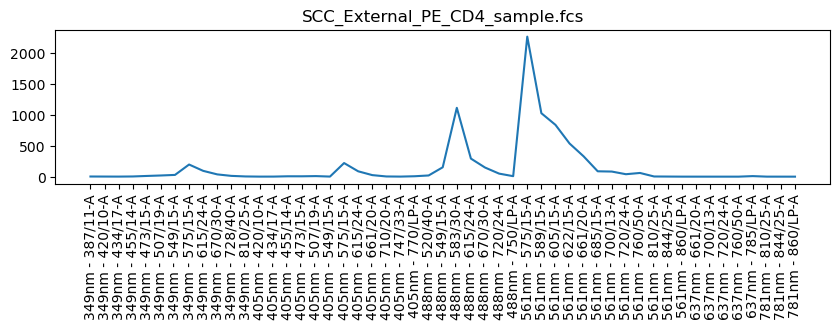

In [78]:
path = Data_dir+"/scc_external/PE.fcs" #KIRDL1
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '561nm - 575/15-A'

min = 2000
max = 4000
filename = 'SCC_External_PE_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_PE_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 500
max = 4000
filename = 'SCC_External_PE_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




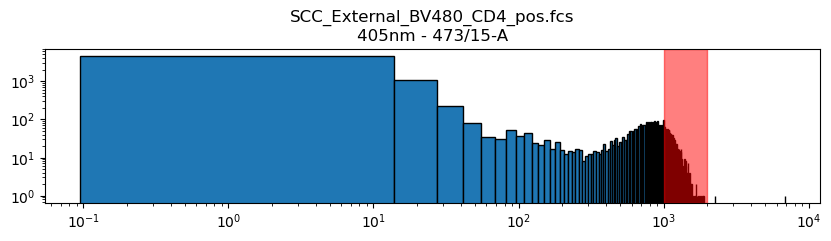

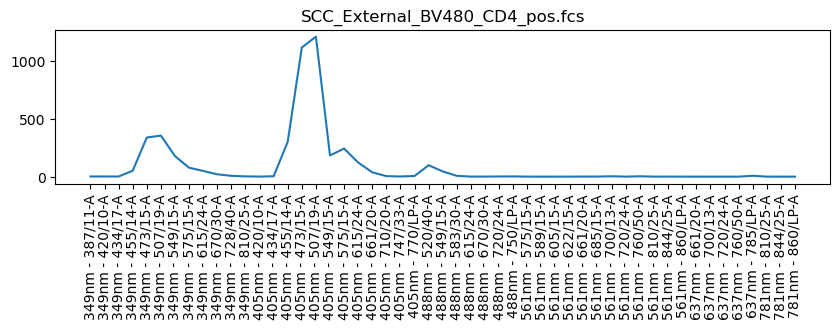

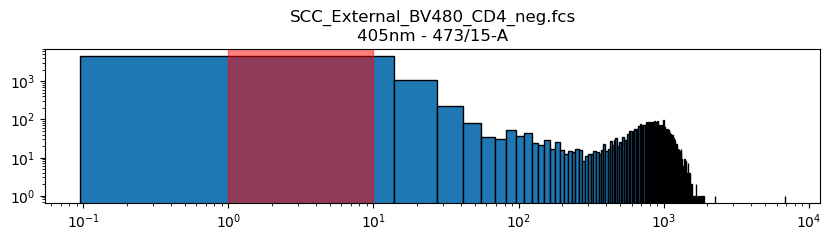

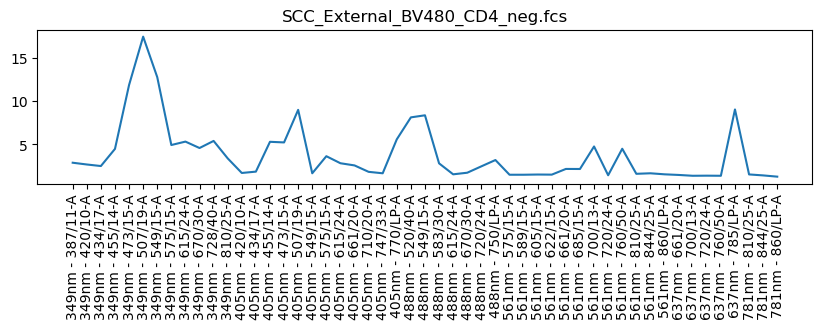

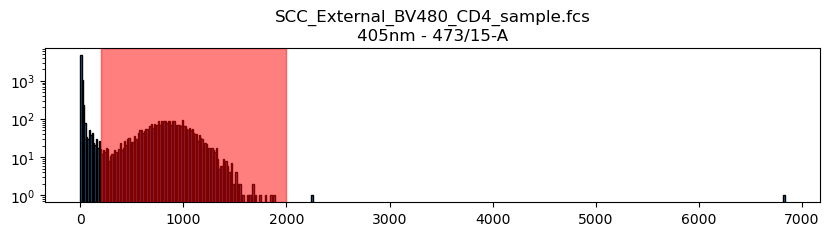

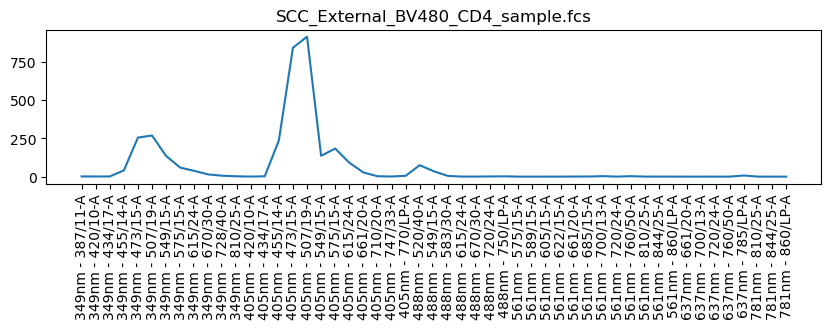

In [79]:
path = Data_dir+"/scc_external/BV480.fcs" #KLRG1
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '405nm - 473/15-A'

min = 1000
max = 2000
filename = 'SCC_External_BV480_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BV480_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 200
max = 2000
filename = 'SCC_External_BV480_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [80]:
path = Data_dir+"/scc_external/PEDazzle594.fcs" #NKG2A no fcs file




In [81]:
path = Data_dir+"/scc_external/BV421.fcs" #NKG2C no fcs file


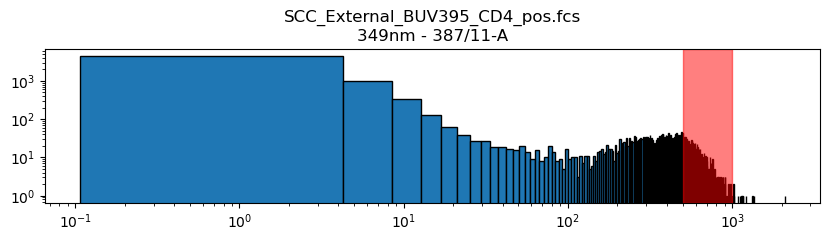

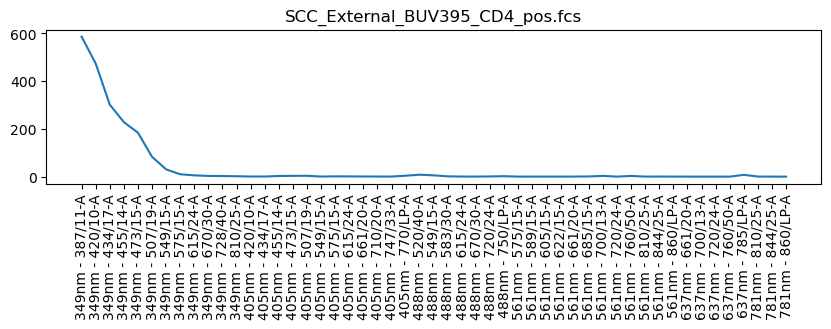

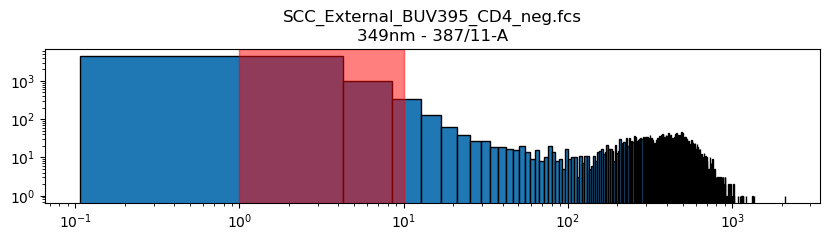

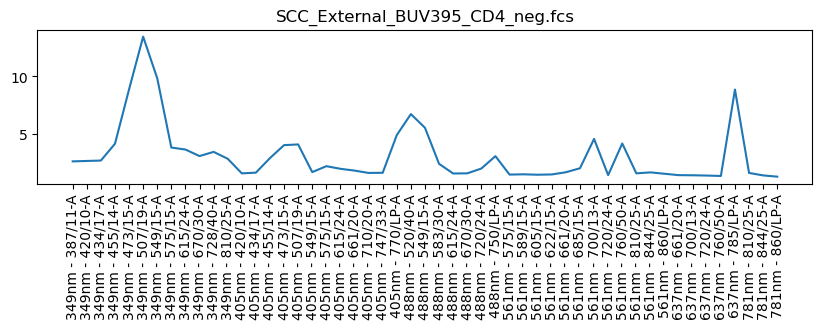

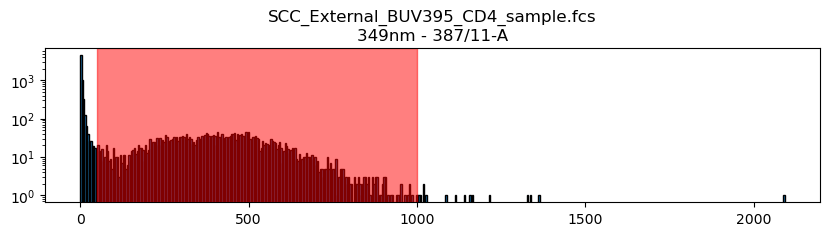

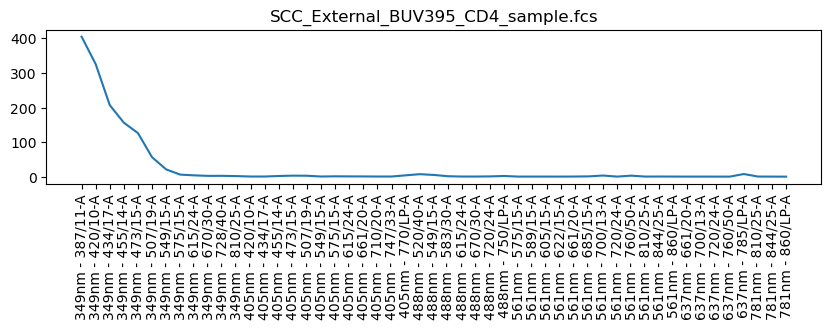

In [82]:
path = Data_dir+"/scc_external/BUV395.fcs" #NKG2D
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 387/11-A'

min = 500
max = 1000
filename = 'SCC_External_BUV395_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV395_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 50
max = 1000
filename = 'SCC_External_BUV395_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




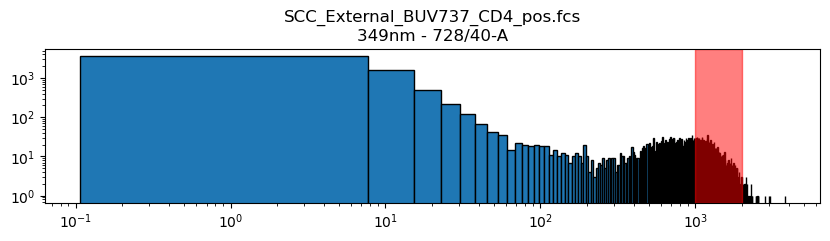

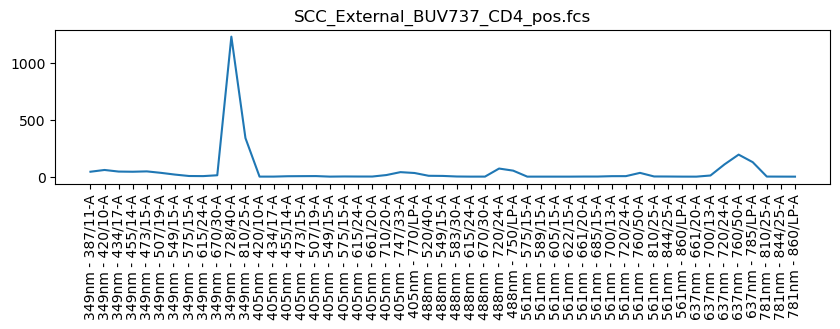

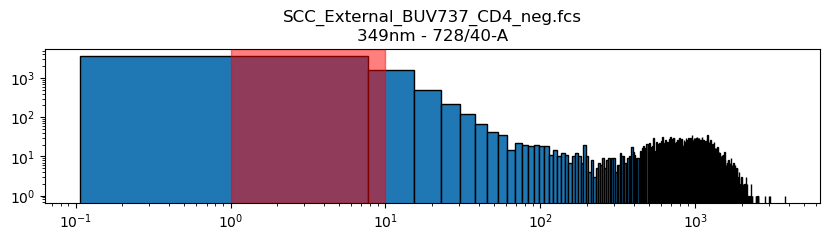

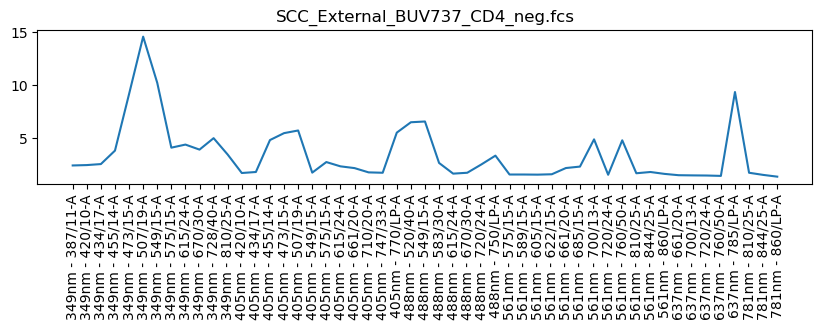

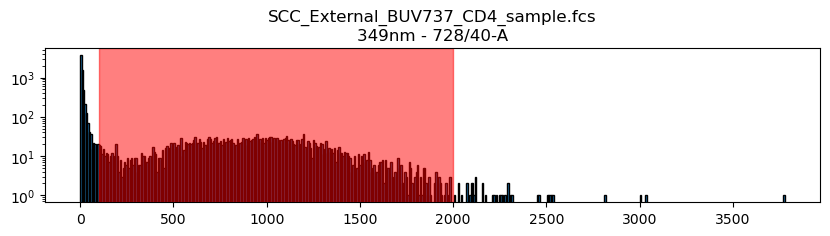

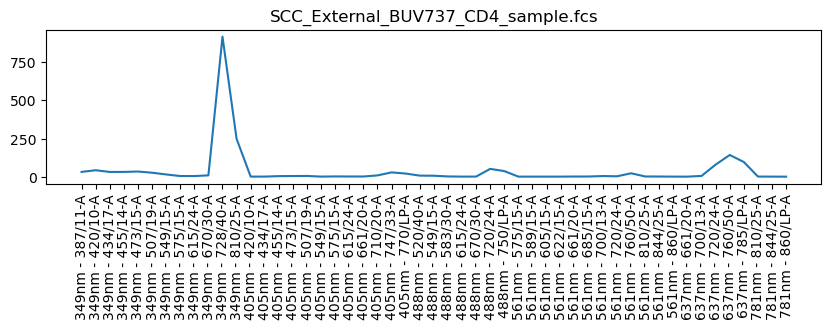

In [83]:
path = Data_dir+"/scc_external/BUV737.fcs" #NKp30
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '349nm - 728/40-A'

min = 1000
max = 2000
filename = 'SCC_External_BUV737_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_BUV737_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 2000
filename = 'SCC_External_BUV737_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




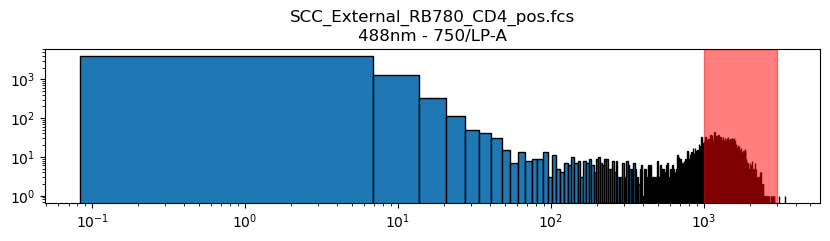

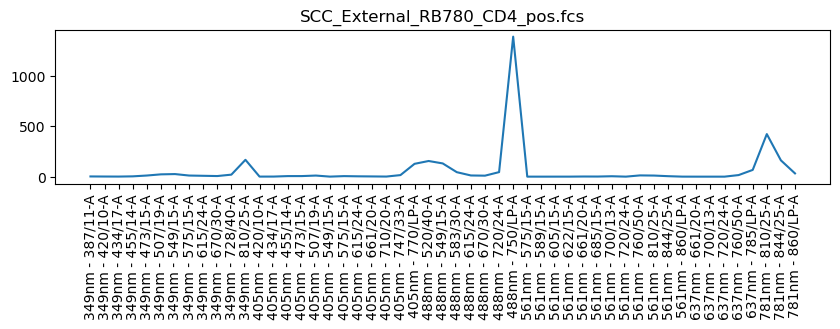

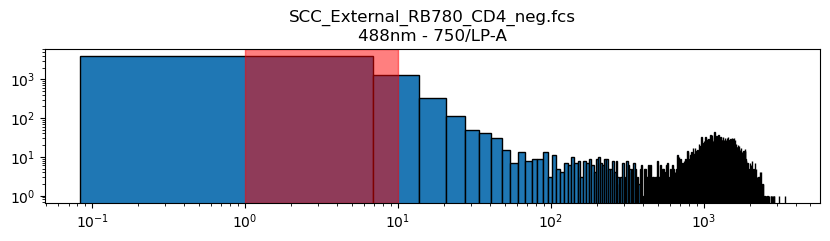

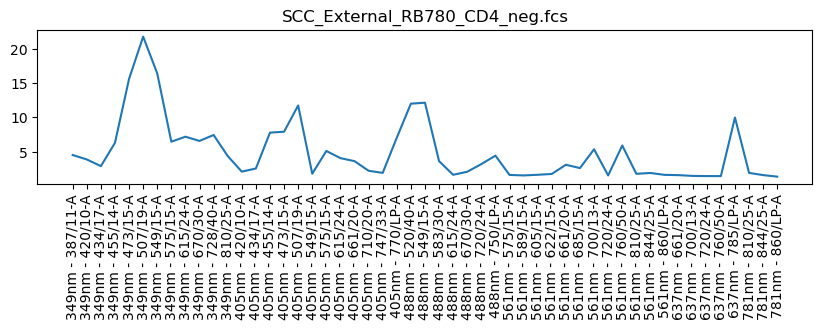

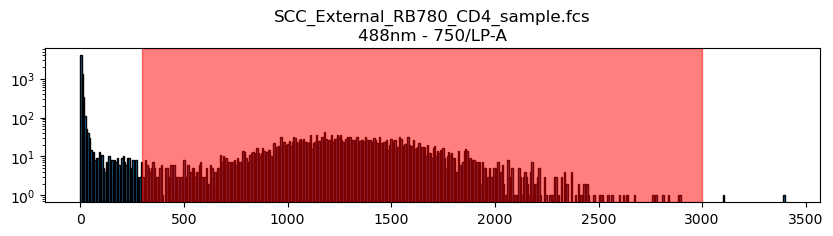

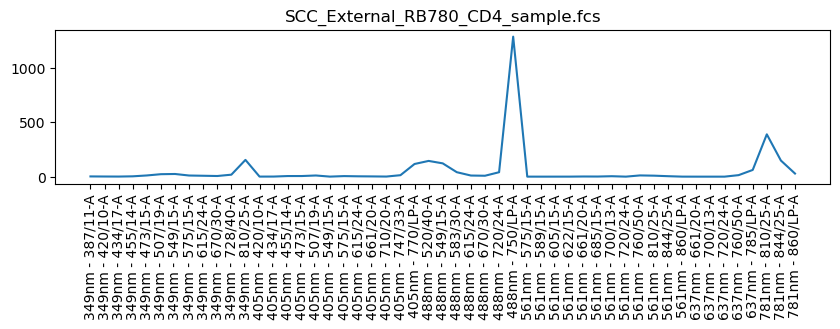

In [84]:
path = Data_dir+"/scc_external/RB780.fcs" #NKp46
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '488nm - 750/LP-A'

min = 1000
max = 3000
filename = 'SCC_External_RB780_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_RB780_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 300
max = 3000
filename = 'SCC_External_RB780_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [85]:
path = Data_dir+"/scc_external/PerCPVio700.fcs" #TCRrd no fcs file



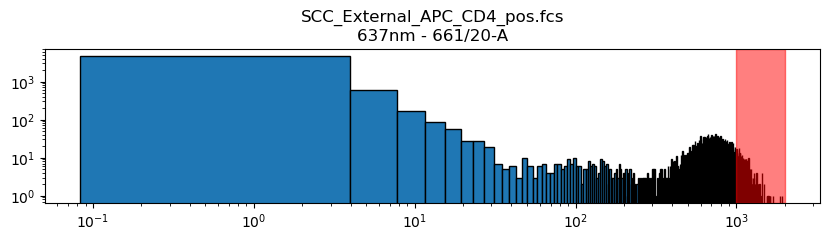

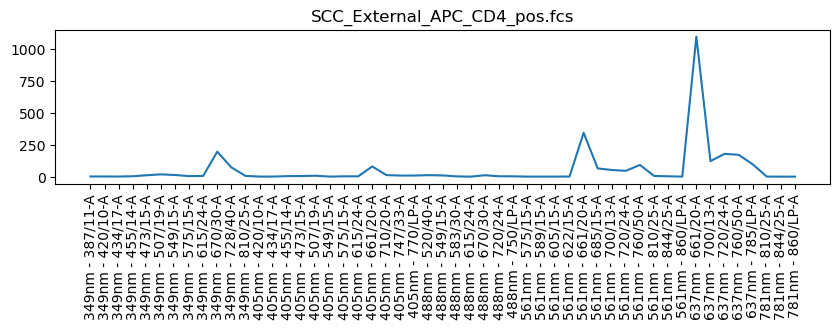

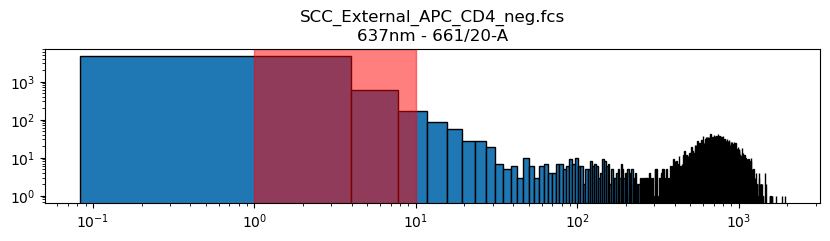

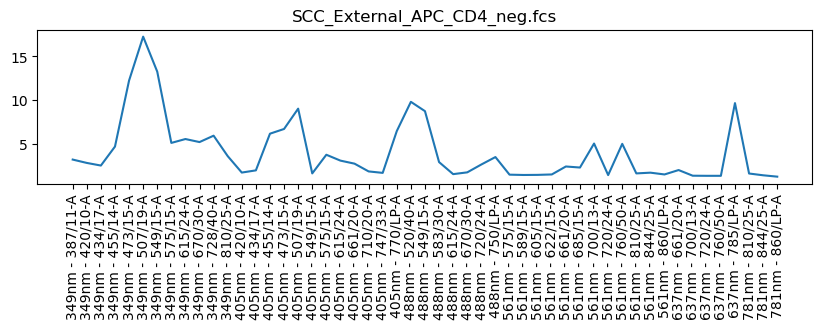

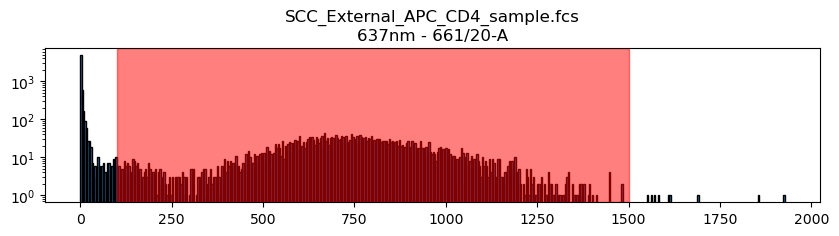

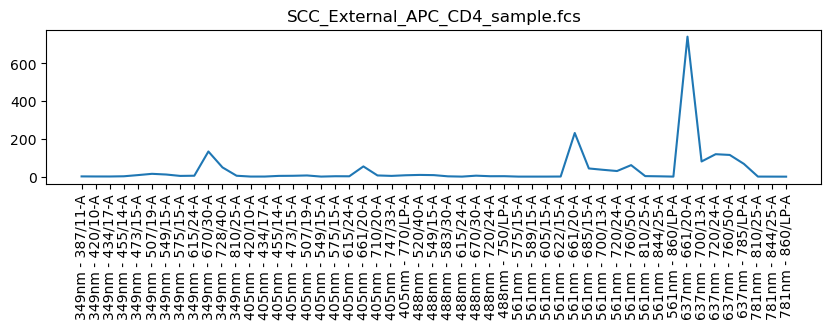

In [86]:
path = Data_dir+"/scc_external/APC.fcs" #TCRVa72
meta, data = fcsparser.parse(path, reformat_meta=True)

data = data[spectrum_channels]#reorder channels
new_columns = pd.DataFrame(0, index=data.index, columns=full_channels[0:19])
data = pd.concat([new_columns, data], axis=1)#add empty 19 columns to match the other fcs files

peak_channel = '637nm - 661/20-A'

min = 1000
max = 2000
filename = 'SCC_External_APC_CD4_pos.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 1
max = 10
filename = 'SCC_External_APC_CD4_neg.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=True,sum_method = "median")


min = 100
max = 1500
filename = 'SCC_External_APC_CD4_sample.fcs'
chn_names = data.columns.to_list()
sample_data = True
sample_size = 100000
fcs_subset(data,filename,chn_names,peak_channel,min,max,sample_data,sample_size,
           spectrum_channels,scalex=False,sum_method = "median")




In [87]:
path = Data_dir+"/scc_external/BV785.fcs" #TCRVa24Ja18 no fcs file



In [88]:
path = Data_dir+"/scc_external/PEVio770.fcs" #TCRVb11 no fcs file

